In [1]:
import csv
import itertools
import os
import re
from collections import Counter
from collections import defaultdict
from datetime import datetime
from datetime import timedelta
from string import punctuation

import matplotlib
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
from pandas.tslib import Timestamp

In [2]:
%matplotlib inline
matplotlib.rcParams['figure.max_open_warning'] = 100
matplotlib.rcParams['lines.linewidth'] = 1.0

# Grupos

## Socios activos 2016

In [3]:
# 1.       CTA: categoría para niños y jóvenes hasta bachillerato
# 2.       CTI: categoría infantil, hasta doce años y solo es para Bogotá (blaa –biblioteca Luis Ángel Arango)
# 3.       CTB: público general (solo permite préstamo de libros)
# 4.       CTC: público en general (permite préstamo de libros y material audiovisual)
# 5.       CTF: categoría familiar, pueden acceder a los beneficios hasta tres personas del grupo familiar que se asocia
# 6.       CE1, CE2, CE2: categorías empresariales (solo para instituciones)
# 7.       CIS: categoría Inclusión Social
# 8.       CTU: categoría Universitaria
# 9.       VIP: Investigadores, préstamo de 30 materiales (libros y material audiovisual)

#      Categoría de lector: CE1 Categoría empresarial                                   218
#      Categoría de lector: CE2 Categoría empresarial 2                                   5
#      Categoría de lector: CEM Categoría Empleado/Pensionado                          1593
#      Categoría de lector: CIN Categoría Interbibliotecario                            128
#      Categoría de lector: CIP Categoría Investigador                                  351
#      Categoría de lector: CIS Categoría Inclusión Preferencial                      15974
#      Categoría de lector: CIV Categoría Investigadores                                 72
#      Categoría de lector: CML Categoría Mediador de Proyectos Culturales                2
#      Categoría de lector: CSU Categoría Sucursal                                       91
#      Categoría de lector: CTA Categoría Básica A                                    10610
#      Categoría de lector: CTB Categoría B                                            1359
#      Categoría de lector: CTC Categoría C                                             224
#      Categoría de lector: CTF Categoría familiar                                     1105
#      Categoría de lector: CTI Categoría Infantil                                     1004
#      Categoría de lector: CTU Categoría General                                     17402
#      Categoría de lector: PTE PROCESOS TÉCNICOS                                        95

In [4]:
%%time

dtypes = {
    'Sucursal': str,
    'Tratamiento': str,
    'Barrio': str,
    'Ciudad': str,
    'CATEG': str,
    'Ocupación1': str,
    'Nivel Estudio1': str,
    'Área de Estudio1': str,
    'Edad': 'category',
}

perfiles_df = pd.read_csv(
    'valores_grupos_2016.csv', header=0, dtype=dtypes)
# perfiles_df = perfiles_df.fillna('')

CPU times: user 63.6 ms, sys: 7.68 ms, total: 71.3 ms
Wall time: 70.6 ms


In [5]:
perfiles_df.shape

(50272, 9)

In [6]:
perfiles_df.head()

,Sucursal,Tratamiento,Barrio,Ciudad,CATEG,Ocupación1,Nivel Estudio1,Área de Estudio1,Edad
0,BLAA,OTRO,chapinero,bogota,CIN,universidad,OTRO,OTRO,OTRO
1,BLAA,sra.,OTRO,bogota,CEM,pensionado,OTRO,OTRO,51-64
2,BLAA,sra.,icata,bogota,CEM,empleado,profesional,filosofía y letras,OTRO
3,ARM,sr.,OTRO,OTRO,CEM,empleado,profesional,economía,51-64
4,BLAA,sr.,soledad,bogota,CEM,OTRO,OTRO,OTRO,OTRO


# Bogotá

In [7]:
perfiles_bogota_df = perfiles_df[perfiles_df['Ciudad'] == 'bogota']

In [8]:
perfiles_bogota_df.shape

(23496, 9)

In [9]:
perfiles_bogota_df.head()

,Sucursal,Tratamiento,Barrio,Ciudad,CATEG,Ocupación1,Nivel Estudio1,Área de Estudio1,Edad
0,BLAA,OTRO,chapinero,bogota,CIN,universidad,OTRO,OTRO,OTRO
1,BLAA,sra.,OTRO,bogota,CEM,pensionado,OTRO,OTRO,51-64
2,BLAA,sra.,icata,bogota,CEM,empleado,profesional,filosofía y letras,OTRO
4,BLAA,sr.,soledad,bogota,CEM,OTRO,OTRO,OTRO,OTRO
5,BLAA,OTRO,galerias,bogota,CIN,OTRO,OTRO,OTRO,OTRO


## Campos a estudiar

In [10]:
columns = sorted(dtypes)

In [11]:
for c in columns:
    cns = perfiles_bogota_df[c].value_counts()
    total = cns.sum()
    otros = 0
    if 'OTRO' in cns:
        otros = cns.ix['OTRO']
    perc = '{:.2%}'.format(otros/total)
    unique = perfiles_bogota_df[c].nunique()
    print(c, perc, unique)

Barrio 8.59% 1601
CATEG 0.00% 14
Ciudad 0.00% 1
Edad 15.90% 7
Nivel Estudio1 15.07% 13
Ocupación1 2.92% 17
Sucursal 0.00% 28
Tratamiento 8.08% 3
Área de Estudio1 26.08% 113


##### => Estudiar nivel de estudios (Nivel Estudio1, 15.07% sin valor) y área de estudios (Área de Estudio1, 26.33% sin valor) en Bogotá por barrios. Considerar edad ('Edad) y sexo ('Tratamiento).

In [12]:
perfiles_bogota_df = perfiles_bogota_df[['Barrio', 'Tratamiento', 'Edad', 'Nivel Estudio1', 'Área de Estudio1']]

## Eliminando valores en blanco

In [13]:
perfiles_bogota_df = perfiles_bogota_df[
    (perfiles_bogota_df['Barrio'] != 'OTRO') &
    (perfiles_bogota_df['Tratamiento'] != 'OTRO') &
    (perfiles_bogota_df['Edad'] != 'OTRO') &
    (perfiles_bogota_df['Nivel Estudio1'] != 'OTRO') &
    (perfiles_bogota_df['Área de Estudio1'] != 'OTRO')
]

In [14]:
perfiles_bogota_df.shape

(13873, 5)

In [15]:
perfiles_bogota_df.head()

,Barrio,Tratamiento,Edad,Nivel Estudio1,Área de Estudio1
11,chapinero alto,sr.,51-64,maestría,ing. mecánica
16,santa paula,sra.,41-50,profesional,adm. de empresas comerciales
33,ciudad salitre,sr.,51-64,profesional,ing. electrónica
56,ciudad berna,sra.,51-64,profesional,contaduría
60,chapinero,sra.,51-64,profesional,derecho


## Resultados globales en toda Bogotá

#### Nivel de estudios

In [16]:
combs = [
    ('Nivel Estudio1',), # Nivel de estudio en Bogotá
    ('Tratamiento', 'Edad', 'Nivel Estudio1'), # Nivel de estudio en Bogotá por edad y sexo
]

In [17]:
%%time

combinations_counter_dict = {}

for comb in combs:
    df = perfiles_bogota_df[list(comb)]
    groups = [tuple(x) for i, x in df.iterrows()]
    counter = Counter(groups)
    combinations_counter_dict[comb] = counter
    print(comb, len(counter))

('Nivel Estudio1',) 12
('Tratamiento', 'Edad', 'Nivel Estudio1') 106
CPU times: user 2.93 s, sys: 4.71 ms, total: 2.93 s
Wall time: 2.93 s


GROUP # 1
GROUP BY: ('Tratamiento', 'Edad', 'Nivel Estudio1')
NUMBER OF GROUPS: 106
TOP 12 LARGEST GROUPS:


,"(Tratamiento, Edad, Nivel Estudio1)",size,total,percentage
0,"(sra., 16-30, universitario 1 nivel)",1928,13873,13.90%
1,"(sr., 16-30, universitario 1 nivel)",1865,13873,13.44%
2,"(sra., 16-30, universitario 2 nivel)",1739,13873,12.54%
3,"(sr., 16-30, universitario 2 nivel)",1524,13873,10.99%
4,"(sr., 31-40, profesional)",651,13873,4.69%
5,"(sra., 31-40, profesional)",517,13873,3.73%
6,"(sra., 16-30, profesional)",436,13873,3.14%
7,"(sr., 31-40, universitario 2 nivel)",390,13873,2.81%
8,"(sr., 51-64, profesional)",381,13873,2.75%
9,"(sr., 41-50, profesional)",356,13873,2.57%


GROUP # 2
GROUP BY: ('Nivel Estudio1',)
NUMBER OF GROUPS: 12
TOP 12 LARGEST GROUPS:


,"(Nivel Estudio1,)",size,total,percentage
0,"(universitario 1 nivel,)",4165,13873,30.02%
1,"(universitario 2 nivel,)",4004,13873,28.86%
2,"(profesional,)",3323,13873,23.95%
3,"(maestría,)",1177,13873,8.48%
4,"(postgrado,)",577,13873,4.16%
5,"(doctorado,)",229,13873,1.65%
6,"(graduado,)",210,13873,1.51%
7,"(técnico,)",106,13873,0.76%
8,"(tecnológico,)",45,13873,0.32%
9,"(secundaria,)",27,13873,0.19%


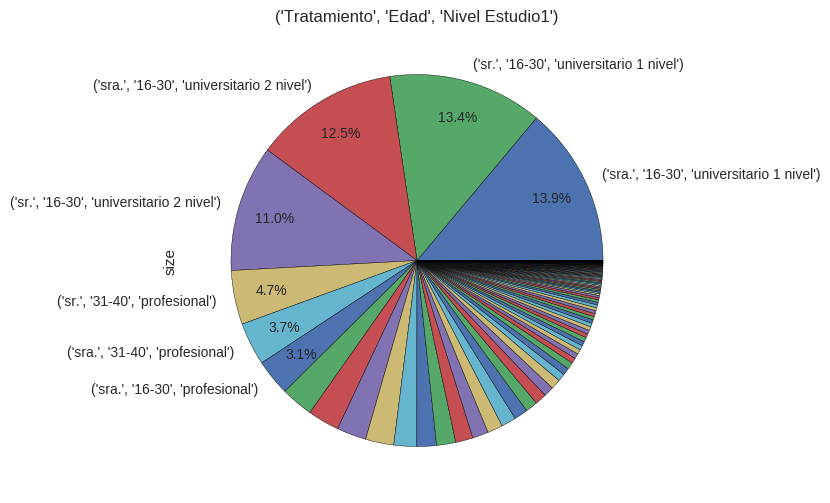

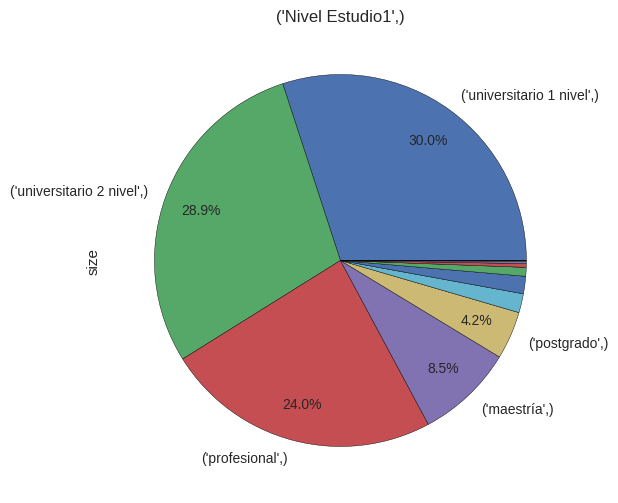

In [18]:
from IPython.display import display


def mypct(pct):
    return '%.1f%%' % pct if pct >= THRESHOLD else ''

def mylabels(count_df):
    return [(x if float(count_df.ix[[x]]['percentage'][0][:-1]) >= THRESHOLD else '') for x in count_df.index]

THRESHOLD = 3
N = 12
c = 1
for k in combinations_counter_dict:
    cn = combinations_counter_dict[k]
    print('GROUP #', c)
    print('GROUP BY:', k)
    print('NUMBER OF GROUPS:', len(cn))
    print('TOP', N, 'LARGEST GROUPS:')
    total = sum(cn.values())
    df = pd.DataFrame(
        [(a, b, total, '{:.2%}'.format(b / total)) for a, b in cn.most_common()],
        columns=(k, 'size', 'total', 'percentage'),
    )
    display(df.head(N))
    c += 1
    
    plt.figure()
    count_df = df.set_index(k)
    count_df['size'].plot(
        kind='pie', autopct=mypct, pctdistance=0.8, labels=mylabels(count_df), figsize=(6,6), title=k)

#### Área de estudios

In [19]:
combs = [
    ('Área de Estudio1',), # Área de estudio en Bogotá
    ('Tratamiento', 'Edad', 'Área de Estudio1'), # Área de estudio en Bogotá por edad y sexo
]

In [20]:
%%time

combinations_counter_dict = {}

for comb in combs:
    df = perfiles_bogota_df[list(comb)]
    groups = [tuple(x) for i, x in df.iterrows()]
    counter = Counter(groups)
    combinations_counter_dict[comb] = counter
    print(comb, len(counter))

('Área de Estudio1',) 112
('Tratamiento', 'Edad', 'Área de Estudio1') 773
CPU times: user 2.58 s, sys: 6.24 ms, total: 2.58 s
Wall time: 2.58 s


GROUP # 1
GROUP BY: ('Tratamiento', 'Edad', 'Área de Estudio1')
NUMBER OF GROUPS: 773
TOP 12 LARGEST GROUPS:


,"(Tratamiento, Edad, Área de Estudio1)",size,total,percentage
0,"(sra., 16-30, derecho)",516,13873,3.72%
1,"(sr., 16-30, derecho)",465,13873,3.35%
2,"(sra., 16-30, literatura)",270,13873,1.95%
3,"(sra., 16-30, pedagogía)",270,13873,1.95%
4,"(sr., 31-40, derecho)",224,13873,1.61%
5,"(sr., 16-30, ciencias sociales)",224,13873,1.61%
6,"(sra., 16-30, psicología)",223,13873,1.61%
7,"(sra., 16-30, idiomas)",218,13873,1.57%
8,"(sra., 16-30, ciencias sociales)",212,13873,1.53%
9,"(sr., 16-30, literatura)",200,13873,1.44%


GROUP # 2
GROUP BY: ('Área de Estudio1',)
NUMBER OF GROUPS: 112
TOP 12 LARGEST GROUPS:


,"(Área de Estudio1,)",size,total,percentage
0,"(derecho,)",1713,13873,12.35%
1,"(literatura,)",747,13873,5.38%
2,"(pedagogía,)",667,13873,4.81%
3,"(ciencias sociales,)",655,13873,4.72%
4,"(psicología,)",569,13873,4.10%
5,"(filosofía y letras,)",548,13873,3.95%
6,"(historia,)",535,13873,3.86%
7,"(idiomas,)",481,13873,3.47%
8,"(economía,)",416,13873,3.00%
9,"(arquitectura,)",350,13873,2.52%


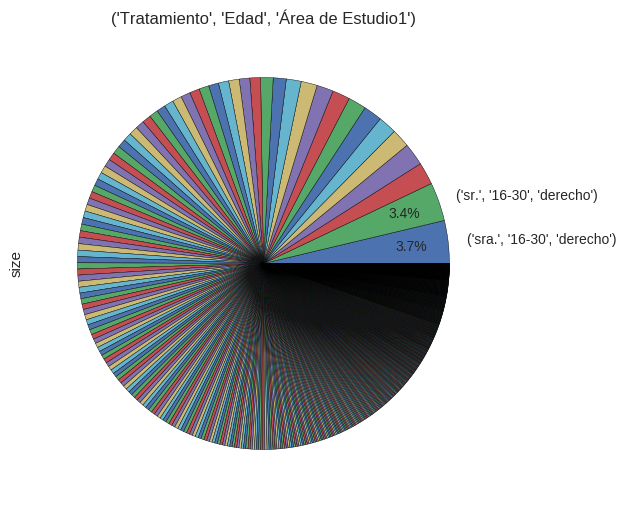

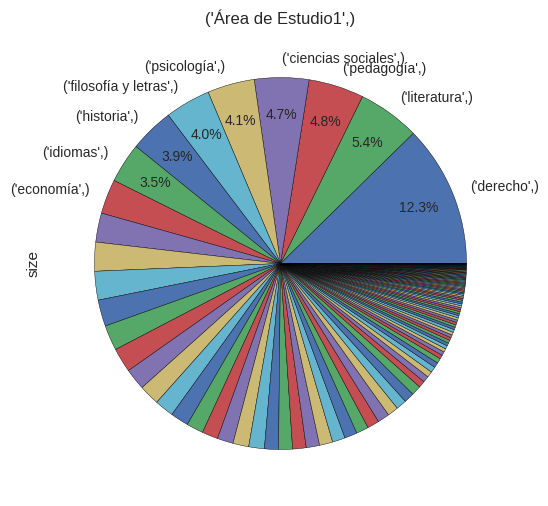

In [21]:
from IPython.display import display


def mypct(pct):
    return '%.1f%%' % pct if pct >= THRESHOLD else ''

def mylabels(count_df):
    return [(x if float(count_df.ix[[x]]['percentage'][0][:-1]) >= THRESHOLD else '') for x in count_df.index]

THRESHOLD = 3
N = 12
c = 1
for k in combinations_counter_dict:
    cn = combinations_counter_dict[k]
    print('GROUP #', c)
    print('GROUP BY:', k)
    print('NUMBER OF GROUPS:', len(cn))
    print('TOP', N, 'LARGEST GROUPS:')
    total = sum(cn.values())
    df = pd.DataFrame(
        [(a, b, total, '{:.2%}'.format(b / total)) for a, b in cn.most_common()],
        columns=(k, 'size', 'total', 'percentage'),
    )
    display(df.head(N))
    c += 1
    
    plt.figure()
    count_df = df.set_index(k)
    count_df['size'].plot(
        kind='pie', autopct=mypct, pctdistance=0.8, labels=mylabels(count_df), figsize=(6,6), title=k)

## Resultados por barrios

In [22]:
barrios_counter_df = perfiles_bogota_df['Barrio'].value_counts()

In [23]:
barrios_counter_df

chapinero                  304
candelaria                 194
soledad                    162
castilla                   158
fontibon                   157
cedritos                   153
modelia                    141
palermo                    133
teusaquillo                119
centro                     109
ciudad salitre             109
chapinero alto             108
recuerdo                   104
macarena                   101
aguas                      100
quinta paredes              93
galerias                    93
santa isabel                90
nieves                      89
ciudadela colsubsidio       89
kennedy                     88
gran america                80
suba                        78
santa barbara               77
belalcazar                  73
villas de granada           73
timiza                      69
san antonio                 68
chico                       68
nicolas de federman         68
                          ... 
jardin norte                 1
ospina p

##### 3 categorías: (a) x < 10, (b) 10 <= x < 100, (c) 100 <= x

## (c) 100 <= x

In [24]:
for b, c in barrios_counter_df.iteritems():
    if c >= 100:
        print(b, c)

chapinero 304
candelaria 194
soledad 162
castilla 158
fontibon 157
cedritos 153
modelia 141
palermo 133
teusaquillo 119
centro 109
ciudad salitre 109
chapinero alto 108
recuerdo 104
macarena 101
aguas 100


### chapinero

In [25]:
b = 'chapinero'

In [26]:
barrio_bogota_df = perfiles_bogota_df[perfiles_bogota_df['Barrio'] == b]

#### Nivel de estudios

In [27]:
combs = [
    ('Nivel Estudio1',), # Nivel de estudio en el barrio
    ('Tratamiento', 'Edad', 'Nivel Estudio1'), # Nivel de estudio en el barrio por edad y sexo
]

In [28]:
%%time

combinations_counter_dict = {}

for comb in combs:
    df = barrio_bogota_df[list(comb)]
    groups = [tuple(x) for i, x in df.iterrows()]
    counter = Counter(groups)
    combinations_counter_dict[comb] = counter
    print(comb, len(counter))

('Nivel Estudio1',) 10
('Tratamiento', 'Edad', 'Nivel Estudio1') 50
CPU times: user 65.1 ms, sys: 0 ns, total: 65.1 ms
Wall time: 64 ms


GROUP # 1
GROUP BY: ('Tratamiento', 'Edad', 'Nivel Estudio1')
NUMBER OF GROUPS: 50
TOP 12 LARGEST GROUPS:


,"(Tratamiento, Edad, Nivel Estudio1)",size,total,percentage
0,"(sr., 31-40, profesional)",26,304,8.55%
1,"(sra., 16-30, universitario 1 nivel)",23,304,7.57%
2,"(sr., 16-30, universitario 2 nivel)",22,304,7.24%
3,"(sr., 16-30, universitario 1 nivel)",22,304,7.24%
4,"(sra., 31-40, profesional)",20,304,6.58%
5,"(sra., 16-30, universitario 2 nivel)",19,304,6.25%
6,"(sr., 41-50, profesional)",13,304,4.28%
7,"(sr., 16-30, profesional)",12,304,3.95%
8,"(sra., 16-30, profesional)",11,304,3.62%
9,"(sr., 51-64, profesional)",10,304,3.29%


GROUP # 2
GROUP BY: ('Nivel Estudio1',)
NUMBER OF GROUPS: 10
TOP 12 LARGEST GROUPS:


,"(Nivel Estudio1,)",size,total,percentage
0,"(profesional,)",112,304,36.84%
1,"(universitario 2 nivel,)",58,304,19.08%
2,"(universitario 1 nivel,)",53,304,17.43%
3,"(maestría,)",38,304,12.50%
4,"(postgrado,)",17,304,5.59%
5,"(doctorado,)",14,304,4.61%
6,"(graduado,)",8,304,2.63%
7,"(tecnológico,)",2,304,0.66%
8,"(básica primaria,)",1,304,0.33%
9,"(técnico,)",1,304,0.33%


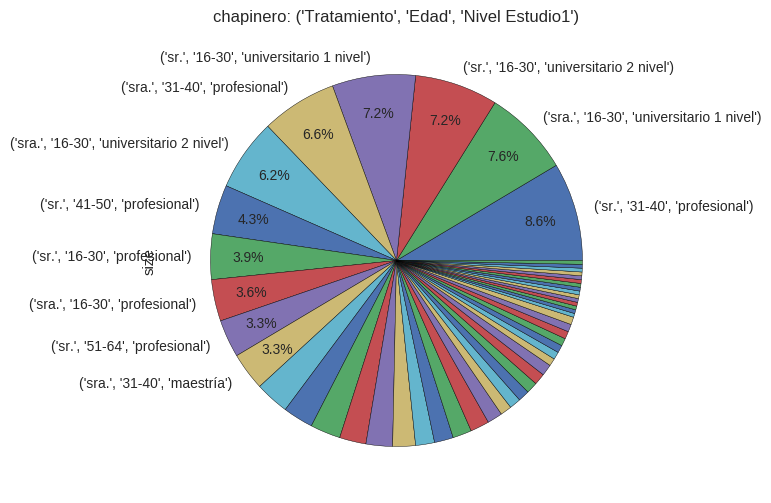

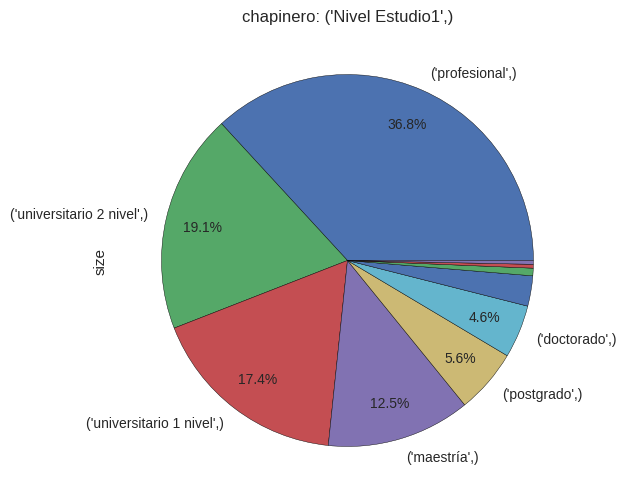

In [29]:
from IPython.display import display


def mypct(pct):
    return '%.1f%%' % pct if pct >= THRESHOLD else ''

def mylabels(count_df):
    return [(x if float(count_df.ix[[x]]['percentage'][0][:-1]) >= THRESHOLD else '') for x in count_df.index]

THRESHOLD = 3
N = 12
c = 1
for k in combinations_counter_dict:
    cn = combinations_counter_dict[k]
    print('GROUP #', c)
    print('GROUP BY:', k)
    print('NUMBER OF GROUPS:', len(cn))
    print('TOP', N, 'LARGEST GROUPS:')
    total = sum(cn.values())
    df = pd.DataFrame(
        [(a, b, total, '{:.2%}'.format(b / total)) for a, b in cn.most_common()],
        columns=(k, 'size', 'total', 'percentage'),
    )
    display(df.head(N))
    c += 1
    
    plt.figure()
    count_df = df.set_index(k)
    count_df['size'].plot(
        kind='pie', autopct=mypct, pctdistance=0.8, labels=mylabels(count_df), figsize=(6,6), title=b + ': ' + str(k))

#### Área de estudios

In [30]:
combs = [
    ('Área de Estudio1',), # Área de estudio en el barrio
    ('Tratamiento', 'Edad', 'Área de Estudio1'), # Área de estudio en el barrio por edad y sexo
]

In [31]:
%%time

combinations_counter_dict = {}

for comb in combs:
    df = barrio_bogota_df[list(comb)]
    groups = [tuple(x) for i, x in df.iterrows()]
    counter = Counter(groups)
    combinations_counter_dict[comb] = counter
    print(comb, len(counter))

('Área de Estudio1',) 56
('Tratamiento', 'Edad', 'Área de Estudio1') 161
CPU times: user 63.3 ms, sys: 11.8 ms, total: 75.1 ms
Wall time: 58.7 ms


GROUP # 1
GROUP BY: ('Tratamiento', 'Edad', 'Área de Estudio1')
NUMBER OF GROUPS: 161
TOP 12 LARGEST GROUPS:


,"(Tratamiento, Edad, Área de Estudio1)",size,total,percentage
0,"(sr., 16-30, derecho)",11,304,3.62%
1,"(sra., 16-30, derecho)",10,304,3.29%
2,"(sr., 31-40, derecho)",7,304,2.30%
3,"(sra., 31-40, derecho)",6,304,1.97%
4,"(sra., 16-30, relaciones internacionales)",6,304,1.97%
5,"(sr., 16-30, economía)",5,304,1.64%
6,"(sr., 65+, derecho)",5,304,1.64%
7,"(sr., 31-40, historia)",5,304,1.64%
8,"(sra., 31-40, antropología)",5,304,1.64%
9,"(sr., 16-30, literatura)",5,304,1.64%


GROUP # 2
GROUP BY: ('Área de Estudio1',)
NUMBER OF GROUPS: 56
TOP 12 LARGEST GROUPS:


,"(Área de Estudio1,)",size,total,percentage
0,"(derecho,)",47,304,15.46%
1,"(literatura,)",17,304,5.59%
2,"(historia,)",15,304,4.93%
3,"(economía,)",14,304,4.61%
4,"(filosofía y letras,)",14,304,4.61%
5,"(psicología,)",14,304,4.61%
6,"(antropología,)",12,304,3.95%
7,"(comunicación social,)",11,304,3.62%
8,"(artes plásticas,)",11,304,3.62%
9,"(ciencias políticas,)",10,304,3.29%


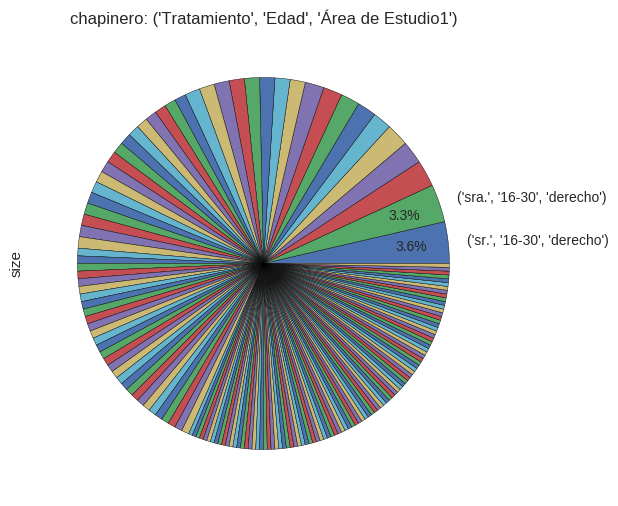

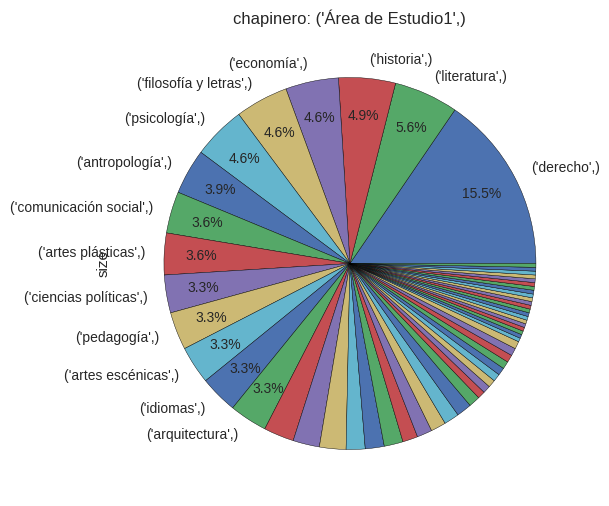

In [32]:
from IPython.display import display


def mypct(pct):
    return '%.1f%%' % pct if pct >= THRESHOLD else ''

def mylabels(count_df):
    return [(x if float(count_df.ix[[x]]['percentage'][0][:-1]) >= THRESHOLD else '') for x in count_df.index]

THRESHOLD = 3
N = 12
c = 1
for k in combinations_counter_dict:
    cn = combinations_counter_dict[k]
    print('GROUP #', c)
    print('GROUP BY:', k)
    print('NUMBER OF GROUPS:', len(cn))
    print('TOP', N, 'LARGEST GROUPS:')
    total = sum(cn.values())
    df = pd.DataFrame(
        [(a, b, total, '{:.2%}'.format(b / total)) for a, b in cn.most_common()],
        columns=(k, 'size', 'total', 'percentage'),
    )
    display(df.head(N))
    c += 1
    
    plt.figure()
    count_df = df.set_index(k)
    count_df['size'].plot(
        kind='pie', autopct=mypct, pctdistance=0.8, labels=mylabels(count_df), figsize=(6,6), title=b + ': ' + str(k))

In [33]:
for b, c in barrios_counter_df.iteritems():
    if c >= 100:
        print(b, c)

chapinero 304
candelaria 194
soledad 162
castilla 158
fontibon 157
cedritos 153
modelia 141
palermo 133
teusaquillo 119
centro 109
ciudad salitre 109
chapinero alto 108
recuerdo 104
macarena 101
aguas 100


### candelaria

In [34]:
b = 'candelaria'

In [35]:
barrio_bogota_df = perfiles_bogota_df[perfiles_bogota_df['Barrio'] == b]

#### Nivel de estudios

In [36]:
combs = [
    ('Nivel Estudio1',), # Nivel de estudio en el barrio
    ('Tratamiento', 'Edad', 'Nivel Estudio1'), # Nivel de estudio en el barrio por edad y sexo
]

In [37]:
%%time

combinations_counter_dict = {}

for comb in combs:
    df = barrio_bogota_df[list(comb)]
    groups = [tuple(x) for i, x in df.iterrows()]
    counter = Counter(groups)
    combinations_counter_dict[comb] = counter
    print(comb, len(counter))

('Nivel Estudio1',) 9
('Tratamiento', 'Edad', 'Nivel Estudio1') 47
CPU times: user 63.2 ms, sys: 0 ns, total: 63.2 ms
Wall time: 61.6 ms


GROUP # 1
GROUP BY: ('Tratamiento', 'Edad', 'Nivel Estudio1')
NUMBER OF GROUPS: 47
TOP 12 LARGEST GROUPS:


,"(Tratamiento, Edad, Nivel Estudio1)",size,total,percentage
0,"(sra., 16-30, universitario 1 nivel)",17,194,8.76%
1,"(sra., 16-30, universitario 2 nivel)",16,194,8.25%
2,"(sr., 16-30, universitario 1 nivel)",13,194,6.70%
3,"(sr., 16-30, universitario 2 nivel)",12,194,6.19%
4,"(sra., 31-40, profesional)",11,194,5.67%
5,"(sr., 31-40, profesional)",10,194,5.15%
6,"(sr., 41-50, profesional)",9,194,4.64%
7,"(sr., 16-30, profesional)",8,194,4.12%
8,"(sr., 31-40, maestría)",7,194,3.61%
9,"(sr., 51-64, profesional)",6,194,3.09%


GROUP # 2
GROUP BY: ('Nivel Estudio1',)
NUMBER OF GROUPS: 9
TOP 12 LARGEST GROUPS:


,"(Nivel Estudio1,)",size,total,percentage
0,"(profesional,)",65,194,33.51%
1,"(universitario 2 nivel,)",38,194,19.59%
2,"(universitario 1 nivel,)",36,194,18.56%
3,"(maestría,)",27,194,13.92%
4,"(postgrado,)",13,194,6.70%
5,"(doctorado,)",7,194,3.61%
6,"(graduado,)",6,194,3.09%
7,"(técnico,)",1,194,0.52%
8,"(tecnológico,)",1,194,0.52%


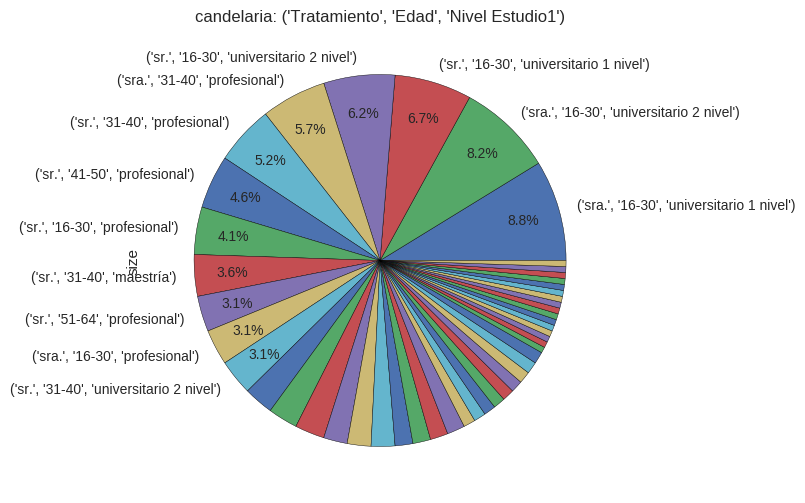

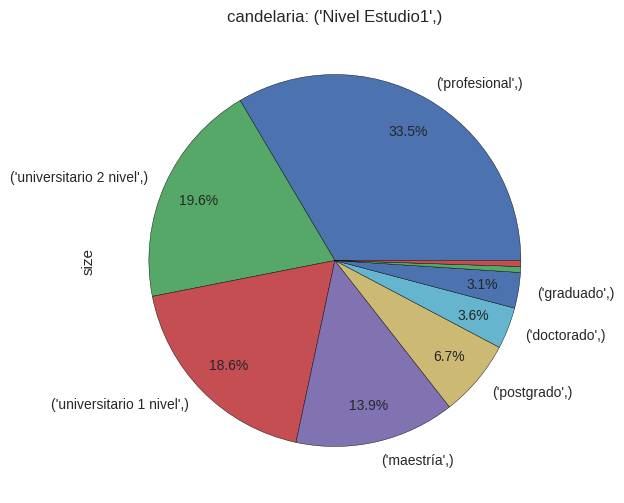

In [38]:
from IPython.display import display


def mypct(pct):
    return '%.1f%%' % pct if pct >= THRESHOLD else ''

def mylabels(count_df):
    return [(x if float(count_df.ix[[x]]['percentage'][0][:-1]) >= THRESHOLD else '') for x in count_df.index]

THRESHOLD = 3
N = 12
c = 1
for k in combinations_counter_dict:
    cn = combinations_counter_dict[k]
    print('GROUP #', c)
    print('GROUP BY:', k)
    print('NUMBER OF GROUPS:', len(cn))
    print('TOP', N, 'LARGEST GROUPS:')
    total = sum(cn.values())
    df = pd.DataFrame(
        [(a, b, total, '{:.2%}'.format(b / total)) for a, b in cn.most_common()],
        columns=(k, 'size', 'total', 'percentage'),
    )
    display(df.head(N))
    c += 1
    
    plt.figure()
    count_df = df.set_index(k)
    count_df['size'].plot(
        kind='pie', autopct=mypct, pctdistance=0.8, labels=mylabels(count_df), figsize=(6,6), title=b + ': ' + str(k))

#### Área de estudios

In [39]:
combs = [
    ('Área de Estudio1',), # Área de estudio en el barrio
    ('Tratamiento', 'Edad', 'Área de Estudio1'), # Área de estudio en el barrio por edad y sexo
]

In [40]:
%%time

combinations_counter_dict = {}

for comb in combs:
    df = barrio_bogota_df[list(comb)]
    groups = [tuple(x) for i, x in df.iterrows()]
    counter = Counter(groups)
    combinations_counter_dict[comb] = counter
    print(comb, len(counter))

('Área de Estudio1',) 51
('Tratamiento', 'Edad', 'Área de Estudio1') 119
CPU times: user 39.4 ms, sys: 15.8 ms, total: 55.2 ms
Wall time: 40.2 ms


GROUP # 1
GROUP BY: ('Tratamiento', 'Edad', 'Área de Estudio1')
NUMBER OF GROUPS: 119
TOP 12 LARGEST GROUPS:


,"(Tratamiento, Edad, Área de Estudio1)",size,total,percentage
0,"(sra., 16-30, derecho)",8,194,4.12%
1,"(sr., 16-30, derecho)",6,194,3.09%
2,"(sra., 31-40, psicología)",4,194,2.06%
3,"(sra., 16-30, psicología)",4,194,2.06%
4,"(sra., 41-50, derecho)",4,194,2.06%
5,"(sr., 31-40, filosofía y letras)",4,194,2.06%
6,"(sra., 16-30, ciencias sociales)",4,194,2.06%
7,"(sr., 16-30, historia)",4,194,2.06%
8,"(sr., 16-30, sociología)",3,194,1.55%
9,"(sr., 31-40, ciencias sociales)",3,194,1.55%


GROUP # 2
GROUP BY: ('Área de Estudio1',)
NUMBER OF GROUPS: 51
TOP 12 LARGEST GROUPS:


,"(Área de Estudio1,)",size,total,percentage
0,"(derecho,)",30,194,15.46%
1,"(ciencias sociales,)",12,194,6.19%
2,"(historia,)",10,194,5.15%
3,"(literatura,)",9,194,4.64%
4,"(filosofía y letras,)",9,194,4.64%
5,"(psicología,)",9,194,4.64%
6,"(ciencias políticas,)",7,194,3.61%
7,"(artes escénicas,)",7,194,3.61%
8,"(antropología,)",7,194,3.61%
9,"(sociología,)",6,194,3.09%


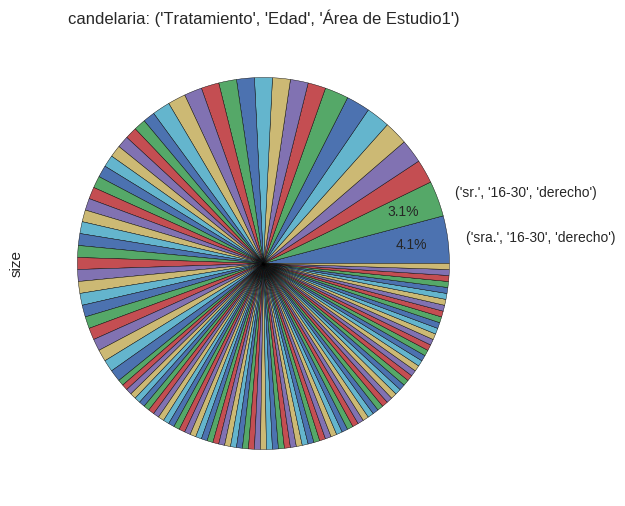

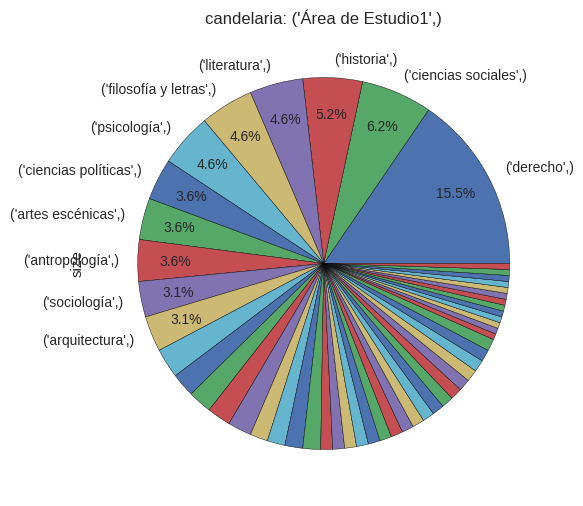

In [41]:
from IPython.display import display


def mypct(pct):
    return '%.1f%%' % pct if pct >= THRESHOLD else ''

def mylabels(count_df):
    return [(x if float(count_df.ix[[x]]['percentage'][0][:-1]) >= THRESHOLD else '') for x in count_df.index]

THRESHOLD = 3
N = 12
c = 1
for k in combinations_counter_dict:
    cn = combinations_counter_dict[k]
    print('GROUP #', c)
    print('GROUP BY:', k)
    print('NUMBER OF GROUPS:', len(cn))
    print('TOP', N, 'LARGEST GROUPS:')
    total = sum(cn.values())
    df = pd.DataFrame(
        [(a, b, total, '{:.2%}'.format(b / total)) for a, b in cn.most_common()],
        columns=(k, 'size', 'total', 'percentage'),
    )
    display(df.head(N))
    c += 1
    
    plt.figure()
    count_df = df.set_index(k)
    count_df['size'].plot(
        kind='pie', autopct=mypct, pctdistance=0.8, labels=mylabels(count_df), figsize=(6,6), title=b + ': ' + str(k))

In [42]:
for b, c in barrios_counter_df.iteritems():
    if c >= 100:
        print(b, c)

chapinero 304
candelaria 194
soledad 162
castilla 158
fontibon 157
cedritos 153
modelia 141
palermo 133
teusaquillo 119
centro 109
ciudad salitre 109
chapinero alto 108
recuerdo 104
macarena 101
aguas 100


### soledad

In [43]:
b = 'soledad'

In [44]:
barrio_bogota_df = perfiles_bogota_df[perfiles_bogota_df['Barrio'] == b]

#### Nivel de estudios

In [45]:
combs = [
    ('Nivel Estudio1',), # Nivel de estudio en el barrio
    ('Tratamiento', 'Edad', 'Nivel Estudio1'), # Nivel de estudio en el barrio por edad y sexo
]

In [46]:
%%time

combinations_counter_dict = {}

for comb in combs:
    df = barrio_bogota_df[list(comb)]
    groups = [tuple(x) for i, x in df.iterrows()]
    counter = Counter(groups)
    combinations_counter_dict[comb] = counter
    print(comb, len(counter))

('Nivel Estudio1',) 8
('Tratamiento', 'Edad', 'Nivel Estudio1') 34
CPU times: user 36.2 ms, sys: 0 ns, total: 36.2 ms
Wall time: 34.9 ms


GROUP # 1
GROUP BY: ('Tratamiento', 'Edad', 'Nivel Estudio1')
NUMBER OF GROUPS: 34
TOP 12 LARGEST GROUPS:


,"(Tratamiento, Edad, Nivel Estudio1)",size,total,percentage
0,"(sr., 16-30, universitario 1 nivel)",30,162,18.52%
1,"(sr., 16-30, universitario 2 nivel)",13,162,8.02%
2,"(sr., 51-64, profesional)",11,162,6.79%
3,"(sra., 16-30, universitario 1 nivel)",11,162,6.79%
4,"(sra., 16-30, universitario 2 nivel)",10,162,6.17%
5,"(sr., 16-30, profesional)",10,162,6.17%
6,"(sra., 16-30, profesional)",8,162,4.94%
7,"(sra., 31-40, profesional)",8,162,4.94%
8,"(sr., 41-50, profesional)",6,162,3.70%
9,"(sr., 31-40, profesional)",5,162,3.09%


GROUP # 2
GROUP BY: ('Nivel Estudio1',)
NUMBER OF GROUPS: 8
TOP 12 LARGEST GROUPS:


,"(Nivel Estudio1,)",size,total,percentage
0,"(profesional,)",58,162,35.80%
1,"(universitario 1 nivel,)",43,162,26.54%
2,"(universitario 2 nivel,)",30,162,18.52%
3,"(maestría,)",17,162,10.49%
4,"(postgrado,)",6,162,3.70%
5,"(doctorado,)",5,162,3.09%
6,"(graduado,)",2,162,1.23%
7,"(técnico,)",1,162,0.62%


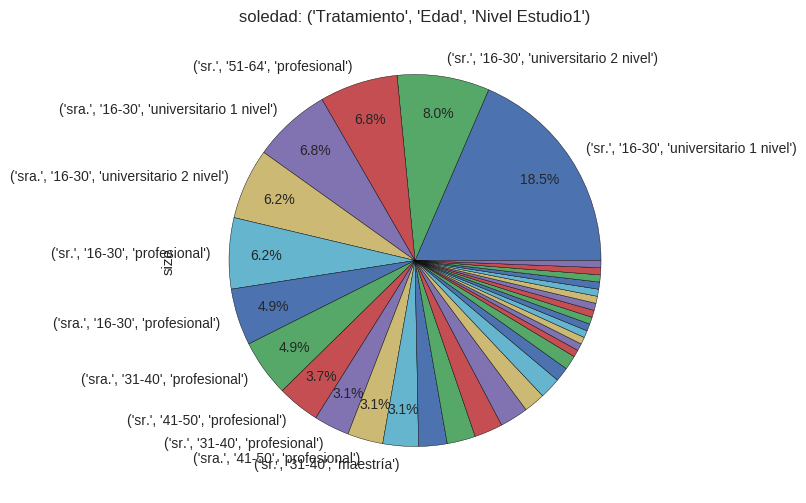

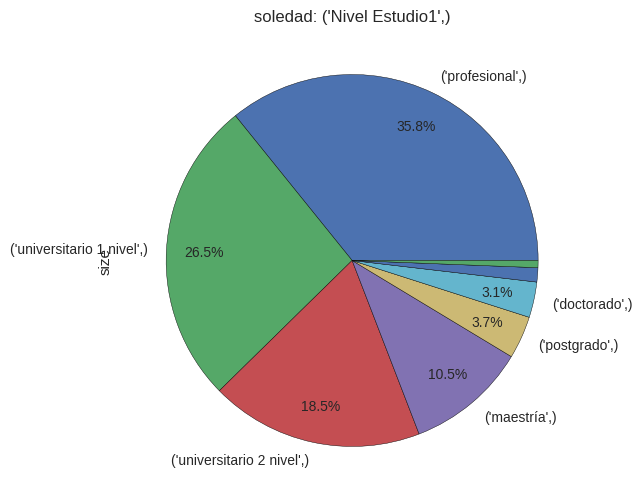

In [47]:
from IPython.display import display


def mypct(pct):
    return '%.1f%%' % pct if pct >= THRESHOLD else ''

def mylabels(count_df):
    return [(x if float(count_df.ix[[x]]['percentage'][0][:-1]) >= THRESHOLD else '') for x in count_df.index]

THRESHOLD = 3
N = 12
c = 1
for k in combinations_counter_dict:
    cn = combinations_counter_dict[k]
    print('GROUP #', c)
    print('GROUP BY:', k)
    print('NUMBER OF GROUPS:', len(cn))
    print('TOP', N, 'LARGEST GROUPS:')
    total = sum(cn.values())
    df = pd.DataFrame(
        [(a, b, total, '{:.2%}'.format(b / total)) for a, b in cn.most_common()],
        columns=(k, 'size', 'total', 'percentage'),
    )
    display(df.head(N))
    c += 1
    
    plt.figure()
    count_df = df.set_index(k)
    count_df['size'].plot(
        kind='pie', autopct=mypct, pctdistance=0.8, labels=mylabels(count_df), figsize=(6,6), title=b + ': ' + str(k))

#### Área de estudios

In [48]:
combs = [
    ('Área de Estudio1',), # Área de estudio en el barrio
    ('Tratamiento', 'Edad', 'Área de Estudio1'), # Área de estudio en el barrio por edad y sexo
]

In [49]:
%%time

combinations_counter_dict = {}

for comb in combs:
    df = barrio_bogota_df[list(comb)]
    groups = [tuple(x) for i, x in df.iterrows()]
    counter = Counter(groups)
    combinations_counter_dict[comb] = counter
    print(comb, len(counter))

('Área de Estudio1',) 47
('Tratamiento', 'Edad', 'Área de Estudio1') 99
CPU times: user 36.5 ms, sys: 67 µs, total: 36.6 ms
Wall time: 35.8 ms


GROUP # 1
GROUP BY: ('Tratamiento', 'Edad', 'Área de Estudio1')
NUMBER OF GROUPS: 99
TOP 12 LARGEST GROUPS:


,"(Tratamiento, Edad, Área de Estudio1)",size,total,percentage
0,"(sr., 16-30, historia)",8,162,4.94%
1,"(sr., 16-30, derecho)",6,162,3.70%
2,"(sra., 16-30, literatura)",5,162,3.09%
3,"(sr., 16-30, antropología)",5,162,3.09%
4,"(sr., 51-64, literatura)",4,162,2.47%
5,"(sra., 16-30, artes escénicas)",4,162,2.47%
6,"(sr., 16-30, ing. mecánica)",4,162,2.47%
7,"(sra., 16-30, ciencias políticas)",4,162,2.47%
8,"(sr., 16-30, sociología)",3,162,1.85%
9,"(sra., 31-40, literatura)",3,162,1.85%


GROUP # 2
GROUP BY: ('Área de Estudio1',)
NUMBER OF GROUPS: 47
TOP 12 LARGEST GROUPS:


,"(Área de Estudio1,)",size,total,percentage
0,"(literatura,)",16,162,9.88%
1,"(historia,)",16,162,9.88%
2,"(derecho,)",11,162,6.79%
3,"(ciencias políticas,)",9,162,5.56%
4,"(artes escénicas,)",9,162,5.56%
5,"(antropología,)",8,162,4.94%
6,"(filosofía y letras,)",7,162,4.32%
7,"(sociología,)",7,162,4.32%
8,"(cine fotografía y televisión,)",6,162,3.70%
9,"(música,)",5,162,3.09%


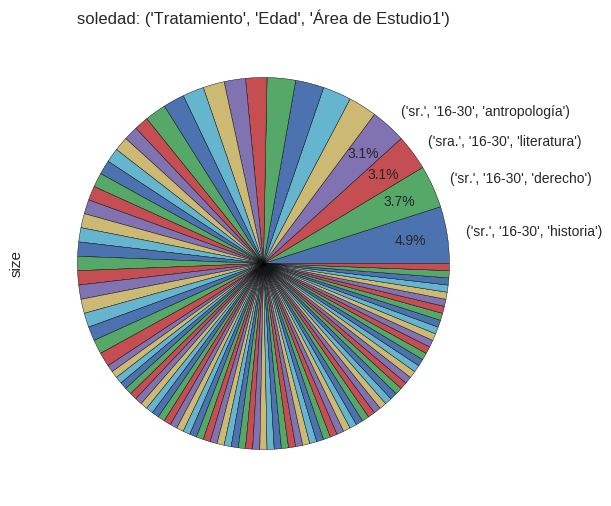

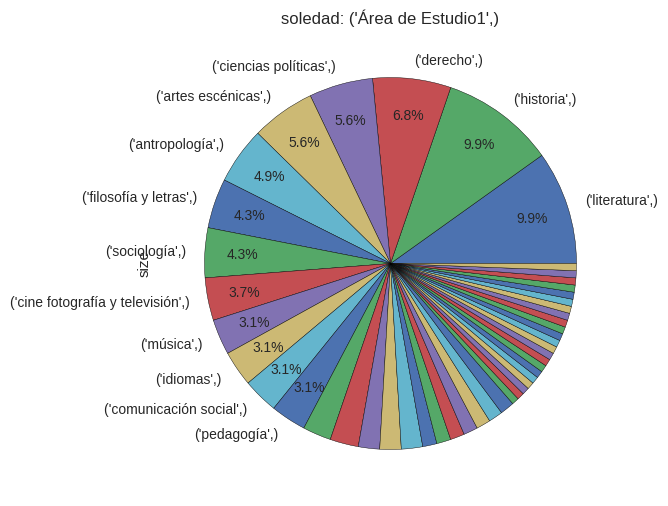

In [50]:
from IPython.display import display


def mypct(pct):
    return '%.1f%%' % pct if pct >= THRESHOLD else ''

def mylabels(count_df):
    return [(x if float(count_df.ix[[x]]['percentage'][0][:-1]) >= THRESHOLD else '') for x in count_df.index]

THRESHOLD = 3
N = 12
c = 1
for k in combinations_counter_dict:
    cn = combinations_counter_dict[k]
    print('GROUP #', c)
    print('GROUP BY:', k)
    print('NUMBER OF GROUPS:', len(cn))
    print('TOP', N, 'LARGEST GROUPS:')
    total = sum(cn.values())
    df = pd.DataFrame(
        [(a, b, total, '{:.2%}'.format(b / total)) for a, b in cn.most_common()],
        columns=(k, 'size', 'total', 'percentage'),
    )
    display(df.head(N))
    c += 1
    
    plt.figure()
    count_df = df.set_index(k)
    count_df['size'].plot(
        kind='pie', autopct=mypct, pctdistance=0.8, labels=mylabels(count_df), figsize=(6,6), title=b + ': ' + str(k))

In [51]:
for b, c in barrios_counter_df.iteritems():
    if c >= 100:
        print(b, c)

chapinero 304
candelaria 194
soledad 162
castilla 158
fontibon 157
cedritos 153
modelia 141
palermo 133
teusaquillo 119
centro 109
ciudad salitre 109
chapinero alto 108
recuerdo 104
macarena 101
aguas 100


### castilla

In [52]:
b = 'castilla'

In [53]:
barrio_bogota_df = perfiles_bogota_df[perfiles_bogota_df['Barrio'] == b]

#### Nivel de estudios

In [54]:
combs = [
    ('Nivel Estudio1',), # Nivel de estudio en el barrio
    ('Tratamiento', 'Edad', 'Nivel Estudio1'), # Nivel de estudio en el barrio por edad y sexo
]

In [55]:
%%time

combinations_counter_dict = {}

for comb in combs:
    df = barrio_bogota_df[list(comb)]
    groups = [tuple(x) for i, x in df.iterrows()]
    counter = Counter(groups)
    combinations_counter_dict[comb] = counter
    print(comb, len(counter))

('Nivel Estudio1',) 8
('Tratamiento', 'Edad', 'Nivel Estudio1') 32
CPU times: user 38 ms, sys: 629 µs, total: 38.6 ms
Wall time: 37.8 ms


GROUP # 1
GROUP BY: ('Tratamiento', 'Edad', 'Nivel Estudio1')
NUMBER OF GROUPS: 32
TOP 12 LARGEST GROUPS:


,"(Tratamiento, Edad, Nivel Estudio1)",size,total,percentage
0,"(sra., 16-30, universitario 1 nivel)",24,158,15.19%
1,"(sr., 16-30, universitario 1 nivel)",21,158,13.29%
2,"(sra., 16-30, universitario 2 nivel)",19,158,12.03%
3,"(sr., 16-30, universitario 2 nivel)",16,158,10.13%
4,"(sra., 16-30, profesional)",8,158,5.06%
5,"(sr., 31-40, universitario 2 nivel)",8,158,5.06%
6,"(sr., 31-40, profesional)",7,158,4.43%
7,"(sr., 31-40, maestría)",6,158,3.80%
8,"(sra., 31-40, profesional)",6,158,3.80%
9,"(sra., 41-50, profesional)",4,158,2.53%


GROUP # 2
GROUP BY: ('Nivel Estudio1',)
NUMBER OF GROUPS: 8
TOP 12 LARGEST GROUPS:


,"(Nivel Estudio1,)",size,total,percentage
0,"(universitario 1 nivel,)",48,158,30.38%
1,"(universitario 2 nivel,)",45,158,28.48%
2,"(profesional,)",33,158,20.89%
3,"(maestría,)",20,158,12.66%
4,"(postgrado,)",4,158,2.53%
5,"(doctorado,)",4,158,2.53%
6,"(graduado,)",2,158,1.27%
7,"(técnico,)",2,158,1.27%


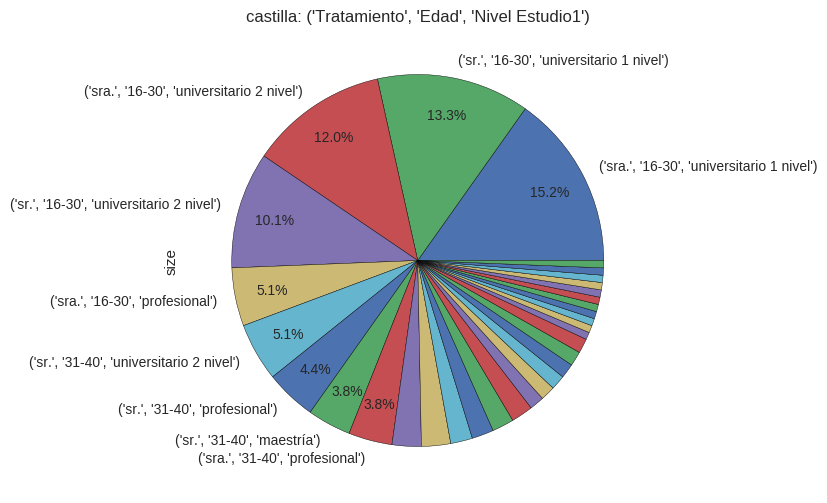

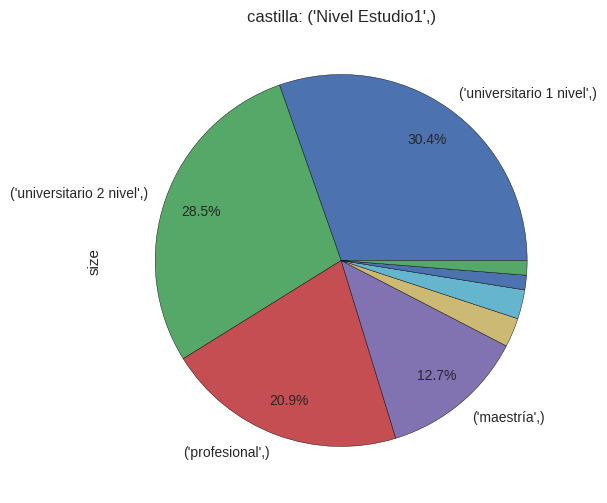

In [56]:
from IPython.display import display


def mypct(pct):
    return '%.1f%%' % pct if pct >= THRESHOLD else ''

def mylabels(count_df):
    return [(x if float(count_df.ix[[x]]['percentage'][0][:-1]) >= THRESHOLD else '') for x in count_df.index]

THRESHOLD = 3
N = 12
c = 1
for k in combinations_counter_dict:
    cn = combinations_counter_dict[k]
    print('GROUP #', c)
    print('GROUP BY:', k)
    print('NUMBER OF GROUPS:', len(cn))
    print('TOP', N, 'LARGEST GROUPS:')
    total = sum(cn.values())
    df = pd.DataFrame(
        [(a, b, total, '{:.2%}'.format(b / total)) for a, b in cn.most_common()],
        columns=(k, 'size', 'total', 'percentage'),
    )
    display(df.head(N))
    c += 1
    
    plt.figure()
    count_df = df.set_index(k)
    count_df['size'].plot(
        kind='pie', autopct=mypct, pctdistance=0.8, labels=mylabels(count_df), figsize=(6,6), title=b + ': ' + str(k))

#### Área de estudios

In [57]:
combs = [
    ('Área de Estudio1',), # Área de estudio en el barrio
    ('Tratamiento', 'Edad', 'Área de Estudio1'), # Área de estudio en el barrio por edad y sexo
]

In [58]:
%%time

combinations_counter_dict = {}

for comb in combs:
    df = barrio_bogota_df[list(comb)]
    groups = [tuple(x) for i, x in df.iterrows()]
    counter = Counter(groups)
    combinations_counter_dict[comb] = counter
    print(comb, len(counter))

('Área de Estudio1',) 44
('Tratamiento', 'Edad', 'Área de Estudio1') 102
CPU times: user 36.1 ms, sys: 0 ns, total: 36.1 ms
Wall time: 34.9 ms


GROUP # 1
GROUP BY: ('Tratamiento', 'Edad', 'Área de Estudio1')
NUMBER OF GROUPS: 102
TOP 12 LARGEST GROUPS:


,"(Tratamiento, Edad, Área de Estudio1)",size,total,percentage
0,"(sra., 16-30, derecho)",7,158,4.43%
1,"(sra., 16-30, psicología)",6,158,3.80%
2,"(sr., 16-30, derecho)",6,158,3.80%
3,"(sra., 16-30, cine fotografía y televisión)",5,158,3.16%
4,"(sr., 16-30, filosofía y letras)",5,158,3.16%
5,"(sr., 16-30, literatura)",4,158,2.53%
6,"(sra., 16-30, artes escénicas)",3,158,1.90%
7,"(sra., 16-30, pedagogía)",3,158,1.90%
8,"(sr., 31-40, derecho)",3,158,1.90%
9,"(sra., 16-30, idiomas)",3,158,1.90%


GROUP # 2
GROUP BY: ('Área de Estudio1',)
NUMBER OF GROUPS: 44
TOP 12 LARGEST GROUPS:


,"(Área de Estudio1,)",size,total,percentage
0,"(derecho,)",21,158,13.29%
1,"(psicología,)",9,158,5.70%
2,"(literatura,)",8,158,5.06%
3,"(pedagogía,)",8,158,5.06%
4,"(filosofía y letras,)",8,158,5.06%
5,"(idiomas,)",6,158,3.80%
6,"(ing. industrial,)",6,158,3.80%
7,"(cine fotografía y televisión,)",6,158,3.80%
8,"(diseño gráfico,)",5,158,3.16%
9,"(ing. ambiental,)",5,158,3.16%


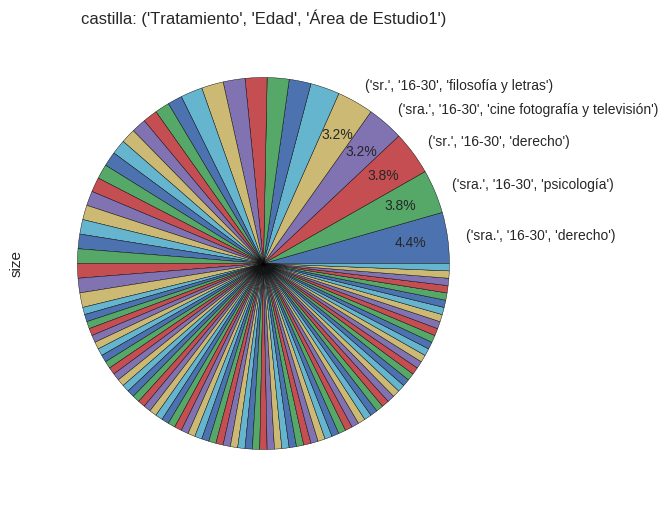

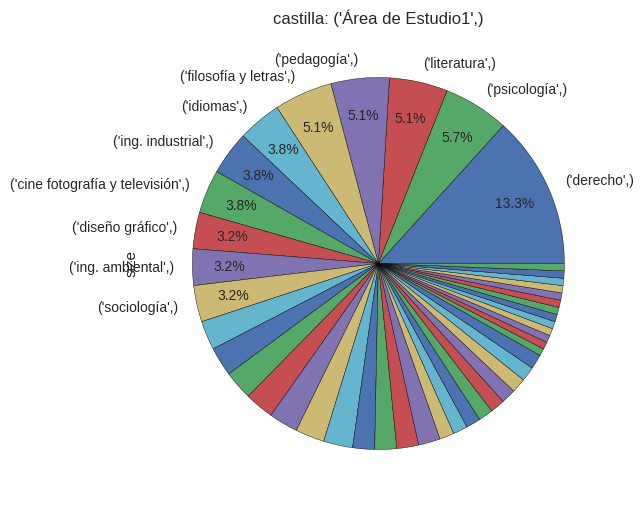

In [59]:
from IPython.display import display


def mypct(pct):
    return '%.1f%%' % pct if pct >= THRESHOLD else ''

def mylabels(count_df):
    return [(x if float(count_df.ix[[x]]['percentage'][0][:-1]) >= THRESHOLD else '') for x in count_df.index]

THRESHOLD = 3
N = 12
c = 1
for k in combinations_counter_dict:
    cn = combinations_counter_dict[k]
    print('GROUP #', c)
    print('GROUP BY:', k)
    print('NUMBER OF GROUPS:', len(cn))
    print('TOP', N, 'LARGEST GROUPS:')
    total = sum(cn.values())
    df = pd.DataFrame(
        [(a, b, total, '{:.2%}'.format(b / total)) for a, b in cn.most_common()],
        columns=(k, 'size', 'total', 'percentage'),
    )
    display(df.head(N))
    c += 1
    
    plt.figure()
    count_df = df.set_index(k)
    count_df['size'].plot(
        kind='pie', autopct=mypct, pctdistance=0.8, labels=mylabels(count_df), figsize=(6,6), title=b + ': ' + str(k))

In [60]:
for b, c in barrios_counter_df.iteritems():
    if c >= 100:
        print(b, c)

chapinero 304
candelaria 194
soledad 162
castilla 158
fontibon 157
cedritos 153
modelia 141
palermo 133
teusaquillo 119
centro 109
ciudad salitre 109
chapinero alto 108
recuerdo 104
macarena 101
aguas 100


### fontibon

In [61]:
b = 'fontibon'

In [62]:
barrio_bogota_df = perfiles_bogota_df[perfiles_bogota_df['Barrio'] == b]

#### Nivel de estudios

In [63]:
combs = [
    ('Nivel Estudio1',), # Nivel de estudio en el barrio
    ('Tratamiento', 'Edad', 'Nivel Estudio1'), # Nivel de estudio en el barrio por edad y sexo
]

In [64]:
%%time

combinations_counter_dict = {}

for comb in combs:
    df = barrio_bogota_df[list(comb)]
    groups = [tuple(x) for i, x in df.iterrows()]
    counter = Counter(groups)
    combinations_counter_dict[comb] = counter
    print(comb, len(counter))

('Nivel Estudio1',) 7
('Tratamiento', 'Edad', 'Nivel Estudio1') 31
CPU times: user 36.1 ms, sys: 0 ns, total: 36.1 ms
Wall time: 35.2 ms


GROUP # 1
GROUP BY: ('Tratamiento', 'Edad', 'Nivel Estudio1')
NUMBER OF GROUPS: 31
TOP 12 LARGEST GROUPS:


,"(Tratamiento, Edad, Nivel Estudio1)",size,total,percentage
0,"(sra., 16-30, universitario 1 nivel)",24,157,15.29%
1,"(sra., 16-30, universitario 2 nivel)",24,157,15.29%
2,"(sr., 16-30, universitario 1 nivel)",18,157,11.46%
3,"(sr., 16-30, universitario 2 nivel)",15,157,9.55%
4,"(sr., 31-40, profesional)",11,157,7.01%
5,"(sr., 31-40, universitario 2 nivel)",9,157,5.73%
6,"(sra., 16-30, profesional)",6,157,3.82%
7,"(sr., 41-50, profesional)",5,157,3.18%
8,"(sr., 16-30, profesional)",5,157,3.18%
9,"(sr., 31-40, maestría)",4,157,2.55%


GROUP # 2
GROUP BY: ('Nivel Estudio1',)
NUMBER OF GROUPS: 7
TOP 12 LARGEST GROUPS:


,"(Nivel Estudio1,)",size,total,percentage
0,"(universitario 2 nivel,)",53,157,33.76%
1,"(universitario 1 nivel,)",45,157,28.66%
2,"(profesional,)",38,157,24.20%
3,"(maestría,)",11,157,7.01%
4,"(postgrado,)",6,157,3.82%
5,"(graduado,)",2,157,1.27%
6,"(doctorado,)",2,157,1.27%


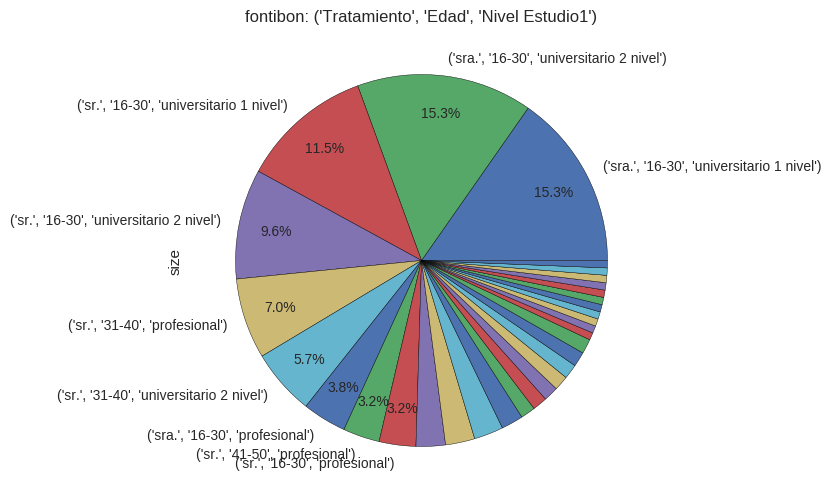

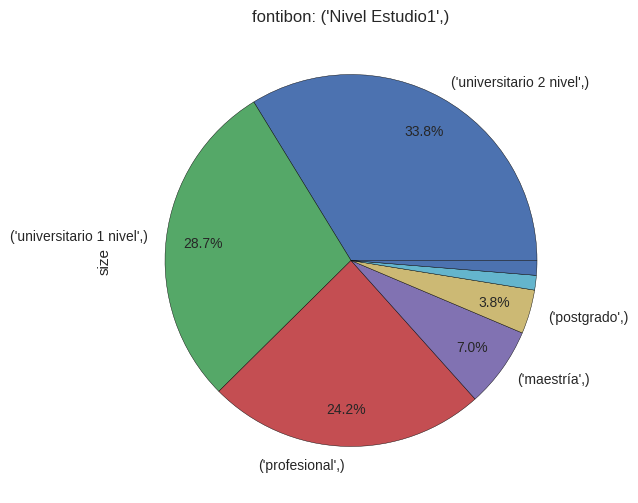

In [65]:
from IPython.display import display


def mypct(pct):
    return '%.1f%%' % pct if pct >= THRESHOLD else ''

def mylabels(count_df):
    return [(x if float(count_df.ix[[x]]['percentage'][0][:-1]) >= THRESHOLD else '') for x in count_df.index]

THRESHOLD = 3
N = 12
c = 1
for k in combinations_counter_dict:
    cn = combinations_counter_dict[k]
    print('GROUP #', c)
    print('GROUP BY:', k)
    print('NUMBER OF GROUPS:', len(cn))
    print('TOP', N, 'LARGEST GROUPS:')
    total = sum(cn.values())
    df = pd.DataFrame(
        [(a, b, total, '{:.2%}'.format(b / total)) for a, b in cn.most_common()],
        columns=(k, 'size', 'total', 'percentage'),
    )
    display(df.head(N))
    c += 1
    
    plt.figure()
    count_df = df.set_index(k)
    count_df['size'].plot(
        kind='pie', autopct=mypct, pctdistance=0.8, labels=mylabels(count_df), figsize=(6,6), title=b + ': ' + str(k))

#### Área de estudios

In [66]:
combs = [
    ('Área de Estudio1',), # Área de estudio en el barrio
    ('Tratamiento', 'Edad', 'Área de Estudio1'), # Área de estudio en el barrio por edad y sexo
]

In [67]:
%%time

combinations_counter_dict = {}

for comb in combs:
    df = barrio_bogota_df[list(comb)]
    groups = [tuple(x) for i, x in df.iterrows()]
    counter = Counter(groups)
    combinations_counter_dict[comb] = counter
    print(comb, len(counter))

('Área de Estudio1',) 50
('Tratamiento', 'Edad', 'Área de Estudio1') 106
CPU times: user 33.2 ms, sys: 387 µs, total: 33.6 ms
Wall time: 33 ms


GROUP # 1
GROUP BY: ('Tratamiento', 'Edad', 'Área de Estudio1')
NUMBER OF GROUPS: 106
TOP 12 LARGEST GROUPS:


,"(Tratamiento, Edad, Área de Estudio1)",size,total,percentage
0,"(sra., 16-30, derecho)",10,157,6.37%
1,"(sr., 16-30, derecho)",7,157,4.46%
2,"(sra., 16-30, idiomas)",5,157,3.18%
3,"(sra., 16-30, química)",4,157,2.55%
4,"(sr., 16-30, ciencias sociales)",3,157,1.91%
5,"(sr., 31-40, ing. industrial)",3,157,1.91%
6,"(sr., 31-40, psicología)",3,157,1.91%
7,"(sra., 16-30, psicología)",3,157,1.91%
8,"(sra., 16-30, pedagogía)",2,157,1.27%
9,"(sra., 16-30, enfermería)",2,157,1.27%


GROUP # 2
GROUP BY: ('Área de Estudio1',)
NUMBER OF GROUPS: 50
TOP 12 LARGEST GROUPS:


,"(Área de Estudio1,)",size,total,percentage
0,"(derecho,)",20,157,12.74%
1,"(literatura,)",8,157,5.10%
2,"(idiomas,)",7,157,4.46%
3,"(psicología,)",7,157,4.46%
4,"(filosofía y letras,)",6,157,3.82%
5,"(ing. industrial,)",6,157,3.82%
6,"(ciencias sociales,)",5,157,3.18%
7,"(ing. de sistemas,)",5,157,3.18%
8,"(finanzas y relaciones intern.,)",4,157,2.55%
9,"(economía,)",4,157,2.55%


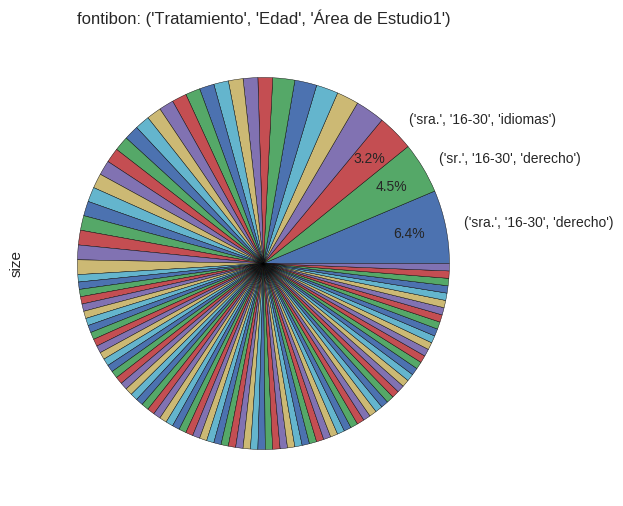

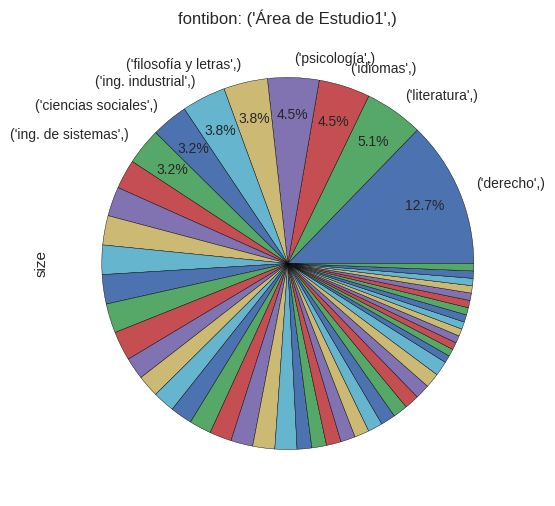

In [68]:
from IPython.display import display


def mypct(pct):
    return '%.1f%%' % pct if pct >= THRESHOLD else ''

def mylabels(count_df):
    return [(x if float(count_df.ix[[x]]['percentage'][0][:-1]) >= THRESHOLD else '') for x in count_df.index]

THRESHOLD = 3
N = 12
c = 1
for k in combinations_counter_dict:
    cn = combinations_counter_dict[k]
    print('GROUP #', c)
    print('GROUP BY:', k)
    print('NUMBER OF GROUPS:', len(cn))
    print('TOP', N, 'LARGEST GROUPS:')
    total = sum(cn.values())
    df = pd.DataFrame(
        [(a, b, total, '{:.2%}'.format(b / total)) for a, b in cn.most_common()],
        columns=(k, 'size', 'total', 'percentage'),
    )
    display(df.head(N))
    c += 1
    
    plt.figure()
    count_df = df.set_index(k)
    count_df['size'].plot(
        kind='pie', autopct=mypct, pctdistance=0.8, labels=mylabels(count_df), figsize=(6,6), title=b + ': ' + str(k))

In [69]:
for b, c in barrios_counter_df.iteritems():
    if c >= 100:
        print(b, c)

chapinero 304
candelaria 194
soledad 162
castilla 158
fontibon 157
cedritos 153
modelia 141
palermo 133
teusaquillo 119
centro 109
ciudad salitre 109
chapinero alto 108
recuerdo 104
macarena 101
aguas 100


### cedritos

In [70]:
b = 'cedritos'

In [71]:
barrio_bogota_df = perfiles_bogota_df[perfiles_bogota_df['Barrio'] == b]

#### Nivel de estudios

In [72]:
combs = [
    ('Nivel Estudio1',), # Nivel de estudio en el barrio
    ('Tratamiento', 'Edad', 'Nivel Estudio1'), # Nivel de estudio en el barrio por edad y sexo
]

In [73]:
%%time

combinations_counter_dict = {}

for comb in combs:
    df = barrio_bogota_df[list(comb)]
    groups = [tuple(x) for i, x in df.iterrows()]
    counter = Counter(groups)
    combinations_counter_dict[comb] = counter
    print(comb, len(counter))

('Nivel Estudio1',) 8
('Tratamiento', 'Edad', 'Nivel Estudio1') 40
CPU times: user 32.7 ms, sys: 158 µs, total: 32.9 ms
Wall time: 31.6 ms


GROUP # 1
GROUP BY: ('Tratamiento', 'Edad', 'Nivel Estudio1')
NUMBER OF GROUPS: 40
TOP 12 LARGEST GROUPS:


,"(Tratamiento, Edad, Nivel Estudio1)",size,total,percentage
0,"(sra., 16-30, universitario 1 nivel)",21,153,13.73%
1,"(sra., 16-30, universitario 2 nivel)",16,153,10.46%
2,"(sr., 31-40, profesional)",14,153,9.15%
3,"(sr., 16-30, universitario 2 nivel)",14,153,9.15%
4,"(sr., 16-30, universitario 1 nivel)",9,153,5.88%
5,"(sr., 41-50, profesional)",8,153,5.23%
6,"(sra., 16-30, profesional)",6,153,3.92%
7,"(sra., 31-40, profesional)",6,153,3.92%
8,"(sr., 51-64, profesional)",5,153,3.27%
9,"(sr., 16-30, profesional)",5,153,3.27%


GROUP # 2
GROUP BY: ('Nivel Estudio1',)
NUMBER OF GROUPS: 8
TOP 12 LARGEST GROUPS:


,"(Nivel Estudio1,)",size,total,percentage
0,"(profesional,)",53,153,34.64%
1,"(universitario 2 nivel,)",39,153,25.49%
2,"(universitario 1 nivel,)",32,153,20.92%
3,"(maestría,)",14,153,9.15%
4,"(postgrado,)",8,153,5.23%
5,"(doctorado,)",4,153,2.61%
6,"(técnico,)",2,153,1.31%
7,"(graduado,)",1,153,0.65%


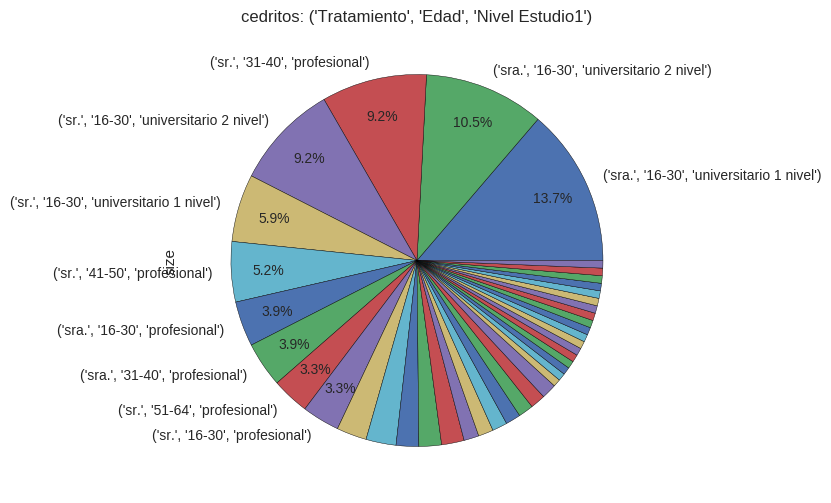

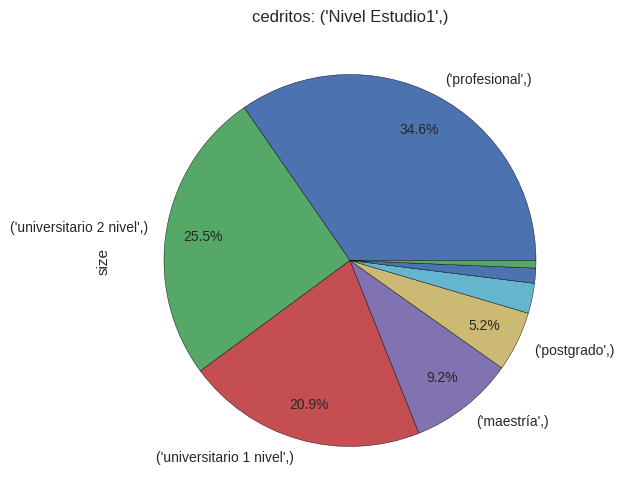

In [74]:
from IPython.display import display


def mypct(pct):
    return '%.1f%%' % pct if pct >= THRESHOLD else ''

def mylabels(count_df):
    return [(x if float(count_df.ix[[x]]['percentage'][0][:-1]) >= THRESHOLD else '') for x in count_df.index]

THRESHOLD = 3
N = 12
c = 1
for k in combinations_counter_dict:
    cn = combinations_counter_dict[k]
    print('GROUP #', c)
    print('GROUP BY:', k)
    print('NUMBER OF GROUPS:', len(cn))
    print('TOP', N, 'LARGEST GROUPS:')
    total = sum(cn.values())
    df = pd.DataFrame(
        [(a, b, total, '{:.2%}'.format(b / total)) for a, b in cn.most_common()],
        columns=(k, 'size', 'total', 'percentage'),
    )
    display(df.head(N))
    c += 1
    
    plt.figure()
    count_df = df.set_index(k)
    count_df['size'].plot(
        kind='pie', autopct=mypct, pctdistance=0.8, labels=mylabels(count_df), figsize=(6,6), title=b + ': ' + str(k))

#### Área de estudios

In [75]:
combs = [
    ('Área de Estudio1',), # Área de estudio en el barrio
    ('Tratamiento', 'Edad', 'Área de Estudio1'), # Área de estudio en el barrio por edad y sexo
]

In [76]:
%%time

combinations_counter_dict = {}

for comb in combs:
    df = barrio_bogota_df[list(comb)]
    groups = [tuple(x) for i, x in df.iterrows()]
    counter = Counter(groups)
    combinations_counter_dict[comb] = counter
    print(comb, len(counter))

('Área de Estudio1',) 46
('Tratamiento', 'Edad', 'Área de Estudio1') 101
CPU times: user 34.7 ms, sys: 19.5 ms, total: 54.2 ms
Wall time: 31.8 ms


GROUP # 1
GROUP BY: ('Tratamiento', 'Edad', 'Área de Estudio1')
NUMBER OF GROUPS: 101
TOP 12 LARGEST GROUPS:


,"(Tratamiento, Edad, Área de Estudio1)",size,total,percentage
0,"(sra., 16-30, derecho)",9,153,5.88%
1,"(sr., 16-30, derecho)",9,153,5.88%
2,"(sr., 31-40, derecho)",5,153,3.27%
3,"(sra., 16-30, historia)",4,153,2.61%
4,"(sra., 16-30, arquitectura)",4,153,2.61%
5,"(sr., 41-50, derecho)",4,153,2.61%
6,"(sra., 16-30, literatura)",3,153,1.96%
7,"(sr., 16-30, artes escénicas)",3,153,1.96%
8,"(sr., 31-40, ing. de sistemas)",3,153,1.96%
9,"(sra., 31-40, literatura)",3,153,1.96%


GROUP # 2
GROUP BY: ('Área de Estudio1',)
NUMBER OF GROUPS: 46
TOP 12 LARGEST GROUPS:


,"(Área de Estudio1,)",size,total,percentage
0,"(derecho,)",33,153,21.57%
1,"(literatura,)",12,153,7.84%
2,"(ciencias políticas,)",7,153,4.58%
3,"(arquitectura,)",7,153,4.58%
4,"(ing. industrial,)",6,153,3.92%
5,"(historia,)",6,153,3.92%
6,"(filosofía y letras,)",5,153,3.27%
7,"(ing. de sistemas,)",5,153,3.27%
8,"(relaciones internacionales,)",5,153,3.27%
9,"(ing. civil,)",5,153,3.27%


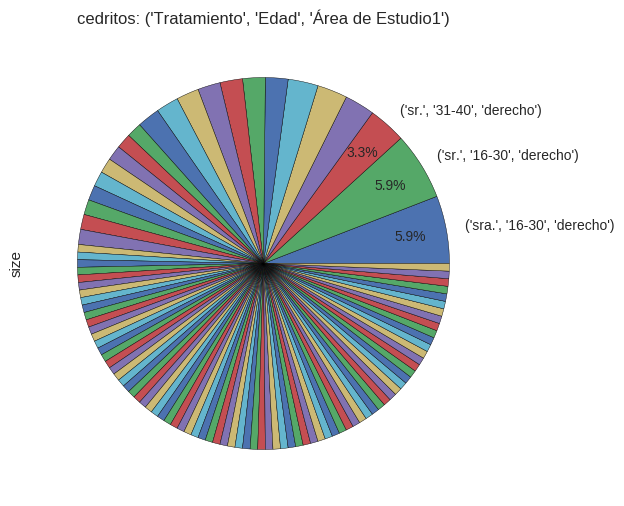

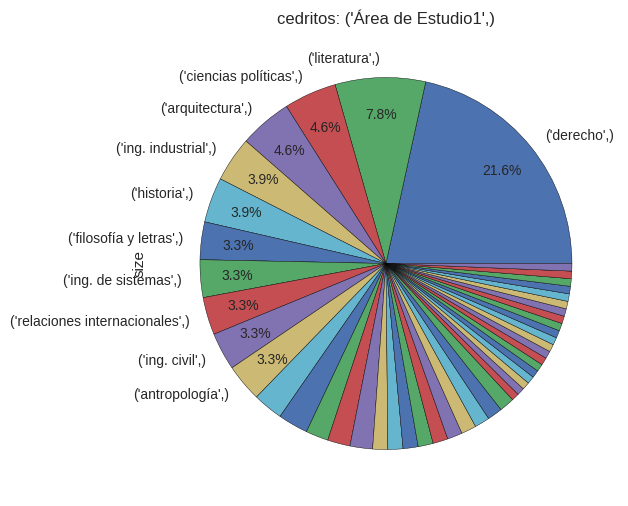

In [77]:
from IPython.display import display


def mypct(pct):
    return '%.1f%%' % pct if pct >= THRESHOLD else ''

def mylabels(count_df):
    return [(x if float(count_df.ix[[x]]['percentage'][0][:-1]) >= THRESHOLD else '') for x in count_df.index]

THRESHOLD = 3
N = 12
c = 1
for k in combinations_counter_dict:
    cn = combinations_counter_dict[k]
    print('GROUP #', c)
    print('GROUP BY:', k)
    print('NUMBER OF GROUPS:', len(cn))
    print('TOP', N, 'LARGEST GROUPS:')
    total = sum(cn.values())
    df = pd.DataFrame(
        [(a, b, total, '{:.2%}'.format(b / total)) for a, b in cn.most_common()],
        columns=(k, 'size', 'total', 'percentage'),
    )
    display(df.head(N))
    c += 1
    
    plt.figure()
    count_df = df.set_index(k)
    count_df['size'].plot(
        kind='pie', autopct=mypct, pctdistance=0.8, labels=mylabels(count_df), figsize=(6,6), title=b + ': ' + str(k))

In [78]:
for b, c in barrios_counter_df.iteritems():
    if c >= 100:
        print(b, c)

chapinero 304
candelaria 194
soledad 162
castilla 158
fontibon 157
cedritos 153
modelia 141
palermo 133
teusaquillo 119
centro 109
ciudad salitre 109
chapinero alto 108
recuerdo 104
macarena 101
aguas 100


### modelia

In [79]:
b = 'modelia'

In [80]:
barrio_bogota_df = perfiles_bogota_df[perfiles_bogota_df['Barrio'] == b]

#### Nivel de estudios

In [81]:
combs = [
    ('Nivel Estudio1',), # Nivel de estudio en el barrio
    ('Tratamiento', 'Edad', 'Nivel Estudio1'), # Nivel de estudio en el barrio por edad y sexo
]

In [82]:
%%time

combinations_counter_dict = {}

for comb in combs:
    df = barrio_bogota_df[list(comb)]
    groups = [tuple(x) for i, x in df.iterrows()]
    counter = Counter(groups)
    combinations_counter_dict[comb] = counter
    print(comb, len(counter))

('Nivel Estudio1',) 9
('Tratamiento', 'Edad', 'Nivel Estudio1') 32
CPU times: user 28.8 ms, sys: 200 µs, total: 29 ms
Wall time: 28.2 ms


GROUP # 1
GROUP BY: ('Tratamiento', 'Edad', 'Nivel Estudio1')
NUMBER OF GROUPS: 32
TOP 12 LARGEST GROUPS:


,"(Tratamiento, Edad, Nivel Estudio1)",size,total,percentage
0,"(sra., 16-30, universitario 1 nivel)",19,141,13.48%
1,"(sra., 16-30, universitario 2 nivel)",18,141,12.77%
2,"(sr., 16-30, universitario 1 nivel)",18,141,12.77%
3,"(sr., 16-30, universitario 2 nivel)",12,141,8.51%
4,"(sra., 31-40, profesional)",10,141,7.09%
5,"(sra., 16-30, profesional)",9,141,6.38%
6,"(sr., 31-40, profesional)",7,141,4.96%
7,"(sr., 31-40, universitario 2 nivel)",5,141,3.55%
8,"(sr., 65+, profesional)",5,141,3.55%
9,"(sra., 41-50, profesional)",4,141,2.84%


GROUP # 2
GROUP BY: ('Nivel Estudio1',)
NUMBER OF GROUPS: 9
TOP 12 LARGEST GROUPS:


,"(Nivel Estudio1,)",size,total,percentage
0,"(profesional,)",47,141,33.33%
1,"(universitario 1 nivel,)",40,141,28.37%
2,"(universitario 2 nivel,)",38,141,26.95%
3,"(maestría,)",6,141,4.26%
4,"(postgrado,)",5,141,3.55%
5,"(doctorado,)",2,141,1.42%
6,"(graduado,)",1,141,0.71%
7,"(tecnológico,)",1,141,0.71%
8,"(técnico,)",1,141,0.71%


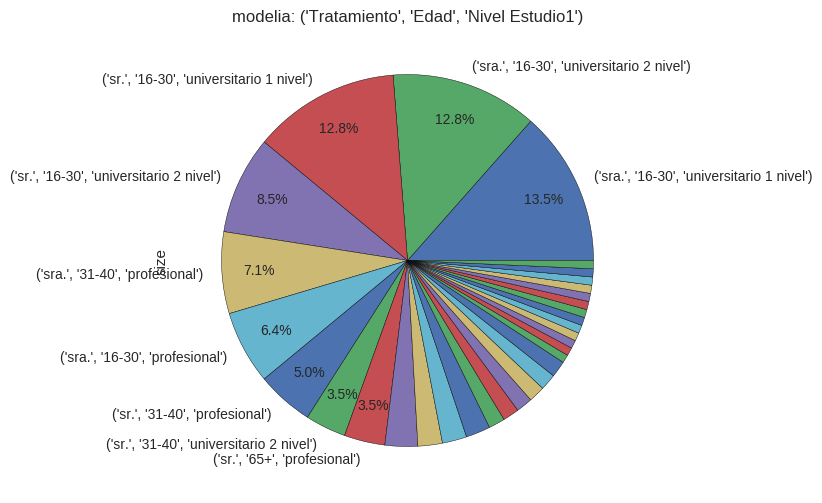

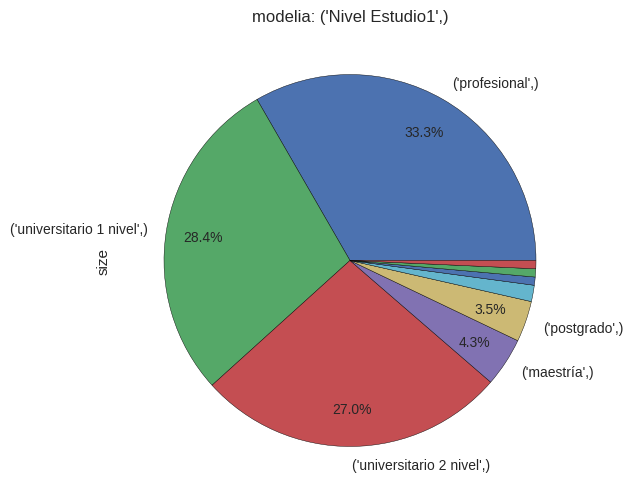

In [83]:
from IPython.display import display


def mypct(pct):
    return '%.1f%%' % pct if pct >= THRESHOLD else ''

def mylabels(count_df):
    return [(x if float(count_df.ix[[x]]['percentage'][0][:-1]) >= THRESHOLD else '') for x in count_df.index]

THRESHOLD = 3
N = 12
c = 1
for k in combinations_counter_dict:
    cn = combinations_counter_dict[k]
    print('GROUP #', c)
    print('GROUP BY:', k)
    print('NUMBER OF GROUPS:', len(cn))
    print('TOP', N, 'LARGEST GROUPS:')
    total = sum(cn.values())
    df = pd.DataFrame(
        [(a, b, total, '{:.2%}'.format(b / total)) for a, b in cn.most_common()],
        columns=(k, 'size', 'total', 'percentage'),
    )
    display(df.head(N))
    c += 1
    
    plt.figure()
    count_df = df.set_index(k)
    count_df['size'].plot(
        kind='pie', autopct=mypct, pctdistance=0.8, labels=mylabels(count_df), figsize=(6,6), title=b + ': ' + str(k))

#### Área de estudios

In [84]:
combs = [
    ('Área de Estudio1',), # Área de estudio en el barrio
    ('Tratamiento', 'Edad', 'Área de Estudio1'), # Área de estudio en el barrio por edad y sexo
]

In [85]:
%%time

combinations_counter_dict = {}

for comb in combs:
    df = barrio_bogota_df[list(comb)]
    groups = [tuple(x) for i, x in df.iterrows()]
    counter = Counter(groups)
    combinations_counter_dict[comb] = counter
    print(comb, len(counter))

('Área de Estudio1',) 46
('Tratamiento', 'Edad', 'Área de Estudio1') 86
CPU times: user 28.9 ms, sys: 22.6 ms, total: 51.5 ms
Wall time: 29.4 ms


GROUP # 1
GROUP BY: ('Tratamiento', 'Edad', 'Área de Estudio1')
NUMBER OF GROUPS: 86
TOP 12 LARGEST GROUPS:


,"(Tratamiento, Edad, Área de Estudio1)",size,total,percentage
0,"(sr., 16-30, derecho)",12,141,8.51%
1,"(sra., 16-30, derecho)",10,141,7.09%
2,"(sra., 16-30, medicina)",5,141,3.55%
3,"(sra., 16-30, psicología)",4,141,2.84%
4,"(sra., 16-30, ciencias políticas)",4,141,2.84%
5,"(sra., 31-40, derecho)",4,141,2.84%
6,"(sra., 16-30, literatura)",3,141,2.13%
7,"(sra., 16-30, finanzas y relaciones intern.)",3,141,2.13%
8,"(sr., 16-30, ciencias políticas)",3,141,2.13%
9,"(sra., 16-30, ing. química)",2,141,1.42%


GROUP # 2
GROUP BY: ('Área de Estudio1',)
NUMBER OF GROUPS: 46
TOP 12 LARGEST GROUPS:


,"(Área de Estudio1,)",size,total,percentage
0,"(derecho,)",35,141,24.82%
1,"(psicología,)",9,141,6.38%
2,"(ciencias políticas,)",8,141,5.67%
3,"(antropología,)",7,141,4.96%
4,"(medicina,)",6,141,4.26%
5,"(filosofía y letras,)",4,141,2.84%
6,"(ing. mecánica,)",4,141,2.84%
7,"(adm. pública,)",4,141,2.84%
8,"(cine fotografía y televisión,)",4,141,2.84%
9,"(adm. de empresas,)",3,141,2.13%


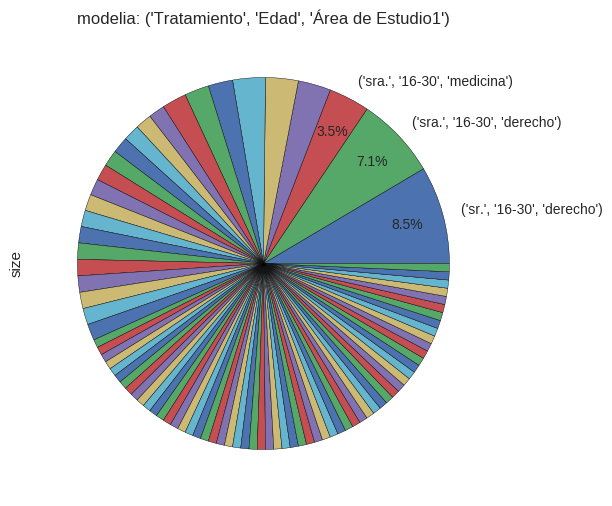

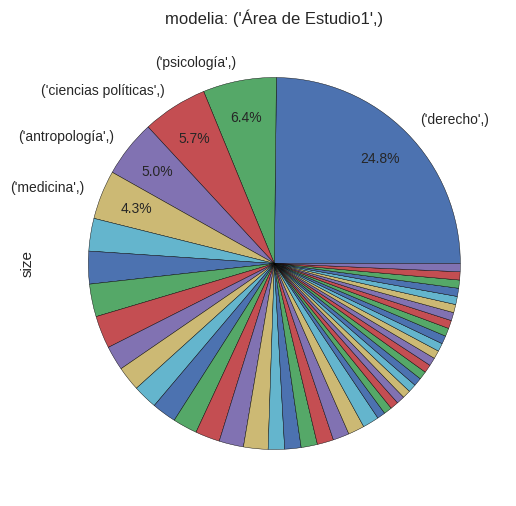

In [86]:
from IPython.display import display


def mypct(pct):
    return '%.1f%%' % pct if pct >= THRESHOLD else ''

def mylabels(count_df):
    return [(x if float(count_df.ix[[x]]['percentage'][0][:-1]) >= THRESHOLD else '') for x in count_df.index]

THRESHOLD = 3
N = 12
c = 1
for k in combinations_counter_dict:
    cn = combinations_counter_dict[k]
    print('GROUP #', c)
    print('GROUP BY:', k)
    print('NUMBER OF GROUPS:', len(cn))
    print('TOP', N, 'LARGEST GROUPS:')
    total = sum(cn.values())
    df = pd.DataFrame(
        [(a, b, total, '{:.2%}'.format(b / total)) for a, b in cn.most_common()],
        columns=(k, 'size', 'total', 'percentage'),
    )
    display(df.head(N))
    c += 1
    
    plt.figure()
    count_df = df.set_index(k)
    count_df['size'].plot(
        kind='pie', autopct=mypct, pctdistance=0.8, labels=mylabels(count_df), figsize=(6,6), title=b + ': ' + str(k))

In [87]:
for b, c in barrios_counter_df.iteritems():
    if c >= 100:
        print(b, c)

chapinero 304
candelaria 194
soledad 162
castilla 158
fontibon 157
cedritos 153
modelia 141
palermo 133
teusaquillo 119
centro 109
ciudad salitre 109
chapinero alto 108
recuerdo 104
macarena 101
aguas 100


### palermo

In [88]:
b = 'palermo'

In [89]:
barrio_bogota_df = perfiles_bogota_df[perfiles_bogota_df['Barrio'] == b]

#### Nivel de estudios

In [90]:
combs = [
    ('Nivel Estudio1',), # Nivel de estudio en el barrio
    ('Tratamiento', 'Edad', 'Nivel Estudio1'), # Nivel de estudio en el barrio por edad y sexo
]

In [91]:
%%time

combinations_counter_dict = {}

for comb in combs:
    df = barrio_bogota_df[list(comb)]
    groups = [tuple(x) for i, x in df.iterrows()]
    counter = Counter(groups)
    combinations_counter_dict[comb] = counter
    print(comb, len(counter))

('Nivel Estudio1',) 7
('Tratamiento', 'Edad', 'Nivel Estudio1') 35
CPU times: user 28.4 ms, sys: 22 µs, total: 28.4 ms
Wall time: 27.5 ms


GROUP # 1
GROUP BY: ('Tratamiento', 'Edad', 'Nivel Estudio1')
NUMBER OF GROUPS: 35
TOP 12 LARGEST GROUPS:


,"(Tratamiento, Edad, Nivel Estudio1)",size,total,percentage
0,"(sr., 16-30, universitario 1 nivel)",17,133,12.78%
1,"(sra., 16-30, universitario 2 nivel)",13,133,9.77%
2,"(sr., 31-40, profesional)",9,133,6.77%
3,"(sra., 31-40, maestría)",8,133,6.02%
4,"(sr., 31-40, maestría)",7,133,5.26%
5,"(sr., 16-30, universitario 2 nivel)",7,133,5.26%
6,"(sra., 31-40, profesional)",7,133,5.26%
7,"(sra., 16-30, universitario 1 nivel)",6,133,4.51%
8,"(sr., 41-50, profesional)",6,133,4.51%
9,"(sra., 16-30, profesional)",6,133,4.51%


GROUP # 2
GROUP BY: ('Nivel Estudio1',)
NUMBER OF GROUPS: 7
TOP 12 LARGEST GROUPS:


,"(Nivel Estudio1,)",size,total,percentage
0,"(profesional,)",45,133,33.83%
1,"(universitario 1 nivel,)",30,133,22.56%
2,"(maestría,)",26,133,19.55%
3,"(universitario 2 nivel,)",23,133,17.29%
4,"(postgrado,)",7,133,5.26%
5,"(graduado,)",1,133,0.75%
6,"(doctorado,)",1,133,0.75%


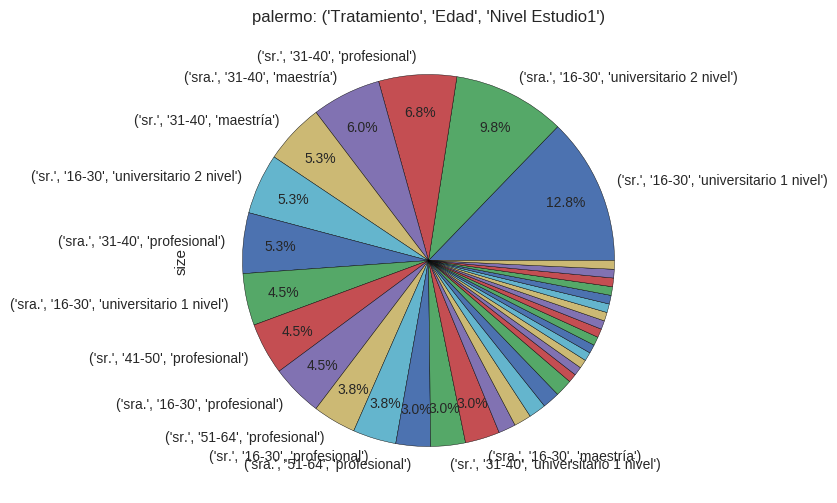

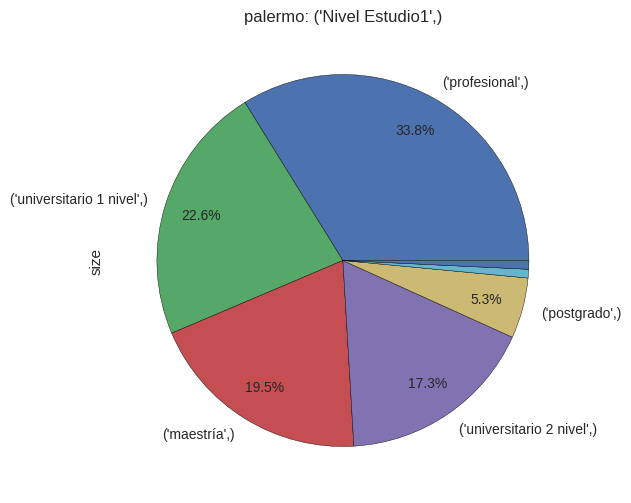

In [92]:
from IPython.display import display


def mypct(pct):
    return '%.1f%%' % pct if pct >= THRESHOLD else ''

def mylabels(count_df):
    return [(x if float(count_df.ix[[x]]['percentage'][0][:-1]) >= THRESHOLD else '') for x in count_df.index]

THRESHOLD = 3
N = 12
c = 1
for k in combinations_counter_dict:
    cn = combinations_counter_dict[k]
    print('GROUP #', c)
    print('GROUP BY:', k)
    print('NUMBER OF GROUPS:', len(cn))
    print('TOP', N, 'LARGEST GROUPS:')
    total = sum(cn.values())
    df = pd.DataFrame(
        [(a, b, total, '{:.2%}'.format(b / total)) for a, b in cn.most_common()],
        columns=(k, 'size', 'total', 'percentage'),
    )
    display(df.head(N))
    c += 1
    
    plt.figure()
    count_df = df.set_index(k)
    count_df['size'].plot(
        kind='pie', autopct=mypct, pctdistance=0.8, labels=mylabels(count_df), figsize=(6,6), title=b + ': ' + str(k))

#### Área de estudios

In [93]:
combs = [
    ('Área de Estudio1',), # Área de estudio en el barrio
    ('Tratamiento', 'Edad', 'Área de Estudio1'), # Área de estudio en el barrio por edad y sexo
]

In [94]:
%%time

combinations_counter_dict = {}

for comb in combs:
    df = barrio_bogota_df[list(comb)]
    groups = [tuple(x) for i, x in df.iterrows()]
    counter = Counter(groups)
    combinations_counter_dict[comb] = counter
    print(comb, len(counter))

('Área de Estudio1',) 42
('Tratamiento', 'Edad', 'Área de Estudio1') 93
CPU times: user 28.6 ms, sys: 130 µs, total: 28.7 ms
Wall time: 27.8 ms


GROUP # 1
GROUP BY: ('Tratamiento', 'Edad', 'Área de Estudio1')
NUMBER OF GROUPS: 93
TOP 12 LARGEST GROUPS:


,"(Tratamiento, Edad, Área de Estudio1)",size,total,percentage
0,"(sra., 16-30, derecho)",6,133,4.51%
1,"(sr., 31-40, derecho)",6,133,4.51%
2,"(sra., 31-40, derecho)",4,133,3.01%
3,"(sr., 16-30, ciencias sociales)",3,133,2.26%
4,"(sra., 16-30, comunicación social)",3,133,2.26%
5,"(sr., 16-30, idiomas)",3,133,2.26%
6,"(sra., 31-40, psicología)",3,133,2.26%
7,"(sra., 31-40, pedagogía)",2,133,1.50%
8,"(sr., 31-40, ciencias sociales)",2,133,1.50%
9,"(sra., 16-30, artes plásticas)",2,133,1.50%


GROUP # 2
GROUP BY: ('Área de Estudio1',)
NUMBER OF GROUPS: 42
TOP 12 LARGEST GROUPS:


,"(Área de Estudio1,)",size,total,percentage
0,"(derecho,)",23,133,17.29%
1,"(literatura,)",8,133,6.02%
2,"(filosofía y letras,)",7,133,5.26%
3,"(ciencias sociales,)",7,133,5.26%
4,"(psicología,)",7,133,5.26%
5,"(pedagogía,)",6,133,4.51%
6,"(medicina,)",6,133,4.51%
7,"(ing. electrónica,)",4,133,3.01%
8,"(idiomas,)",4,133,3.01%
9,"(comunicación social,)",4,133,3.01%


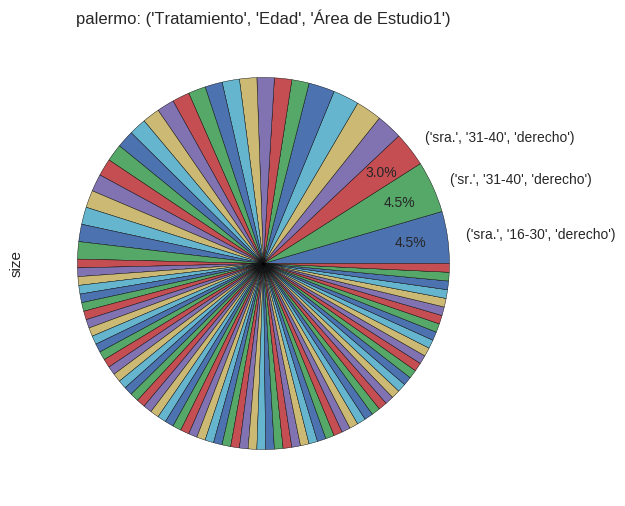

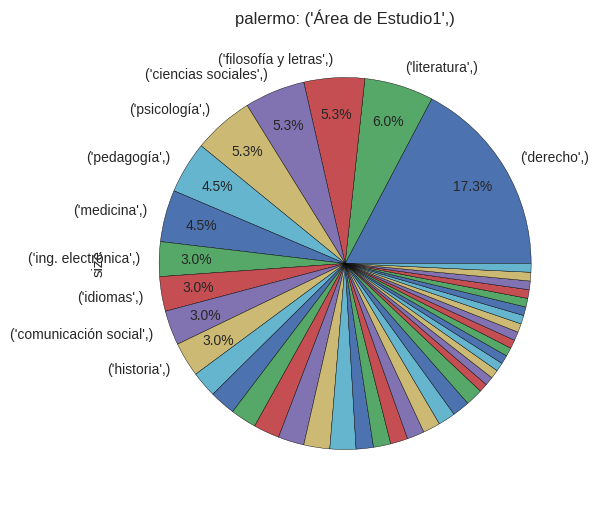

In [95]:
from IPython.display import display


def mypct(pct):
    return '%.1f%%' % pct if pct >= THRESHOLD else ''

def mylabels(count_df):
    return [(x if float(count_df.ix[[x]]['percentage'][0][:-1]) >= THRESHOLD else '') for x in count_df.index]

THRESHOLD = 3
N = 12
c = 1
for k in combinations_counter_dict:
    cn = combinations_counter_dict[k]
    print('GROUP #', c)
    print('GROUP BY:', k)
    print('NUMBER OF GROUPS:', len(cn))
    print('TOP', N, 'LARGEST GROUPS:')
    total = sum(cn.values())
    df = pd.DataFrame(
        [(a, b, total, '{:.2%}'.format(b / total)) for a, b in cn.most_common()],
        columns=(k, 'size', 'total', 'percentage'),
    )
    display(df.head(N))
    c += 1
    
    plt.figure()
    count_df = df.set_index(k)
    count_df['size'].plot(
        kind='pie', autopct=mypct, pctdistance=0.8, labels=mylabels(count_df), figsize=(6,6), title=b + ': ' + str(k))

In [96]:
for b, c in barrios_counter_df.iteritems():
    if c >= 100:
        print(b, c)

chapinero 304
candelaria 194
soledad 162
castilla 158
fontibon 157
cedritos 153
modelia 141
palermo 133
teusaquillo 119
centro 109
ciudad salitre 109
chapinero alto 108
recuerdo 104
macarena 101
aguas 100


### teusaquillo

In [97]:
b = 'teusaquillo'

In [98]:
barrio_bogota_df = perfiles_bogota_df[perfiles_bogota_df['Barrio'] == b]

#### Nivel de estudios

In [99]:
combs = [
    ('Nivel Estudio1',), # Nivel de estudio en el barrio
    ('Tratamiento', 'Edad', 'Nivel Estudio1'), # Nivel de estudio en el barrio por edad y sexo
]

In [100]:
%%time

combinations_counter_dict = {}

for comb in combs:
    df = barrio_bogota_df[list(comb)]
    groups = [tuple(x) for i, x in df.iterrows()]
    counter = Counter(groups)
    combinations_counter_dict[comb] = counter
    print(comb, len(counter))

('Nivel Estudio1',) 9
('Tratamiento', 'Edad', 'Nivel Estudio1') 37
CPU times: user 25.4 ms, sys: 533 µs, total: 25.9 ms
Wall time: 25.2 ms


GROUP # 1
GROUP BY: ('Tratamiento', 'Edad', 'Nivel Estudio1')
NUMBER OF GROUPS: 37
TOP 12 LARGEST GROUPS:


,"(Tratamiento, Edad, Nivel Estudio1)",size,total,percentage
0,"(sra., 16-30, universitario 2 nivel)",13,119,10.92%
1,"(sr., 31-40, profesional)",12,119,10.08%
2,"(sra., 16-30, universitario 1 nivel)",10,119,8.40%
3,"(sr., 16-30, universitario 2 nivel)",10,119,8.40%
4,"(sr., 31-40, maestría)",8,119,6.72%
5,"(sr., 51-64, profesional)",7,119,5.88%
6,"(sr., 16-30, profesional)",5,119,4.20%
7,"(sr., 16-30, universitario 1 nivel)",5,119,4.20%
8,"(sra., 31-40, profesional)",5,119,4.20%
9,"(sr., 31-40, postgrado)",4,119,3.36%


GROUP # 2
GROUP BY: ('Nivel Estudio1',)
NUMBER OF GROUPS: 9
TOP 12 LARGEST GROUPS:


,"(Nivel Estudio1,)",size,total,percentage
0,"(profesional,)",39,119,32.77%
1,"(universitario 2 nivel,)",27,119,22.69%
2,"(maestría,)",19,119,15.97%
3,"(universitario 1 nivel,)",18,119,15.13%
4,"(postgrado,)",8,119,6.72%
5,"(graduado,)",3,119,2.52%
6,"(doctorado,)",3,119,2.52%
7,"(tecnológico,)",1,119,0.84%
8,"(técnico,)",1,119,0.84%


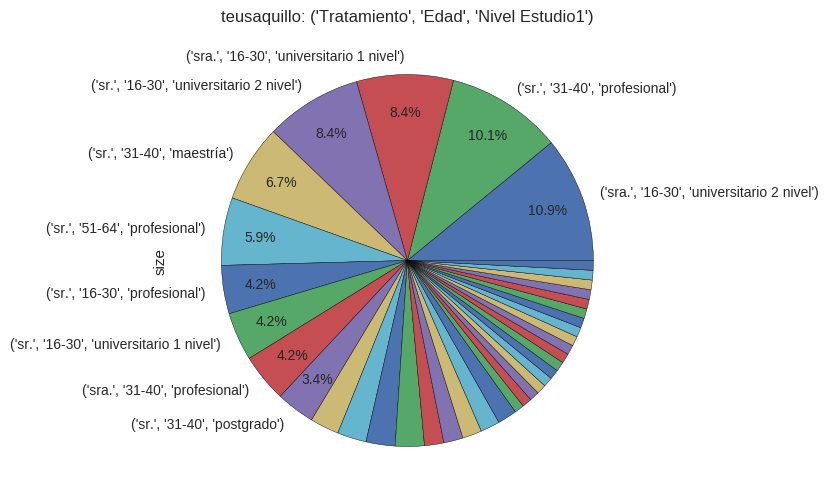

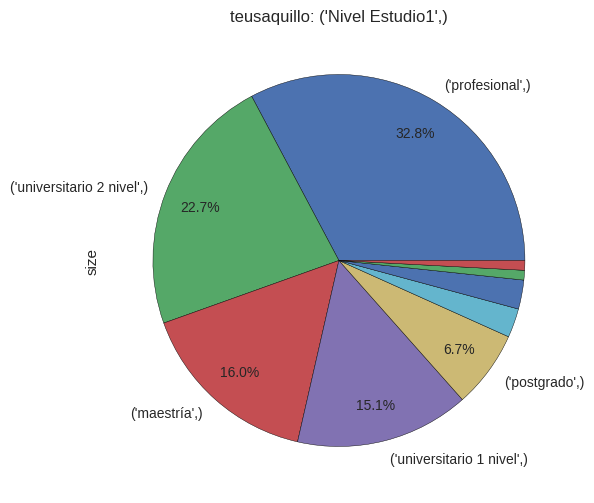

In [101]:
from IPython.display import display


def mypct(pct):
    return '%.1f%%' % pct if pct >= THRESHOLD else ''

def mylabels(count_df):
    return [(x if float(count_df.ix[[x]]['percentage'][0][:-1]) >= THRESHOLD else '') for x in count_df.index]

THRESHOLD = 3
N = 12
c = 1
for k in combinations_counter_dict:
    cn = combinations_counter_dict[k]
    print('GROUP #', c)
    print('GROUP BY:', k)
    print('NUMBER OF GROUPS:', len(cn))
    print('TOP', N, 'LARGEST GROUPS:')
    total = sum(cn.values())
    df = pd.DataFrame(
        [(a, b, total, '{:.2%}'.format(b / total)) for a, b in cn.most_common()],
        columns=(k, 'size', 'total', 'percentage'),
    )
    display(df.head(N))
    c += 1
    
    plt.figure()
    count_df = df.set_index(k)
    count_df['size'].plot(
        kind='pie', autopct=mypct, pctdistance=0.8, labels=mylabels(count_df), figsize=(6,6), title=b + ': ' + str(k))

#### Área de estudios

In [102]:
combs = [
    ('Área de Estudio1',), # Área de estudio en el barrio
    ('Tratamiento', 'Edad', 'Área de Estudio1'), # Área de estudio en el barrio por edad y sexo
]

In [103]:
%%time

combinations_counter_dict = {}

for comb in combs:
    df = barrio_bogota_df[list(comb)]
    groups = [tuple(x) for i, x in df.iterrows()]
    counter = Counter(groups)
    combinations_counter_dict[comb] = counter
    print(comb, len(counter))

('Área de Estudio1',) 38
('Tratamiento', 'Edad', 'Área de Estudio1') 84
CPU times: user 24.7 ms, sys: 182 µs, total: 24.9 ms
Wall time: 24.1 ms


GROUP # 1
GROUP BY: ('Tratamiento', 'Edad', 'Área de Estudio1')
NUMBER OF GROUPS: 84
TOP 12 LARGEST GROUPS:


,"(Tratamiento, Edad, Área de Estudio1)",size,total,percentage
0,"(sr., 31-40, derecho)",5,119,4.20%
1,"(sra., 16-30, derecho)",5,119,4.20%
2,"(sr., 16-30, derecho)",3,119,2.52%
3,"(sra., 16-30, literatura)",3,119,2.52%
4,"(sr., 31-40, arquitectura)",3,119,2.52%
5,"(sr., 16-30, ciencias políticas)",3,119,2.52%
6,"(sr., 31-40, filosofía y letras)",3,119,2.52%
7,"(sr., 31-40, sociología)",3,119,2.52%
8,"(sr., 16-30, literatura)",3,119,2.52%
9,"(sra., 16-30, psicología)",2,119,1.68%


GROUP # 2
GROUP BY: ('Área de Estudio1',)
NUMBER OF GROUPS: 38
TOP 12 LARGEST GROUPS:


,"(Área de Estudio1,)",size,total,percentage
0,"(derecho,)",19,119,15.97%
1,"(historia,)",7,119,5.88%
2,"(literatura,)",7,119,5.88%
3,"(pedagogía,)",6,119,5.04%
4,"(arquitectura,)",5,119,4.20%
5,"(periodismo,)",5,119,4.20%
6,"(filosofía y letras,)",5,119,4.20%
7,"(adm. de empresas,)",4,119,3.36%
8,"(ciencias políticas,)",4,119,3.36%
9,"(ing. industrial,)",4,119,3.36%


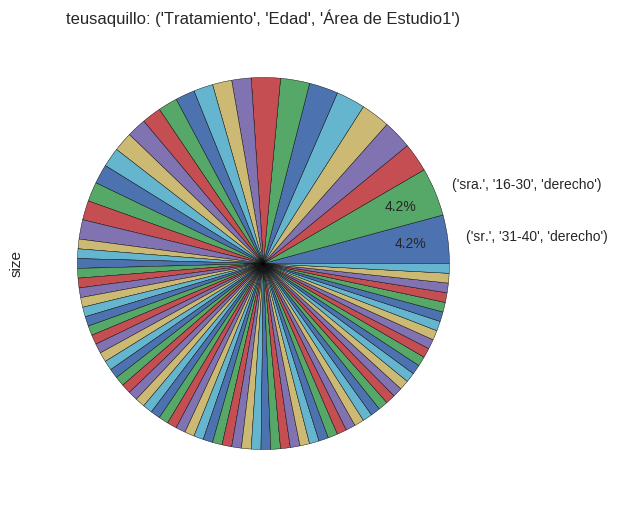

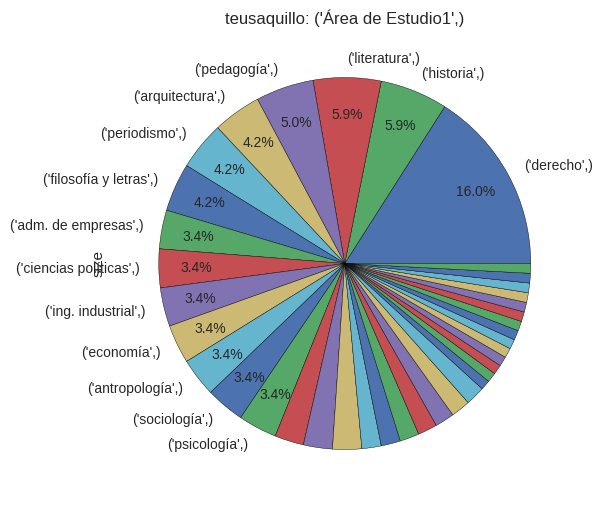

In [104]:
from IPython.display import display


def mypct(pct):
    return '%.1f%%' % pct if pct >= THRESHOLD else ''

def mylabels(count_df):
    return [(x if float(count_df.ix[[x]]['percentage'][0][:-1]) >= THRESHOLD else '') for x in count_df.index]

THRESHOLD = 3
N = 12
c = 1
for k in combinations_counter_dict:
    cn = combinations_counter_dict[k]
    print('GROUP #', c)
    print('GROUP BY:', k)
    print('NUMBER OF GROUPS:', len(cn))
    print('TOP', N, 'LARGEST GROUPS:')
    total = sum(cn.values())
    df = pd.DataFrame(
        [(a, b, total, '{:.2%}'.format(b / total)) for a, b in cn.most_common()],
        columns=(k, 'size', 'total', 'percentage'),
    )
    display(df.head(N))
    c += 1
    
    plt.figure()
    count_df = df.set_index(k)
    count_df['size'].plot(
        kind='pie', autopct=mypct, pctdistance=0.8, labels=mylabels(count_df), figsize=(6,6), title=b + ': ' + str(k))

In [105]:
for b, c in barrios_counter_df.iteritems():
    if c >= 100:
        print(b, c)

chapinero 304
candelaria 194
soledad 162
castilla 158
fontibon 157
cedritos 153
modelia 141
palermo 133
teusaquillo 119
centro 109
ciudad salitre 109
chapinero alto 108
recuerdo 104
macarena 101
aguas 100


### centro

In [106]:
b = 'centro'

In [107]:
barrio_bogota_df = perfiles_bogota_df[perfiles_bogota_df['Barrio'] == b]

#### Nivel de estudios

In [108]:
combs = [
    ('Nivel Estudio1',), # Nivel de estudio en el barrio
    ('Tratamiento', 'Edad', 'Nivel Estudio1'), # Nivel de estudio en el barrio por edad y sexo
]

In [109]:
%%time

combinations_counter_dict = {}

for comb in combs:
    df = barrio_bogota_df[list(comb)]
    groups = [tuple(x) for i, x in df.iterrows()]
    counter = Counter(groups)
    combinations_counter_dict[comb] = counter
    print(comb, len(counter))

('Nivel Estudio1',) 8
('Tratamiento', 'Edad', 'Nivel Estudio1') 34
CPU times: user 25.3 ms, sys: 511 µs, total: 25.8 ms
Wall time: 25 ms


GROUP # 1
GROUP BY: ('Tratamiento', 'Edad', 'Nivel Estudio1')
NUMBER OF GROUPS: 34
TOP 12 LARGEST GROUPS:


,"(Tratamiento, Edad, Nivel Estudio1)",size,total,percentage
0,"(sr., 16-30, universitario 2 nivel)",10,109,9.17%
1,"(sr., 16-30, universitario 1 nivel)",10,109,9.17%
2,"(sra., 16-30, universitario 2 nivel)",9,109,8.26%
3,"(sra., 16-30, universitario 1 nivel)",6,109,5.50%
4,"(sra., 31-40, profesional)",6,109,5.50%
5,"(sr., 51-64, profesional)",5,109,4.59%
6,"(sr., 41-50, profesional)",5,109,4.59%
7,"(sr., 65+, profesional)",5,109,4.59%
8,"(sra., 41-50, profesional)",5,109,4.59%
9,"(sr., 31-40, profesional)",4,109,3.67%


GROUP # 2
GROUP BY: ('Nivel Estudio1',)
NUMBER OF GROUPS: 8
TOP 12 LARGEST GROUPS:


,"(Nivel Estudio1,)",size,total,percentage
0,"(profesional,)",36,109,33.03%
1,"(universitario 2 nivel,)",27,109,24.77%
2,"(universitario 1 nivel,)",24,109,22.02%
3,"(maestría,)",12,109,11.01%
4,"(postgrado,)",5,109,4.59%
5,"(técnico,)",2,109,1.83%
6,"(doctorado,)",2,109,1.83%
7,"(tecnológico,)",1,109,0.92%


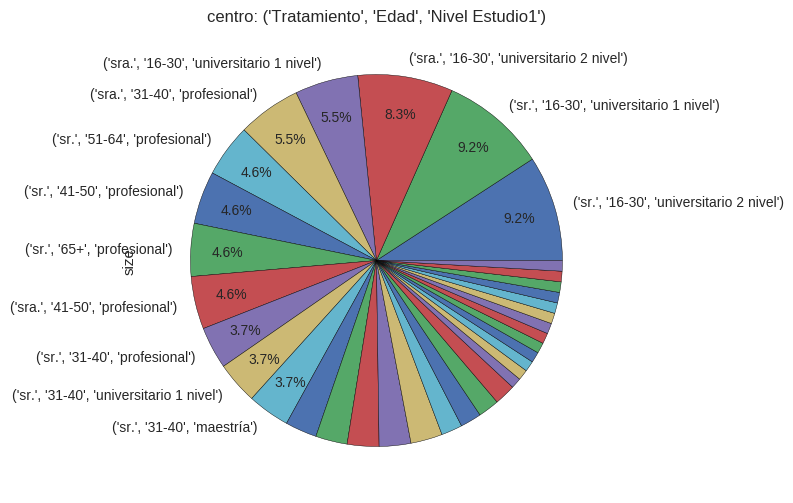

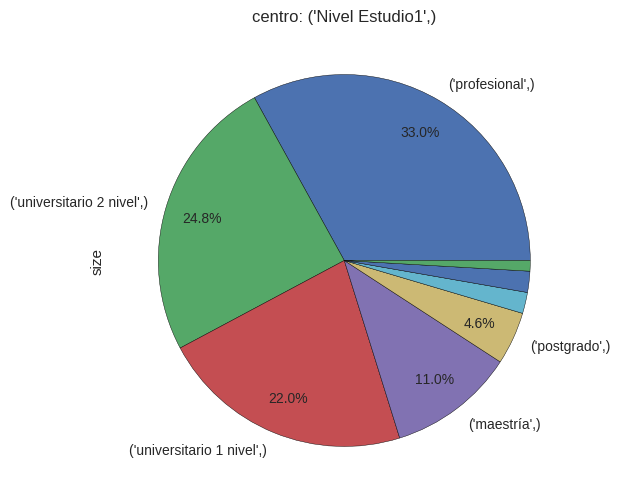

In [110]:
from IPython.display import display


def mypct(pct):
    return '%.1f%%' % pct if pct >= THRESHOLD else ''

def mylabels(count_df):
    return [(x if float(count_df.ix[[x]]['percentage'][0][:-1]) >= THRESHOLD else '') for x in count_df.index]

THRESHOLD = 3
N = 12
c = 1
for k in combinations_counter_dict:
    cn = combinations_counter_dict[k]
    print('GROUP #', c)
    print('GROUP BY:', k)
    print('NUMBER OF GROUPS:', len(cn))
    print('TOP', N, 'LARGEST GROUPS:')
    total = sum(cn.values())
    df = pd.DataFrame(
        [(a, b, total, '{:.2%}'.format(b / total)) for a, b in cn.most_common()],
        columns=(k, 'size', 'total', 'percentage'),
    )
    display(df.head(N))
    c += 1
    
    plt.figure()
    count_df = df.set_index(k)
    count_df['size'].plot(
        kind='pie', autopct=mypct, pctdistance=0.8, labels=mylabels(count_df), figsize=(6,6), title=b + ': ' + str(k))

#### Área de estudios

In [111]:
combs = [
    ('Área de Estudio1',), # Área de estudio en el barrio
    ('Tratamiento', 'Edad', 'Área de Estudio1'), # Área de estudio en el barrio por edad y sexo
]

In [112]:
%%time

combinations_counter_dict = {}

for comb in combs:
    df = barrio_bogota_df[list(comb)]
    groups = [tuple(x) for i, x in df.iterrows()]
    counter = Counter(groups)
    combinations_counter_dict[comb] = counter
    print(comb, len(counter))

('Área de Estudio1',) 37
('Tratamiento', 'Edad', 'Área de Estudio1') 73
CPU times: user 24.4 ms, sys: 12 µs, total: 24.4 ms
Wall time: 23.8 ms


GROUP # 1
GROUP BY: ('Tratamiento', 'Edad', 'Área de Estudio1')
NUMBER OF GROUPS: 73
TOP 12 LARGEST GROUPS:


,"(Tratamiento, Edad, Área de Estudio1)",size,total,percentage
0,"(sr., 31-40, derecho)",6,109,5.50%
1,"(sr., 41-50, derecho)",5,109,4.59%
2,"(sr., 65+, derecho)",5,109,4.59%
3,"(sra., 31-40, derecho)",5,109,4.59%
4,"(sra., 16-30, derecho)",4,109,3.67%
5,"(sr., 16-30, economía)",3,109,2.75%
6,"(sr., 51-64, derecho)",3,109,2.75%
7,"(sr., 16-30, derecho)",3,109,2.75%
8,"(sra., 16-30, adm. de empresas comerciales)",3,109,2.75%
9,"(sr., 16-30, ing. mecánica)",2,109,1.83%


GROUP # 2
GROUP BY: ('Área de Estudio1',)
NUMBER OF GROUPS: 37
TOP 12 LARGEST GROUPS:


,"(Área de Estudio1,)",size,total,percentage
0,"(derecho,)",34,109,31.19%
1,"(adm. de empresas comerciales,)",5,109,4.59%
2,"(contaduría,)",4,109,3.67%
3,"(historia,)",4,109,3.67%
4,"(pedagogía,)",4,109,3.67%
5,"(literatura,)",3,109,2.75%
6,"(ciencias sociales,)",3,109,2.75%
7,"(ciencias políticas,)",3,109,2.75%
8,"(arquitectura,)",3,109,2.75%
9,"(economía,)",3,109,2.75%


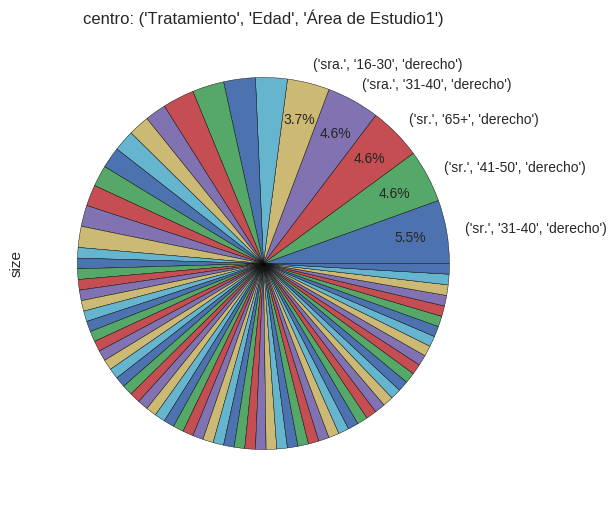

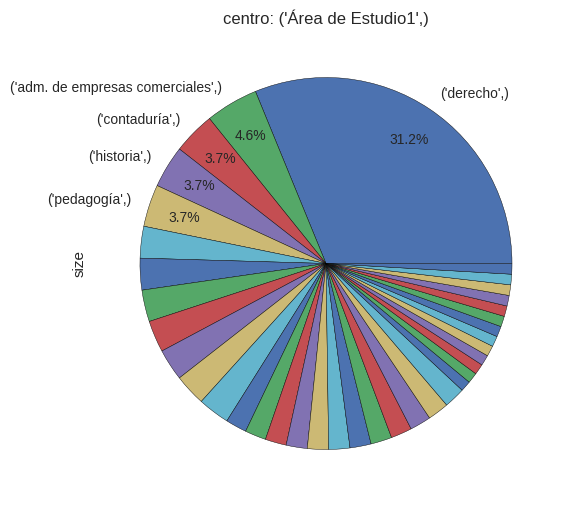

In [113]:
from IPython.display import display


def mypct(pct):
    return '%.1f%%' % pct if pct >= THRESHOLD else ''

def mylabels(count_df):
    return [(x if float(count_df.ix[[x]]['percentage'][0][:-1]) >= THRESHOLD else '') for x in count_df.index]

THRESHOLD = 3
N = 12
c = 1
for k in combinations_counter_dict:
    cn = combinations_counter_dict[k]
    print('GROUP #', c)
    print('GROUP BY:', k)
    print('NUMBER OF GROUPS:', len(cn))
    print('TOP', N, 'LARGEST GROUPS:')
    total = sum(cn.values())
    df = pd.DataFrame(
        [(a, b, total, '{:.2%}'.format(b / total)) for a, b in cn.most_common()],
        columns=(k, 'size', 'total', 'percentage'),
    )
    display(df.head(N))
    c += 1
    
    plt.figure()
    count_df = df.set_index(k)
    count_df['size'].plot(
        kind='pie', autopct=mypct, pctdistance=0.8, labels=mylabels(count_df), figsize=(6,6), title=b + ': ' + str(k))

In [114]:
for b, c in barrios_counter_df.iteritems():
    if c >= 100:
        print(b, c)

chapinero 304
candelaria 194
soledad 162
castilla 158
fontibon 157
cedritos 153
modelia 141
palermo 133
teusaquillo 119
centro 109
ciudad salitre 109
chapinero alto 108
recuerdo 104
macarena 101
aguas 100


### ciudad salitre

In [115]:
b = 'ciudad salitre'

In [116]:
barrio_bogota_df = perfiles_bogota_df[perfiles_bogota_df['Barrio'] == b]

#### Nivel de estudios

In [117]:
combs = [
    ('Nivel Estudio1',), # Nivel de estudio en el barrio
    ('Tratamiento', 'Edad', 'Nivel Estudio1'), # Nivel de estudio en el barrio por edad y sexo
]

In [118]:
%%time

combinations_counter_dict = {}

for comb in combs:
    df = barrio_bogota_df[list(comb)]
    groups = [tuple(x) for i, x in df.iterrows()]
    counter = Counter(groups)
    combinations_counter_dict[comb] = counter
    print(comb, len(counter))

('Nivel Estudio1',) 7
('Tratamiento', 'Edad', 'Nivel Estudio1') 36
CPU times: user 24.9 ms, sys: 295 µs, total: 25.2 ms
Wall time: 24.6 ms


GROUP # 1
GROUP BY: ('Tratamiento', 'Edad', 'Nivel Estudio1')
NUMBER OF GROUPS: 36
TOP 12 LARGEST GROUPS:


,"(Tratamiento, Edad, Nivel Estudio1)",size,total,percentage
0,"(sra., 16-30, universitario 1 nivel)",16,109,14.68%
1,"(sr., 16-30, universitario 2 nivel)",10,109,9.17%
2,"(sr., 16-30, universitario 1 nivel)",10,109,9.17%
3,"(sra., 16-30, profesional)",9,109,8.26%
4,"(sra., 16-30, universitario 2 nivel)",7,109,6.42%
5,"(sr., 51-64, profesional)",5,109,4.59%
6,"(sra., 51-64, profesional)",5,109,4.59%
7,"(sra., 31-40, profesional)",5,109,4.59%
8,"(sr., 31-40, profesional)",4,109,3.67%
9,"(sra., 41-50, profesional)",4,109,3.67%


GROUP # 2
GROUP BY: ('Nivel Estudio1',)
NUMBER OF GROUPS: 7
TOP 12 LARGEST GROUPS:


,"(Nivel Estudio1,)",size,total,percentage
0,"(profesional,)",37,109,33.94%
1,"(universitario 1 nivel,)",30,109,27.52%
2,"(universitario 2 nivel,)",18,109,16.51%
3,"(maestría,)",11,109,10.09%
4,"(postgrado,)",8,109,7.34%
5,"(graduado,)",3,109,2.75%
6,"(doctorado,)",2,109,1.83%


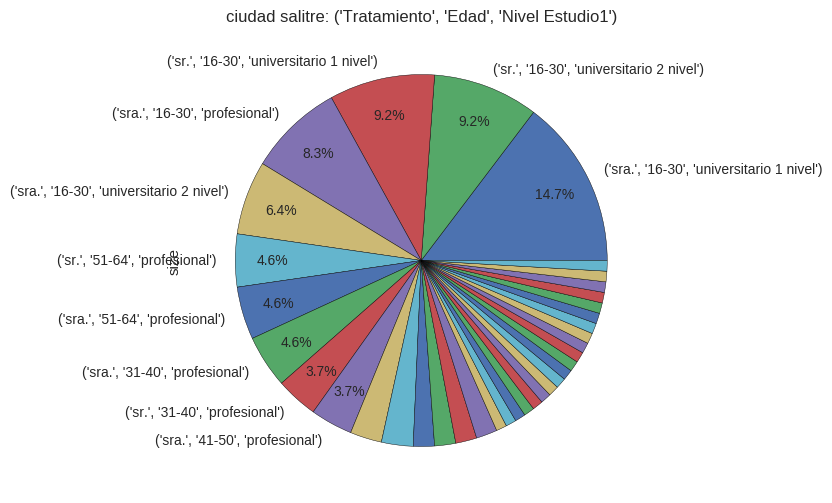

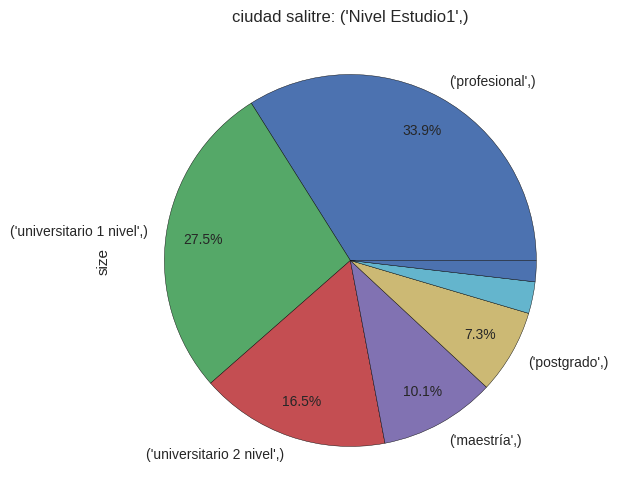

In [119]:
from IPython.display import display


def mypct(pct):
    return '%.1f%%' % pct if pct >= THRESHOLD else ''

def mylabels(count_df):
    return [(x if float(count_df.ix[[x]]['percentage'][0][:-1]) >= THRESHOLD else '') for x in count_df.index]

THRESHOLD = 3
N = 12
c = 1
for k in combinations_counter_dict:
    cn = combinations_counter_dict[k]
    print('GROUP #', c)
    print('GROUP BY:', k)
    print('NUMBER OF GROUPS:', len(cn))
    print('TOP', N, 'LARGEST GROUPS:')
    total = sum(cn.values())
    df = pd.DataFrame(
        [(a, b, total, '{:.2%}'.format(b / total)) for a, b in cn.most_common()],
        columns=(k, 'size', 'total', 'percentage'),
    )
    display(df.head(N))
    c += 1
    
    plt.figure()
    count_df = df.set_index(k)
    count_df['size'].plot(
        kind='pie', autopct=mypct, pctdistance=0.8, labels=mylabels(count_df), figsize=(6,6), title=b + ': ' + str(k))

#### Área de estudios

In [120]:
combs = [
    ('Área de Estudio1',), # Área de estudio en el barrio
    ('Tratamiento', 'Edad', 'Área de Estudio1'), # Área de estudio en el barrio por edad y sexo
]

In [121]:
%%time

combinations_counter_dict = {}

for comb in combs:
    df = barrio_bogota_df[list(comb)]
    groups = [tuple(x) for i, x in df.iterrows()]
    counter = Counter(groups)
    combinations_counter_dict[comb] = counter
    print(comb, len(counter))

('Área de Estudio1',) 39
('Tratamiento', 'Edad', 'Área de Estudio1') 76
CPU times: user 22.2 ms, sys: 0 ns, total: 22.2 ms
Wall time: 22.4 ms


GROUP # 1
GROUP BY: ('Tratamiento', 'Edad', 'Área de Estudio1')
NUMBER OF GROUPS: 76
TOP 12 LARGEST GROUPS:


,"(Tratamiento, Edad, Área de Estudio1)",size,total,percentage
0,"(sra., 16-30, derecho)",6,109,5.50%
1,"(sr., 16-30, derecho)",4,109,3.67%
2,"(sra., 16-30, sociología)",4,109,3.67%
3,"(sra., 16-30, psicología)",3,109,2.75%
4,"(sr., 31-40, derecho)",3,109,2.75%
5,"(sr., 16-30, ciencias políticas)",3,109,2.75%
6,"(sra., 16-30, literatura)",2,109,1.83%
7,"(sra., 16-30, economía)",2,109,1.83%
8,"(sr., 41-50, derecho)",2,109,1.83%
9,"(sr., 51-64, ciencias sociales)",2,109,1.83%


GROUP # 2
GROUP BY: ('Área de Estudio1',)
NUMBER OF GROUPS: 39
TOP 12 LARGEST GROUPS:


,"(Área de Estudio1,)",size,total,percentage
0,"(derecho,)",20,109,18.35%
1,"(economía,)",6,109,5.50%
2,"(ciencias políticas,)",5,109,4.59%
3,"(literatura,)",5,109,4.59%
4,"(sociología,)",5,109,4.59%
5,"(arquitectura,)",5,109,4.59%
6,"(psicología,)",5,109,4.59%
7,"(historia,)",5,109,4.59%
8,"(artes plásticas,)",4,109,3.67%
9,"(filosofía y letras,)",3,109,2.75%


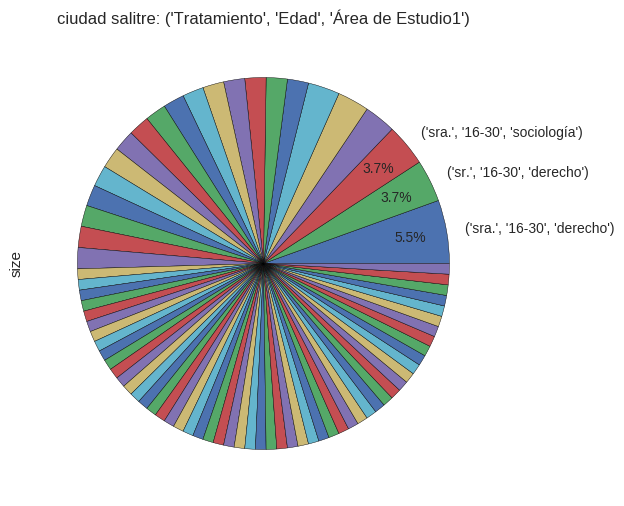

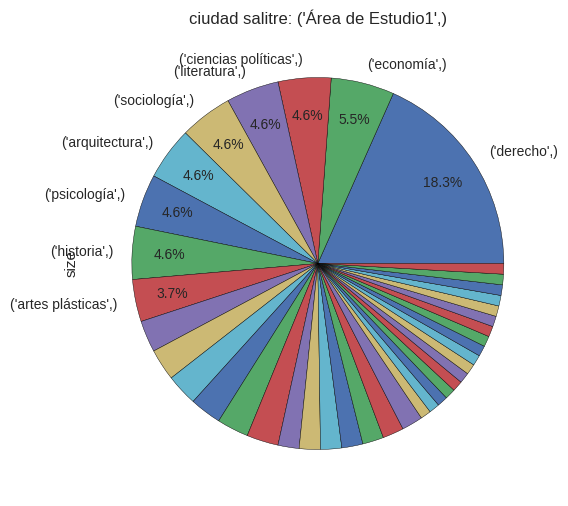

In [122]:
from IPython.display import display


def mypct(pct):
    return '%.1f%%' % pct if pct >= THRESHOLD else ''

def mylabels(count_df):
    return [(x if float(count_df.ix[[x]]['percentage'][0][:-1]) >= THRESHOLD else '') for x in count_df.index]

THRESHOLD = 3
N = 12
c = 1
for k in combinations_counter_dict:
    cn = combinations_counter_dict[k]
    print('GROUP #', c)
    print('GROUP BY:', k)
    print('NUMBER OF GROUPS:', len(cn))
    print('TOP', N, 'LARGEST GROUPS:')
    total = sum(cn.values())
    df = pd.DataFrame(
        [(a, b, total, '{:.2%}'.format(b / total)) for a, b in cn.most_common()],
        columns=(k, 'size', 'total', 'percentage'),
    )
    display(df.head(N))
    c += 1
    
    plt.figure()
    count_df = df.set_index(k)
    count_df['size'].plot(
        kind='pie', autopct=mypct, pctdistance=0.8, labels=mylabels(count_df), figsize=(6,6), title=b + ': ' + str(k))

In [123]:
for b, c in barrios_counter_df.iteritems():
    if c >= 100:
        print(b, c)

chapinero 304
candelaria 194
soledad 162
castilla 158
fontibon 157
cedritos 153
modelia 141
palermo 133
teusaquillo 119
centro 109
ciudad salitre 109
chapinero alto 108
recuerdo 104
macarena 101
aguas 100


### chapinero alto

In [124]:
b = 'chapinero alto'

In [125]:
barrio_bogota_df = perfiles_bogota_df[perfiles_bogota_df['Barrio'] == b]

#### Nivel de estudios

In [126]:
combs = [
    ('Nivel Estudio1',), # Nivel de estudio en el barrio
    ('Tratamiento', 'Edad', 'Nivel Estudio1'), # Nivel de estudio en el barrio por edad y sexo
]

In [127]:
%%time

combinations_counter_dict = {}

for comb in combs:
    df = barrio_bogota_df[list(comb)]
    groups = [tuple(x) for i, x in df.iterrows()]
    counter = Counter(groups)
    combinations_counter_dict[comb] = counter
    print(comb, len(counter))

('Nivel Estudio1',) 8
('Tratamiento', 'Edad', 'Nivel Estudio1') 31
CPU times: user 23.8 ms, sys: 0 ns, total: 23.8 ms
Wall time: 23 ms


GROUP # 1
GROUP BY: ('Tratamiento', 'Edad', 'Nivel Estudio1')
NUMBER OF GROUPS: 31
TOP 12 LARGEST GROUPS:


,"(Tratamiento, Edad, Nivel Estudio1)",size,total,percentage
0,"(sra., 16-30, universitario 1 nivel)",13,108,12.04%
1,"(sr., 16-30, universitario 2 nivel)",10,108,9.26%
2,"(sr., 16-30, universitario 1 nivel)",10,108,9.26%
3,"(sra., 31-40, profesional)",8,108,7.41%
4,"(sr., 51-64, profesional)",6,108,5.56%
5,"(sra., 16-30, universitario 2 nivel)",6,108,5.56%
6,"(sr., 41-50, profesional)",6,108,5.56%
7,"(sr., 31-40, profesional)",5,108,4.63%
8,"(sr., 65+, profesional)",5,108,4.63%
9,"(sra., 31-40, maestría)",4,108,3.70%


GROUP # 2
GROUP BY: ('Nivel Estudio1',)
NUMBER OF GROUPS: 8
TOP 12 LARGEST GROUPS:


,"(Nivel Estudio1,)",size,total,percentage
0,"(profesional,)",39,108,36.11%
1,"(universitario 1 nivel,)",24,108,22.22%
2,"(universitario 2 nivel,)",17,108,15.74%
3,"(maestría,)",10,108,9.26%
4,"(postgrado,)",10,108,9.26%
5,"(graduado,)",4,108,3.70%
6,"(doctorado,)",3,108,2.78%
7,"(tecnológico,)",1,108,0.93%


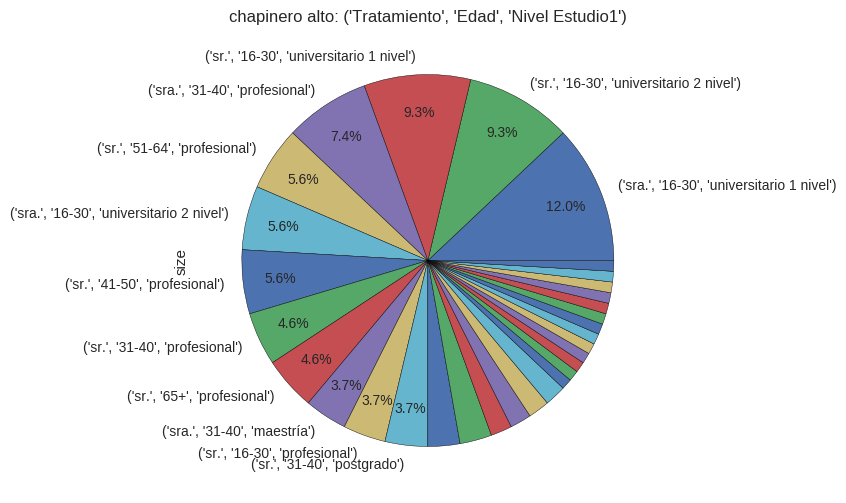

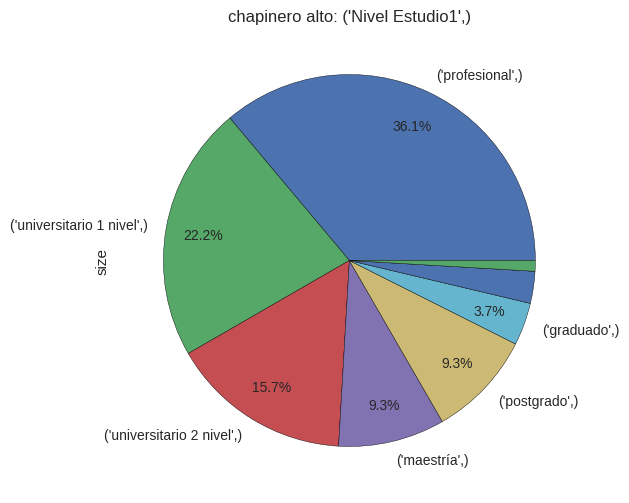

In [128]:
from IPython.display import display


def mypct(pct):
    return '%.1f%%' % pct if pct >= THRESHOLD else ''

def mylabels(count_df):
    return [(x if float(count_df.ix[[x]]['percentage'][0][:-1]) >= THRESHOLD else '') for x in count_df.index]

THRESHOLD = 3
N = 12
c = 1
for k in combinations_counter_dict:
    cn = combinations_counter_dict[k]
    print('GROUP #', c)
    print('GROUP BY:', k)
    print('NUMBER OF GROUPS:', len(cn))
    print('TOP', N, 'LARGEST GROUPS:')
    total = sum(cn.values())
    df = pd.DataFrame(
        [(a, b, total, '{:.2%}'.format(b / total)) for a, b in cn.most_common()],
        columns=(k, 'size', 'total', 'percentage'),
    )
    display(df.head(N))
    c += 1
    
    plt.figure()
    count_df = df.set_index(k)
    count_df['size'].plot(
        kind='pie', autopct=mypct, pctdistance=0.8, labels=mylabels(count_df), figsize=(6,6), title=b + ': ' + str(k))

#### Área de estudios

In [129]:
combs = [
    ('Área de Estudio1',), # Área de estudio en el barrio
    ('Tratamiento', 'Edad', 'Área de Estudio1'), # Área de estudio en el barrio por edad y sexo
]

In [130]:
%%time

combinations_counter_dict = {}

for comb in combs:
    df = barrio_bogota_df[list(comb)]
    groups = [tuple(x) for i, x in df.iterrows()]
    counter = Counter(groups)
    combinations_counter_dict[comb] = counter
    print(comb, len(counter))

('Área de Estudio1',) 36
('Tratamiento', 'Edad', 'Área de Estudio1') 76
CPU times: user 23.6 ms, sys: 0 ns, total: 23.6 ms
Wall time: 22.2 ms


GROUP # 1
GROUP BY: ('Tratamiento', 'Edad', 'Área de Estudio1')
NUMBER OF GROUPS: 76
TOP 12 LARGEST GROUPS:


,"(Tratamiento, Edad, Área de Estudio1)",size,total,percentage
0,"(sra., 31-40, derecho)",6,108,5.56%
1,"(sr., 41-50, derecho)",5,108,4.63%
2,"(sra., 16-30, derecho)",4,108,3.70%
3,"(sr., 16-30, derecho)",4,108,3.70%
4,"(sra., 31-40, filosofía y letras)",3,108,2.78%
5,"(sra., 16-30, antropología)",3,108,2.78%
6,"(sr., 16-30, historia)",3,108,2.78%
7,"(sr., 51-64, filosofía y letras)",2,108,1.85%
8,"(sr., 31-40, derecho)",2,108,1.85%
9,"(sra., 51-64, literatura)",2,108,1.85%


GROUP # 2
GROUP BY: ('Área de Estudio1',)
NUMBER OF GROUPS: 36
TOP 12 LARGEST GROUPS:


,"(Área de Estudio1,)",size,total,percentage
0,"(derecho,)",25,108,23.15%
1,"(filosofía y letras,)",7,108,6.48%
2,"(historia,)",7,108,6.48%
3,"(literatura,)",6,108,5.56%
4,"(economía,)",6,108,5.56%
5,"(comunicación social,)",6,108,5.56%
6,"(artes escénicas,)",4,108,3.70%
7,"(adm. de empresas,)",4,108,3.70%
8,"(antropología,)",4,108,3.70%
9,"(ciencias políticas,)",3,108,2.78%


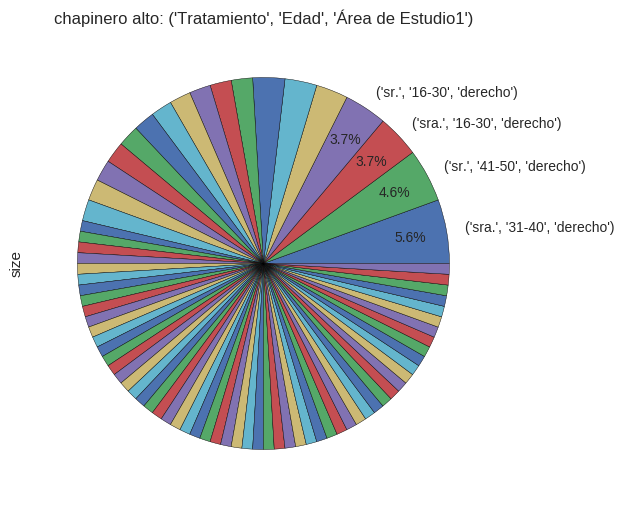

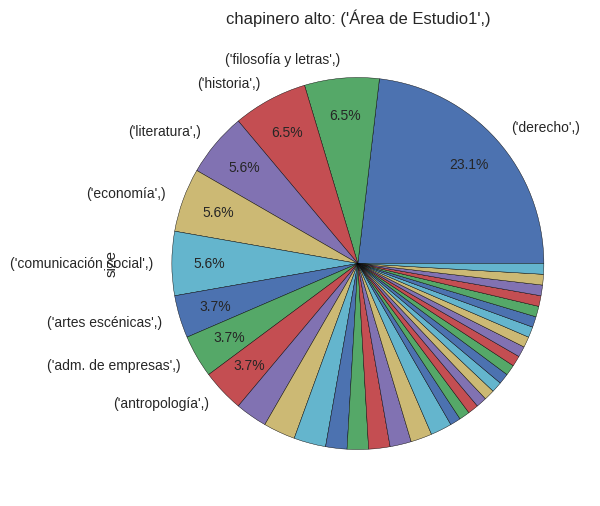

In [131]:
from IPython.display import display


def mypct(pct):
    return '%.1f%%' % pct if pct >= THRESHOLD else ''

def mylabels(count_df):
    return [(x if float(count_df.ix[[x]]['percentage'][0][:-1]) >= THRESHOLD else '') for x in count_df.index]

THRESHOLD = 3
N = 12
c = 1
for k in combinations_counter_dict:
    cn = combinations_counter_dict[k]
    print('GROUP #', c)
    print('GROUP BY:', k)
    print('NUMBER OF GROUPS:', len(cn))
    print('TOP', N, 'LARGEST GROUPS:')
    total = sum(cn.values())
    df = pd.DataFrame(
        [(a, b, total, '{:.2%}'.format(b / total)) for a, b in cn.most_common()],
        columns=(k, 'size', 'total', 'percentage'),
    )
    display(df.head(N))
    c += 1
    
    plt.figure()
    count_df = df.set_index(k)
    count_df['size'].plot(
        kind='pie', autopct=mypct, pctdistance=0.8, labels=mylabels(count_df), figsize=(6,6), title=b + ': ' + str(k))

In [132]:
for b, c in barrios_counter_df.iteritems():
    if c >= 100:
        print(b, c)

chapinero 304
candelaria 194
soledad 162
castilla 158
fontibon 157
cedritos 153
modelia 141
palermo 133
teusaquillo 119
centro 109
ciudad salitre 109
chapinero alto 108
recuerdo 104
macarena 101
aguas 100


### recuerdo

In [133]:
b = 'recuerdo'

In [134]:
barrio_bogota_df = perfiles_bogota_df[perfiles_bogota_df['Barrio'] == b]

#### Nivel de estudios

In [135]:
combs = [
    ('Nivel Estudio1',), # Nivel de estudio en el barrio
    ('Tratamiento', 'Edad', 'Nivel Estudio1'), # Nivel de estudio en el barrio por edad y sexo
]

In [136]:
%%time

combinations_counter_dict = {}

for comb in combs:
    df = barrio_bogota_df[list(comb)]
    groups = [tuple(x) for i, x in df.iterrows()]
    counter = Counter(groups)
    combinations_counter_dict[comb] = counter
    print(comb, len(counter))

('Nivel Estudio1',) 8
('Tratamiento', 'Edad', 'Nivel Estudio1') 26
CPU times: user 32.1 ms, sys: 0 ns, total: 32.1 ms
Wall time: 30.8 ms


GROUP # 1
GROUP BY: ('Tratamiento', 'Edad', 'Nivel Estudio1')
NUMBER OF GROUPS: 26
TOP 12 LARGEST GROUPS:


,"(Tratamiento, Edad, Nivel Estudio1)",size,total,percentage
0,"(sr., 16-30, universitario 1 nivel)",23,104,22.12%
1,"(sra., 16-30, universitario 1 nivel)",20,104,19.23%
2,"(sr., 16-30, universitario 2 nivel)",11,104,10.58%
3,"(sra., 16-30, universitario 2 nivel)",9,104,8.65%
4,"(sr., 41-50, profesional)",4,104,3.85%
5,"(sr., 31-40, profesional)",4,104,3.85%
6,"(sr., 16-30, maestría)",4,104,3.85%
7,"(sra., 16-30, profesional)",3,104,2.88%
8,"(sra., 31-40, maestría)",3,104,2.88%
9,"(sr., 51-64, profesional)",2,104,1.92%


GROUP # 2
GROUP BY: ('Nivel Estudio1',)
NUMBER OF GROUPS: 8
TOP 12 LARGEST GROUPS:


,"(Nivel Estudio1,)",size,total,percentage
0,"(universitario 1 nivel,)",45,104,43.27%
1,"(universitario 2 nivel,)",21,104,20.19%
2,"(profesional,)",17,104,16.35%
3,"(maestría,)",10,104,9.62%
4,"(postgrado,)",5,104,4.81%
5,"(graduado,)",3,104,2.88%
6,"(doctorado,)",2,104,1.92%
7,"(técnico,)",1,104,0.96%


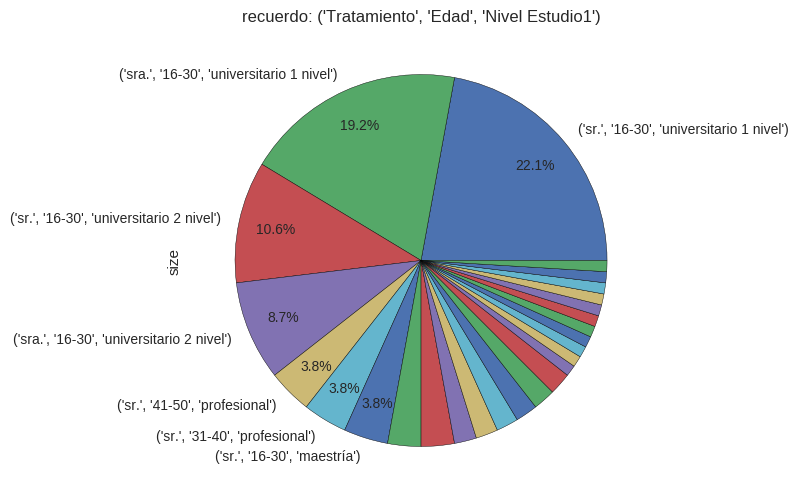

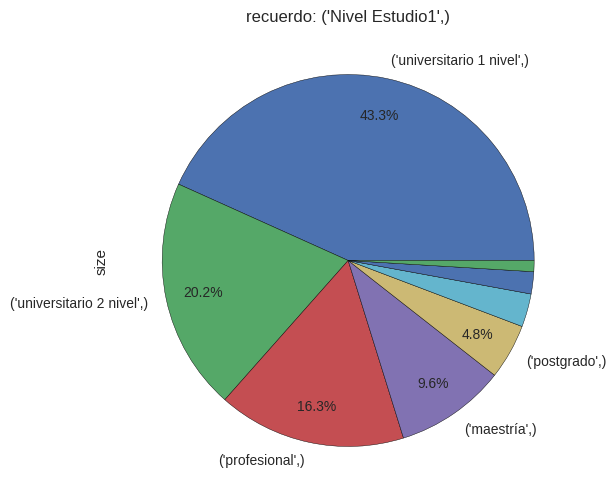

In [137]:
from IPython.display import display


def mypct(pct):
    return '%.1f%%' % pct if pct >= THRESHOLD else ''

def mylabels(count_df):
    return [(x if float(count_df.ix[[x]]['percentage'][0][:-1]) >= THRESHOLD else '') for x in count_df.index]

THRESHOLD = 3
N = 12
c = 1
for k in combinations_counter_dict:
    cn = combinations_counter_dict[k]
    print('GROUP #', c)
    print('GROUP BY:', k)
    print('NUMBER OF GROUPS:', len(cn))
    print('TOP', N, 'LARGEST GROUPS:')
    total = sum(cn.values())
    df = pd.DataFrame(
        [(a, b, total, '{:.2%}'.format(b / total)) for a, b in cn.most_common()],
        columns=(k, 'size', 'total', 'percentage'),
    )
    display(df.head(N))
    c += 1
    
    plt.figure()
    count_df = df.set_index(k)
    count_df['size'].plot(
        kind='pie', autopct=mypct, pctdistance=0.8, labels=mylabels(count_df), figsize=(6,6), title=b + ': ' + str(k))

#### Área de estudios

In [138]:
combs = [
    ('Área de Estudio1',), # Área de estudio en el barrio
    ('Tratamiento', 'Edad', 'Área de Estudio1'), # Área de estudio en el barrio por edad y sexo
]

In [139]:
%%time

combinations_counter_dict = {}

for comb in combs:
    df = barrio_bogota_df[list(comb)]
    groups = [tuple(x) for i, x in df.iterrows()]
    counter = Counter(groups)
    combinations_counter_dict[comb] = counter
    print(comb, len(counter))

('Área de Estudio1',) 45
('Tratamiento', 'Edad', 'Área de Estudio1') 77
CPU times: user 24.6 ms, sys: 18.1 ms, total: 42.7 ms
Wall time: 21.8 ms


GROUP # 1
GROUP BY: ('Tratamiento', 'Edad', 'Área de Estudio1')
NUMBER OF GROUPS: 77
TOP 12 LARGEST GROUPS:


,"(Tratamiento, Edad, Área de Estudio1)",size,total,percentage
0,"(sr., 16-30, derecho)",5,104,4.81%
1,"(sr., 16-30, idiomas)",5,104,4.81%
2,"(sra., 16-30, derecho)",5,104,4.81%
3,"(sra., 16-30, literatura)",4,104,3.85%
4,"(sra., 16-30, física)",3,104,2.88%
5,"(sr., 16-30, historia)",2,104,1.92%
6,"(sra., 16-30, biología)",2,104,1.92%
7,"(sr., 16-30, medicina)",2,104,1.92%
8,"(sra., 31-40, sociología)",2,104,1.92%
9,"(sr., 16-30, ing. química)",2,104,1.92%


GROUP # 2
GROUP BY: ('Área de Estudio1',)
NUMBER OF GROUPS: 45
TOP 12 LARGEST GROUPS:


,"(Área de Estudio1,)",size,total,percentage
0,"(derecho,)",11,104,10.58%
1,"(idiomas,)",7,104,6.73%
2,"(literatura,)",7,104,6.73%
3,"(sociología,)",5,104,4.81%
4,"(antropología,)",5,104,4.81%
5,"(biología,)",4,104,3.85%
6,"(física,)",4,104,3.85%
7,"(arquitectura,)",4,104,3.85%
8,"(historia,)",4,104,3.85%
9,"(cine fotografía y televisión,)",3,104,2.88%


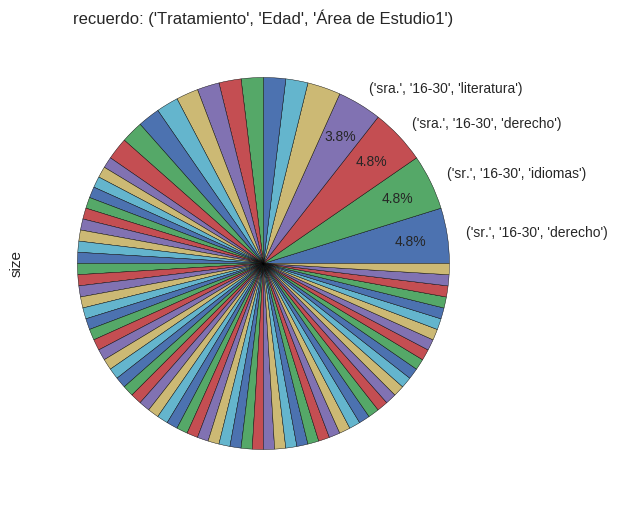

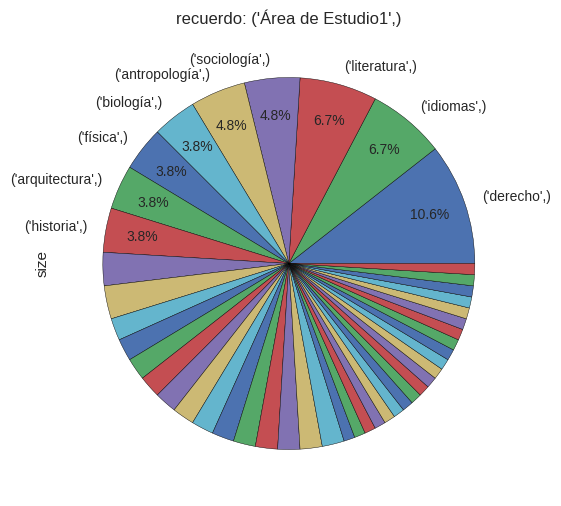

In [140]:
from IPython.display import display


def mypct(pct):
    return '%.1f%%' % pct if pct >= THRESHOLD else ''

def mylabels(count_df):
    return [(x if float(count_df.ix[[x]]['percentage'][0][:-1]) >= THRESHOLD else '') for x in count_df.index]

THRESHOLD = 3
N = 12
c = 1
for k in combinations_counter_dict:
    cn = combinations_counter_dict[k]
    print('GROUP #', c)
    print('GROUP BY:', k)
    print('NUMBER OF GROUPS:', len(cn))
    print('TOP', N, 'LARGEST GROUPS:')
    total = sum(cn.values())
    df = pd.DataFrame(
        [(a, b, total, '{:.2%}'.format(b / total)) for a, b in cn.most_common()],
        columns=(k, 'size', 'total', 'percentage'),
    )
    display(df.head(N))
    c += 1
    
    plt.figure()
    count_df = df.set_index(k)
    count_df['size'].plot(
        kind='pie', autopct=mypct, pctdistance=0.8, labels=mylabels(count_df), figsize=(6,6), title=b + ': ' + str(k))

In [141]:
for b, c in barrios_counter_df.iteritems():
    if c >= 100:
        print(b, c)

chapinero 304
candelaria 194
soledad 162
castilla 158
fontibon 157
cedritos 153
modelia 141
palermo 133
teusaquillo 119
centro 109
ciudad salitre 109
chapinero alto 108
recuerdo 104
macarena 101
aguas 100


### macarena

In [142]:
b = 'macarena'

In [143]:
barrio_bogota_df = perfiles_bogota_df[perfiles_bogota_df['Barrio'] == b]

#### Nivel de estudios

In [144]:
combs = [
    ('Nivel Estudio1',), # Nivel de estudio en el barrio
    ('Tratamiento', 'Edad', 'Nivel Estudio1'), # Nivel de estudio en el barrio por edad y sexo
]

In [145]:
%%time

combinations_counter_dict = {}

for comb in combs:
    df = barrio_bogota_df[list(comb)]
    groups = [tuple(x) for i, x in df.iterrows()]
    counter = Counter(groups)
    combinations_counter_dict[comb] = counter
    print(comb, len(counter))

('Nivel Estudio1',) 7
('Tratamiento', 'Edad', 'Nivel Estudio1') 34
CPU times: user 23.2 ms, sys: 0 ns, total: 23.2 ms
Wall time: 22 ms


GROUP # 1
GROUP BY: ('Tratamiento', 'Edad', 'Nivel Estudio1')
NUMBER OF GROUPS: 34
TOP 12 LARGEST GROUPS:


,"(Tratamiento, Edad, Nivel Estudio1)",size,total,percentage
0,"(sra., 31-40, profesional)",10,101,9.90%
1,"(sr., 51-64, profesional)",9,101,8.91%
2,"(sra., 16-30, universitario 1 nivel)",7,101,6.93%
3,"(sra., 16-30, universitario 2 nivel)",7,101,6.93%
4,"(sr., 41-50, profesional)",6,101,5.94%
5,"(sr., 16-30, profesional)",6,101,5.94%
6,"(sr., 16-30, universitario 2 nivel)",5,101,4.95%
7,"(sr., 31-40, profesional)",4,101,3.96%
8,"(sr., 16-30, universitario 1 nivel)",4,101,3.96%
9,"(sra., 16-30, profesional)",3,101,2.97%


GROUP # 2
GROUP BY: ('Nivel Estudio1',)
NUMBER OF GROUPS: 7
TOP 12 LARGEST GROUPS:


,"(Nivel Estudio1,)",size,total,percentage
0,"(profesional,)",44,101,43.56%
1,"(universitario 2 nivel,)",16,101,15.84%
2,"(maestría,)",13,101,12.87%
3,"(universitario 1 nivel,)",13,101,12.87%
4,"(doctorado,)",8,101,7.92%
5,"(postgrado,)",5,101,4.95%
6,"(graduado,)",2,101,1.98%


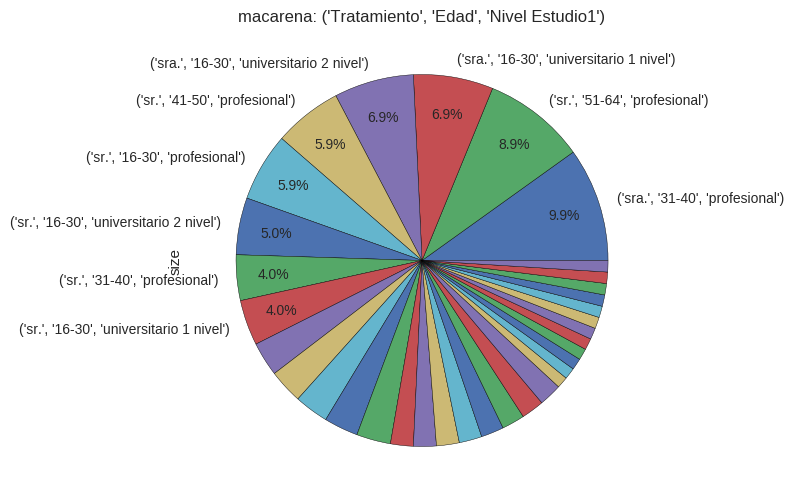

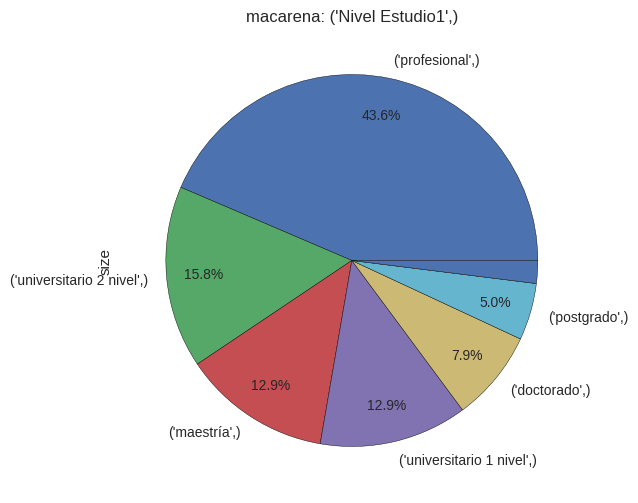

In [146]:
from IPython.display import display


def mypct(pct):
    return '%.1f%%' % pct if pct >= THRESHOLD else ''

def mylabels(count_df):
    return [(x if float(count_df.ix[[x]]['percentage'][0][:-1]) >= THRESHOLD else '') for x in count_df.index]

THRESHOLD = 3
N = 12
c = 1
for k in combinations_counter_dict:
    cn = combinations_counter_dict[k]
    print('GROUP #', c)
    print('GROUP BY:', k)
    print('NUMBER OF GROUPS:', len(cn))
    print('TOP', N, 'LARGEST GROUPS:')
    total = sum(cn.values())
    df = pd.DataFrame(
        [(a, b, total, '{:.2%}'.format(b / total)) for a, b in cn.most_common()],
        columns=(k, 'size', 'total', 'percentage'),
    )
    display(df.head(N))
    c += 1
    
    plt.figure()
    count_df = df.set_index(k)
    count_df['size'].plot(
        kind='pie', autopct=mypct, pctdistance=0.8, labels=mylabels(count_df), figsize=(6,6), title=b + ': ' + str(k))

#### Área de estudios

In [147]:
combs = [
    ('Área de Estudio1',), # Área de estudio en el barrio
    ('Tratamiento', 'Edad', 'Área de Estudio1'), # Área de estudio en el barrio por edad y sexo
]

In [148]:
%%time

combinations_counter_dict = {}

for comb in combs:
    df = barrio_bogota_df[list(comb)]
    groups = [tuple(x) for i, x in df.iterrows()]
    counter = Counter(groups)
    combinations_counter_dict[comb] = counter
    print(comb, len(counter))

('Área de Estudio1',) 38
('Tratamiento', 'Edad', 'Área de Estudio1') 81
CPU times: user 21.6 ms, sys: 17 ms, total: 38.6 ms
Wall time: 22.6 ms


GROUP # 1
GROUP BY: ('Tratamiento', 'Edad', 'Área de Estudio1')
NUMBER OF GROUPS: 81
TOP 12 LARGEST GROUPS:


,"(Tratamiento, Edad, Área de Estudio1)",size,total,percentage
0,"(sr., 16-30, derecho)",3,101,2.97%
1,"(sra., 16-30, antropología)",3,101,2.97%
2,"(sra., 16-30, artes plásticas)",2,101,1.98%
3,"(sr., 51-64, economía)",2,101,1.98%
4,"(sra., 31-40, física)",2,101,1.98%
5,"(sr., 41-50, arquitectura)",2,101,1.98%
6,"(sra., 31-40, arquitectura)",2,101,1.98%
7,"(sr., 51-64, arquitectura)",2,101,1.98%
8,"(sra., 31-40, artes plásticas)",2,101,1.98%
9,"(sra., 16-30, psicología)",2,101,1.98%


GROUP # 2
GROUP BY: ('Área de Estudio1',)
NUMBER OF GROUPS: 38
TOP 12 LARGEST GROUPS:


,"(Área de Estudio1,)",size,total,percentage
0,"(antropología,)",9,101,8.91%
1,"(arquitectura,)",8,101,7.92%
2,"(derecho,)",8,101,7.92%
3,"(artes plásticas,)",6,101,5.94%
4,"(literatura,)",6,101,5.94%
5,"(ciencias sociales,)",5,101,4.95%
6,"(sociología,)",5,101,4.95%
7,"(psicología,)",5,101,4.95%
8,"(ciencias políticas,)",4,101,3.96%
9,"(periodismo,)",4,101,3.96%


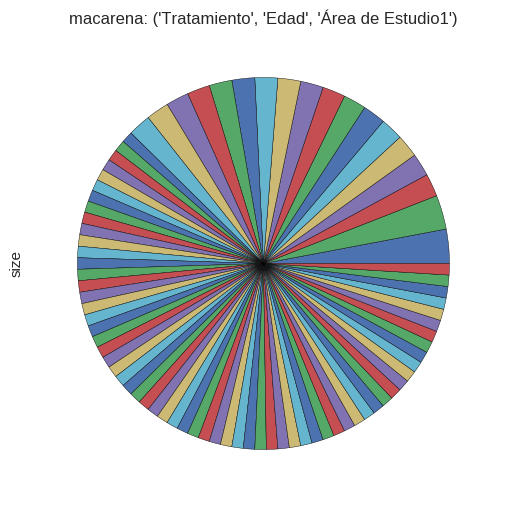

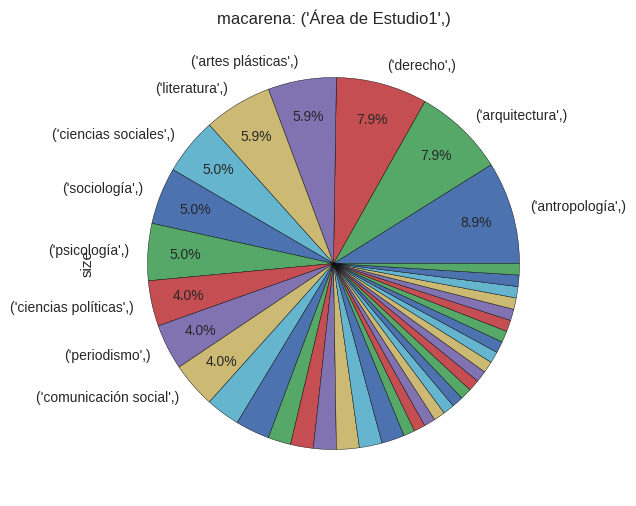

In [149]:
from IPython.display import display


def mypct(pct):
    return '%.1f%%' % pct if pct >= THRESHOLD else ''

def mylabels(count_df):
    return [(x if float(count_df.ix[[x]]['percentage'][0][:-1]) >= THRESHOLD else '') for x in count_df.index]

THRESHOLD = 3
N = 12
c = 1
for k in combinations_counter_dict:
    cn = combinations_counter_dict[k]
    print('GROUP #', c)
    print('GROUP BY:', k)
    print('NUMBER OF GROUPS:', len(cn))
    print('TOP', N, 'LARGEST GROUPS:')
    total = sum(cn.values())
    df = pd.DataFrame(
        [(a, b, total, '{:.2%}'.format(b / total)) for a, b in cn.most_common()],
        columns=(k, 'size', 'total', 'percentage'),
    )
    display(df.head(N))
    c += 1
    
    plt.figure()
    count_df = df.set_index(k)
    count_df['size'].plot(
        kind='pie', autopct=mypct, pctdistance=0.8, labels=mylabels(count_df), figsize=(6,6), title=b + ': ' + str(k))

In [150]:
for b, c in barrios_counter_df.iteritems():
    if c >= 100:
        print(b, c)

chapinero 304
candelaria 194
soledad 162
castilla 158
fontibon 157
cedritos 153
modelia 141
palermo 133
teusaquillo 119
centro 109
ciudad salitre 109
chapinero alto 108
recuerdo 104
macarena 101
aguas 100


### aguas

In [151]:
b = 'aguas'

In [152]:
barrio_bogota_df = perfiles_bogota_df[perfiles_bogota_df['Barrio'] == b]

#### Nivel de estudios

In [153]:
combs = [
    ('Nivel Estudio1',), # Nivel de estudio en el barrio
    ('Tratamiento', 'Edad', 'Nivel Estudio1'), # Nivel de estudio en el barrio por edad y sexo
]

In [154]:
%%time

combinations_counter_dict = {}

for comb in combs:
    df = barrio_bogota_df[list(comb)]
    groups = [tuple(x) for i, x in df.iterrows()]
    counter = Counter(groups)
    combinations_counter_dict[comb] = counter
    print(comb, len(counter))

('Nivel Estudio1',) 8
('Tratamiento', 'Edad', 'Nivel Estudio1') 37
CPU times: user 23.9 ms, sys: 0 ns, total: 23.9 ms
Wall time: 22.4 ms


GROUP # 1
GROUP BY: ('Tratamiento', 'Edad', 'Nivel Estudio1')
NUMBER OF GROUPS: 37
TOP 12 LARGEST GROUPS:


,"(Tratamiento, Edad, Nivel Estudio1)",size,total,percentage
0,"(sr., 16-30, universitario 1 nivel)",9,100,9.00%
1,"(sra., 16-30, universitario 2 nivel)",6,100,6.00%
2,"(sr., 31-40, profesional)",6,100,6.00%
3,"(sr., 51-64, profesional)",5,100,5.00%
4,"(sra., 16-30, universitario 1 nivel)",5,100,5.00%
5,"(sra., 41-50, profesional)",5,100,5.00%
6,"(sra., 31-40, profesional)",5,100,5.00%
7,"(sr., 16-30, universitario 2 nivel)",5,100,5.00%
8,"(sra., 51-64, profesional)",4,100,4.00%
9,"(sr., 41-50, profesional)",3,100,3.00%


GROUP # 2
GROUP BY: ('Nivel Estudio1',)
NUMBER OF GROUPS: 8
TOP 12 LARGEST GROUPS:


,"(Nivel Estudio1,)",size,total,percentage
0,"(profesional,)",37,100,37.00%
1,"(universitario 1 nivel,)",16,100,16.00%
2,"(maestría,)",15,100,15.00%
3,"(universitario 2 nivel,)",14,100,14.00%
4,"(postgrado,)",10,100,10.00%
5,"(doctorado,)",6,100,6.00%
6,"(tecnológico,)",1,100,1.00%
7,"(técnico,)",1,100,1.00%


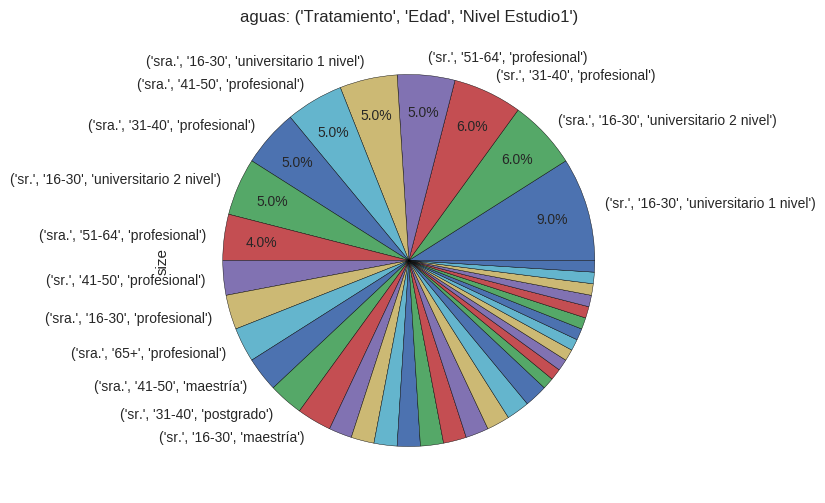

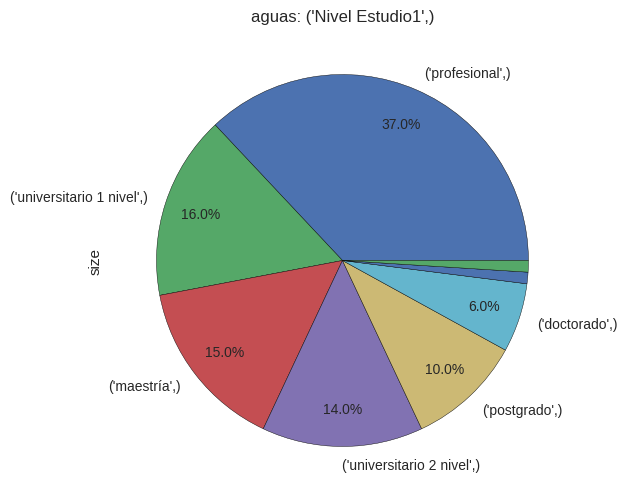

In [155]:
from IPython.display import display


def mypct(pct):
    return '%.1f%%' % pct if pct >= THRESHOLD else ''

def mylabels(count_df):
    return [(x if float(count_df.ix[[x]]['percentage'][0][:-1]) >= THRESHOLD else '') for x in count_df.index]

THRESHOLD = 3
N = 12
c = 1
for k in combinations_counter_dict:
    cn = combinations_counter_dict[k]
    print('GROUP #', c)
    print('GROUP BY:', k)
    print('NUMBER OF GROUPS:', len(cn))
    print('TOP', N, 'LARGEST GROUPS:')
    total = sum(cn.values())
    df = pd.DataFrame(
        [(a, b, total, '{:.2%}'.format(b / total)) for a, b in cn.most_common()],
        columns=(k, 'size', 'total', 'percentage'),
    )
    display(df.head(N))
    c += 1
    
    plt.figure()
    count_df = df.set_index(k)
    count_df['size'].plot(
        kind='pie', autopct=mypct, pctdistance=0.8, labels=mylabels(count_df), figsize=(6,6), title=b + ': ' + str(k))

#### Área de estudios

In [156]:
combs = [
    ('Área de Estudio1',), # Área de estudio en el barrio
    ('Tratamiento', 'Edad', 'Área de Estudio1'), # Área de estudio en el barrio por edad y sexo
]

In [157]:
%%time

combinations_counter_dict = {}

for comb in combs:
    df = barrio_bogota_df[list(comb)]
    groups = [tuple(x) for i, x in df.iterrows()]
    counter = Counter(groups)
    combinations_counter_dict[comb] = counter
    print(comb, len(counter))

('Área de Estudio1',) 38
('Tratamiento', 'Edad', 'Área de Estudio1') 71
CPU times: user 24.4 ms, sys: 20.3 ms, total: 44.6 ms
Wall time: 21.4 ms


GROUP # 1
GROUP BY: ('Tratamiento', 'Edad', 'Área de Estudio1')
NUMBER OF GROUPS: 71
TOP 12 LARGEST GROUPS:


,"(Tratamiento, Edad, Área de Estudio1)",size,total,percentage
0,"(sr., 16-30, derecho)",5,100,5.00%
1,"(sra., 16-30, derecho)",4,100,4.00%
2,"(sr., 31-40, antropología)",3,100,3.00%
3,"(sr., 41-50, derecho)",3,100,3.00%
4,"(sra., 31-40, historia)",3,100,3.00%
5,"(sra., 16-30, ing. civil)",3,100,3.00%
6,"(sr., 31-40, historia)",3,100,3.00%
7,"(sr., 51-64, derecho)",2,100,2.00%
8,"(sr., 31-40, derecho)",2,100,2.00%
9,"(sra., 16-30, artes escénicas)",2,100,2.00%


GROUP # 2
GROUP BY: ('Área de Estudio1',)
NUMBER OF GROUPS: 38
TOP 12 LARGEST GROUPS:


,"(Área de Estudio1,)",size,total,percentage
0,"(derecho,)",20,100,20.00%
1,"(historia,)",8,100,8.00%
2,"(literatura,)",6,100,6.00%
3,"(filosofía y letras,)",6,100,6.00%
4,"(pedagogía,)",4,100,4.00%
5,"(periodismo,)",4,100,4.00%
6,"(psicología,)",4,100,4.00%
7,"(antropología,)",4,100,4.00%
8,"(artes escénicas,)",3,100,3.00%
9,"(trabajo social,)",3,100,3.00%


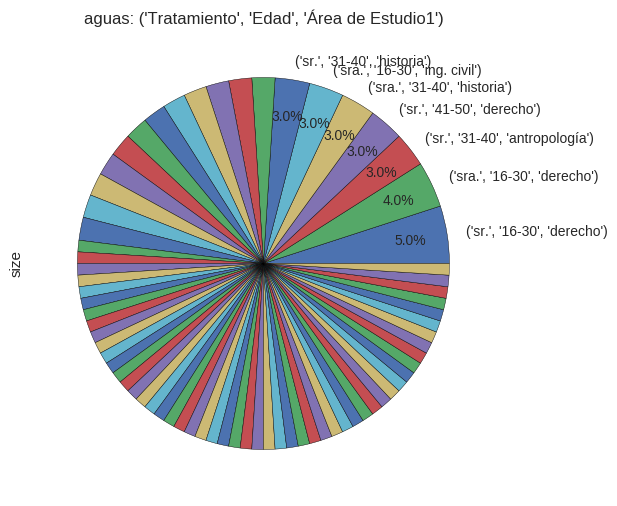

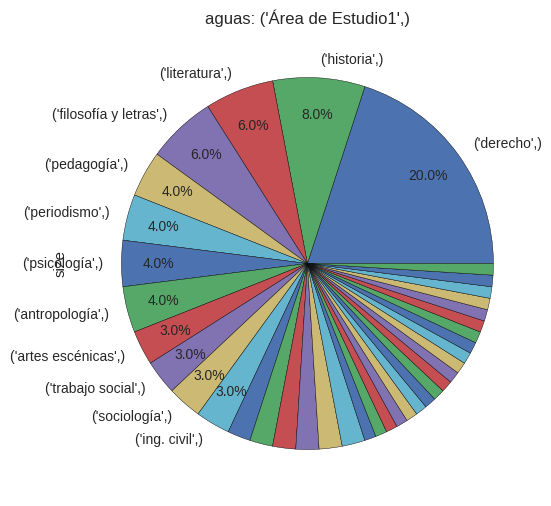

In [158]:
from IPython.display import display


def mypct(pct):
    return '%.1f%%' % pct if pct + 0.0001 >= THRESHOLD else ''

def mylabels(count_df):
    return [(x if float(count_df.ix[[x]]['percentage'][0][:-1]) >= THRESHOLD else '') for x in count_df.index]

THRESHOLD = 3
N = 12
c = 1
for k in combinations_counter_dict:
    cn = combinations_counter_dict[k]
    print('GROUP #', c)
    print('GROUP BY:', k)
    print('NUMBER OF GROUPS:', len(cn))
    print('TOP', N, 'LARGEST GROUPS:')
    total = sum(cn.values())
    df = pd.DataFrame(
        [(a, b, total, '{:.2%}'.format(b / total)) for a, b in cn.most_common()],
        columns=(k, 'size', 'total', 'percentage'),
    )
    display(df.head(N))
    c += 1
    
    plt.figure()
    count_df = df.set_index(k)
    count_df['size'].plot(
        kind='pie', autopct=mypct, pctdistance=0.8, labels=mylabels(count_df), figsize=(6,6), title=b + ': ' + str(k))

## (b) 10 <= x < 100

In [159]:
barrios = [b for b, c in barrios_counter_df.iteritems() if 10 <= c < 100]

In [160]:
instruction = "barrios_bogota_df = "
instruction += "perfiles_bogota_df["
for b in barrios:
    instruction += "(perfiles_bogota_df['Barrio'] == '" + b + "') | "
instruction = instruction[:-3]
instruction += "]"

In [161]:
exec(instruction)

In [162]:
barrios_bogota_df.head()

,Barrio,Tratamiento,Edad,Nivel Estudio1,Área de Estudio1
16,santa paula,sra.,41-50,profesional,adm. de empresas comerciales
56,ciudad berna,sra.,51-64,profesional,contaduría
87,villa del rosario,sra.,51-64,profesional,adm. de empresas
189,americas occidental,sr.,41-50,profesional,contaduría
192,carabelas,sr.,41-50,profesional,derecho


#### Nivel de estudios

In [163]:
combs = [
    ('Nivel Estudio1',), # Nivel de estudio en estos barrios
    ('Tratamiento', 'Edad', 'Nivel Estudio1'), # Nivel de estudio en estos barrios por edad y sexo
]

In [164]:
%%time

combinations_counter_dict = {}

for comb in combs:
    df = barrios_bogota_df[list(comb)]
    groups = [tuple(x) for i, x in df.iterrows()]
    counter = Counter(groups)
    combinations_counter_dict[comb] = counter
    print(comb, len(counter))

('Nivel Estudio1',) 12
('Tratamiento', 'Edad', 'Nivel Estudio1') 99
CPU times: user 1.66 s, sys: 0 ns, total: 1.66 s
Wall time: 1.65 s


GROUP # 1
GROUP BY: ('Tratamiento', 'Edad', 'Nivel Estudio1')
NUMBER OF GROUPS: 99
TOP 12 LARGEST GROUPS:


,"(Tratamiento, Edad, Nivel Estudio1)",size,total,percentage
0,"(sra., 16-30, universitario 1 nivel)",1238,8567,14.45%
1,"(sr., 16-30, universitario 1 nivel)",1195,8567,13.95%
2,"(sra., 16-30, universitario 2 nivel)",1110,8567,12.96%
3,"(sr., 16-30, universitario 2 nivel)",971,8567,11.33%
4,"(sr., 31-40, profesional)",392,8567,4.58%
5,"(sra., 31-40, profesional)",298,8567,3.48%
6,"(sra., 16-30, profesional)",258,8567,3.01%
7,"(sr., 31-40, universitario 2 nivel)",240,8567,2.80%
8,"(sr., 51-64, profesional)",233,8567,2.72%
9,"(sr., 41-50, profesional)",217,8567,2.53%


GROUP # 2
GROUP BY: ('Nivel Estudio1',)
NUMBER OF GROUPS: 12
TOP 12 LARGEST GROUPS:


,"(Nivel Estudio1,)",size,total,percentage
0,"(universitario 1 nivel,)",2647,8567,30.90%
1,"(universitario 2 nivel,)",2534,8567,29.58%
2,"(profesional,)",1966,8567,22.95%
3,"(maestría,)",692,8567,8.08%
4,"(postgrado,)",354,8567,4.13%
5,"(graduado,)",130,8567,1.52%
6,"(doctorado,)",127,8567,1.48%
7,"(técnico,)",64,8567,0.75%
8,"(tecnológico,)",24,8567,0.28%
9,"(secundaria,)",21,8567,0.25%


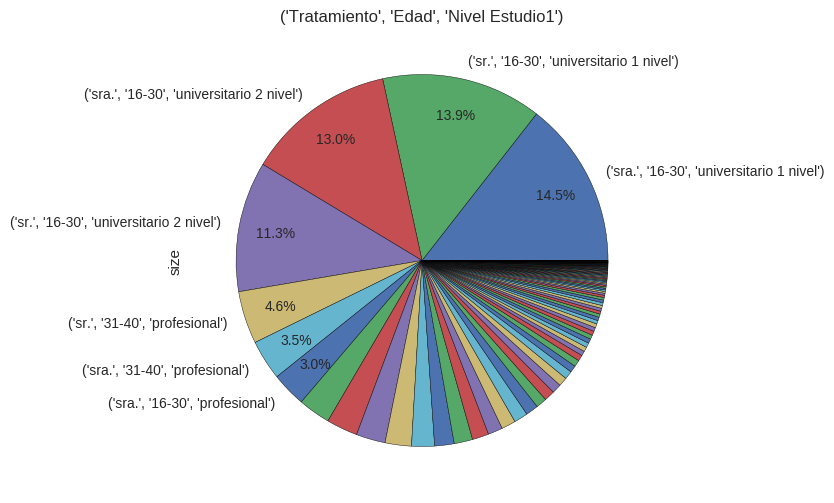

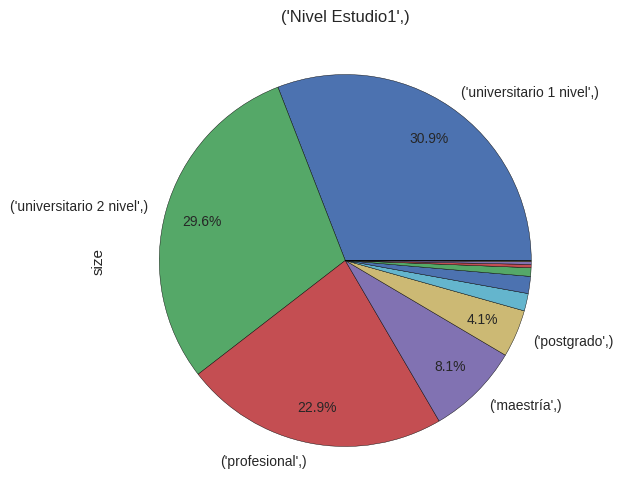

In [165]:
from IPython.display import display


def mypct(pct):
    return '%.1f%%' % pct if pct >= THRESHOLD else ''

def mylabels(count_df):
    return [(x if float(count_df.ix[[x]]['percentage'][0][:-1]) >= THRESHOLD else '') for x in count_df.index]

THRESHOLD = 3
N = 12
c = 1
for k in combinations_counter_dict:
    cn = combinations_counter_dict[k]
    print('GROUP #', c)
    print('GROUP BY:', k)
    print('NUMBER OF GROUPS:', len(cn))
    print('TOP', N, 'LARGEST GROUPS:')
    total = sum(cn.values())
    df = pd.DataFrame(
        [(a, b, total, '{:.2%}'.format(b / total)) for a, b in cn.most_common()],
        columns=(k, 'size', 'total', 'percentage'),
    )
    display(df.head(N))
    c += 1
    
    plt.figure()
    count_df = df.set_index(k)
    count_df['size'].plot(
        kind='pie', autopct=mypct, pctdistance=0.8, labels=mylabels(count_df), figsize=(6,6), title=k)

#### Área de estudios

In [166]:
combs = [
    ('Área de Estudio1',), # Área de estudio en estos barrios
    ('Tratamiento', 'Edad', 'Área de Estudio1'), # Área de estudio en estos barrios por edad y sexo
]

In [167]:
%%time

combinations_counter_dict = {}

for comb in combs:
    df = barrios_bogota_df[list(comb)]
    groups = [tuple(x) for i, x in df.iterrows()]
    counter = Counter(groups)
    combinations_counter_dict[comb] = counter
    print(comb, len(counter))

('Área de Estudio1',) 111
('Tratamiento', 'Edad', 'Área de Estudio1') 672
CPU times: user 1.59 s, sys: 9.87 ms, total: 1.6 s
Wall time: 1.58 s


GROUP # 1
GROUP BY: ('Tratamiento', 'Edad', 'Área de Estudio1')
NUMBER OF GROUPS: 672
TOP 12 LARGEST GROUPS:


,"(Tratamiento, Edad, Área de Estudio1)",size,total,percentage
0,"(sra., 16-30, derecho)",326,8567,3.81%
1,"(sr., 16-30, derecho)",287,8567,3.35%
2,"(sra., 16-30, literatura)",163,8567,1.90%
3,"(sra., 16-30, pedagogía)",163,8567,1.90%
4,"(sra., 16-30, ciencias sociales)",137,8567,1.60%
5,"(sra., 16-30, idiomas)",136,8567,1.59%
6,"(sr., 16-30, ciencias sociales)",133,8567,1.55%
7,"(sr., 31-40, derecho)",133,8567,1.55%
8,"(sra., 16-30, psicología)",128,8567,1.49%
9,"(sr., 16-30, filosofía y letras)",122,8567,1.42%


GROUP # 2
GROUP BY: ('Área de Estudio1',)
NUMBER OF GROUPS: 111
TOP 12 LARGEST GROUPS:


,"(Área de Estudio1,)",size,total,percentage
0,"(derecho,)",1036,8567,12.09%
1,"(literatura,)",441,8567,5.15%
2,"(pedagogía,)",410,8567,4.79%
3,"(ciencias sociales,)",403,8567,4.70%
4,"(psicología,)",350,8567,4.09%
5,"(filosofía y letras,)",346,8567,4.04%
6,"(historia,)",328,8567,3.83%
7,"(idiomas,)",296,8567,3.46%
8,"(economía,)",271,8567,3.16%
9,"(arquitectura,)",216,8567,2.52%


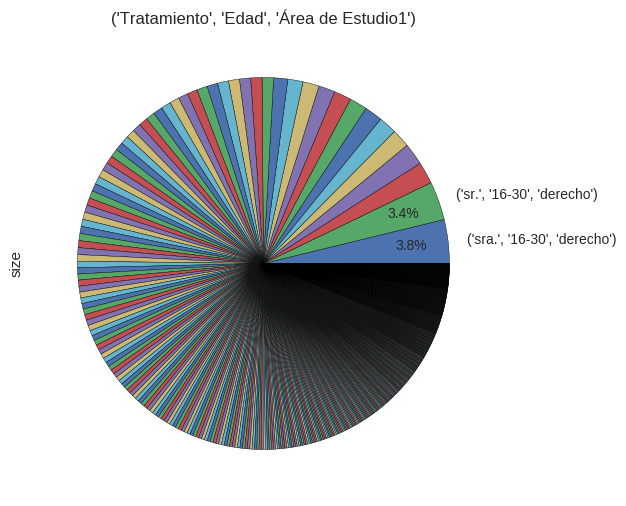

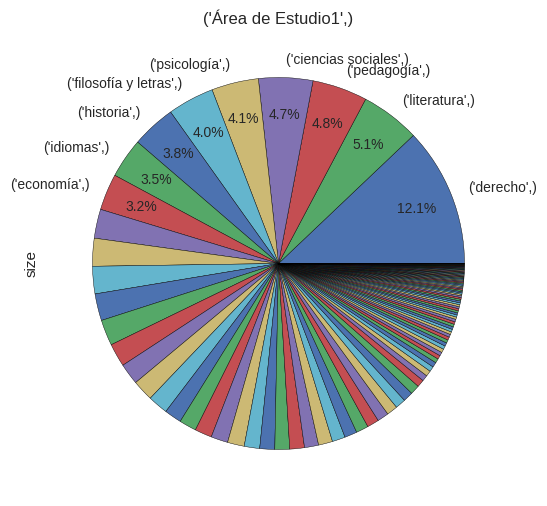

In [168]:
from IPython.display import display


def mypct(pct):
    return '%.1f%%' % pct if pct >= THRESHOLD else ''

def mylabels(count_df):
    return [(x if float(count_df.ix[[x]]['percentage'][0][:-1]) >= THRESHOLD else '') for x in count_df.index]

THRESHOLD = 3
N = 12
c = 1
for k in combinations_counter_dict:
    cn = combinations_counter_dict[k]
    print('GROUP #', c)
    print('GROUP BY:', k)
    print('NUMBER OF GROUPS:', len(cn))
    print('TOP', N, 'LARGEST GROUPS:')
    total = sum(cn.values())
    df = pd.DataFrame(
        [(a, b, total, '{:.2%}'.format(b / total)) for a, b in cn.most_common()],
        columns=(k, 'size', 'total', 'percentage'),
    )
    display(df.head(N))
    c += 1
    
    plt.figure()
    count_df = df.set_index(k)
    count_df['size'].plot(
        kind='pie', autopct=mypct, pctdistance=0.8, labels=mylabels(count_df), figsize=(6,6), title=k)

## (a) x < 10

In [169]:
barrios = [b for b, c in barrios_counter_df.iteritems() if c < 10]

In [170]:
instruction = "barrios_bogota_df = "
instruction += "perfiles_bogota_df["
for b in barrios:
    instruction += "(perfiles_bogota_df['Barrio'] == '" + b + "') | "
instruction = instruction[:-3]
instruction += "]"

In [171]:
exec(instruction)

In [172]:
barrios_bogota_df.head()

,Barrio,Tratamiento,Edad,Nivel Estudio1,Área de Estudio1
82,biblioteca serv publico,sr.,51-64,postgrado,derecho
259,bosques de modelia,sr.,51-64,profesional,pedagogía
272,cristales,sr.,31-40,profesional,comunicación social
299,jardines de castilla,sr.,16-30,universitario 1 nivel,física
308,retiro chapinero,sra.,65+,maestría,ciencias sociales


#### Nivel de estudios

In [173]:
combs = [
    ('Nivel Estudio1',), # Nivel de estudio en estos barrios
    ('Tratamiento', 'Edad', 'Nivel Estudio1'), # Nivel de estudio en estos barrios por edad y sexo
]

In [174]:
%%time

combinations_counter_dict = {}

for comb in combs:
    df = barrios_bogota_df[list(comb)]
    groups = [tuple(x) for i, x in df.iterrows()]
    counter = Counter(groups)
    combinations_counter_dict[comb] = counter
    print(comb, len(counter))

('Nivel Estudio1',) 11
('Tratamiento', 'Edad', 'Nivel Estudio1') 86
CPU times: user 584 ms, sys: 1.85 ms, total: 586 ms
Wall time: 584 ms


GROUP # 1
GROUP BY: ('Tratamiento', 'Edad', 'Nivel Estudio1')
NUMBER OF GROUPS: 86
TOP 12 LARGEST GROUPS:


,"(Tratamiento, Edad, Nivel Estudio1)",size,total,percentage
0,"(sra., 16-30, universitario 1 nivel)",468,3154,14.84%
1,"(sr., 16-30, universitario 1 nivel)",451,3154,14.30%
2,"(sra., 16-30, universitario 2 nivel)",437,3154,13.86%
3,"(sr., 16-30, universitario 2 nivel)",381,3154,12.08%
4,"(sr., 31-40, profesional)",131,3154,4.15%
5,"(sra., 31-40, profesional)",106,3154,3.36%
6,"(sr., 31-40, universitario 2 nivel)",95,3154,3.01%
7,"(sra., 16-30, profesional)",92,3154,2.92%
8,"(sr., 16-30, profesional)",77,3154,2.44%
9,"(sr., 51-64, profesional)",65,3154,2.06%


GROUP # 2
GROUP BY: ('Nivel Estudio1',)
NUMBER OF GROUPS: 11
TOP 12 LARGEST GROUPS:


,"(Nivel Estudio1,)",size,total,percentage
0,"(universitario 1 nivel,)",1021,3154,32.37%
1,"(universitario 2 nivel,)",1006,3154,31.90%
2,"(profesional,)",657,3154,20.83%
3,"(maestría,)",236,3154,7.48%
4,"(postgrado,)",106,3154,3.36%
5,"(graduado,)",42,3154,1.33%
6,"(doctorado,)",37,3154,1.17%
7,"(técnico,)",29,3154,0.92%
8,"(tecnológico,)",13,3154,0.41%
9,"(secundaria,)",6,3154,0.19%


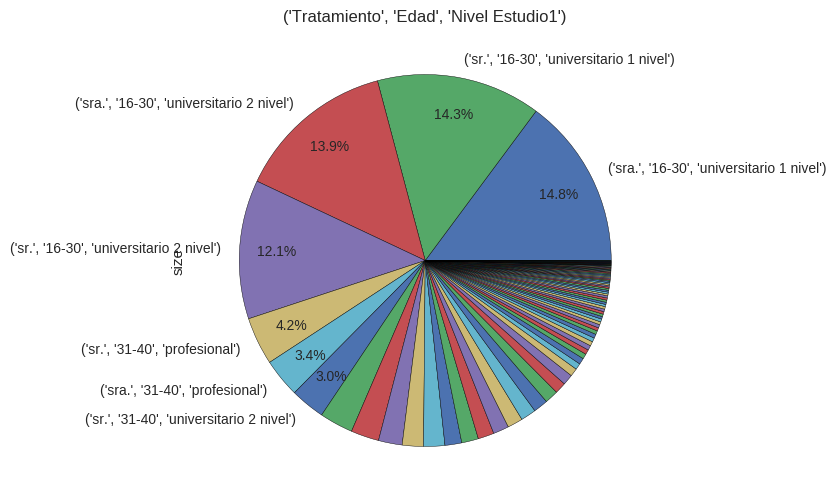

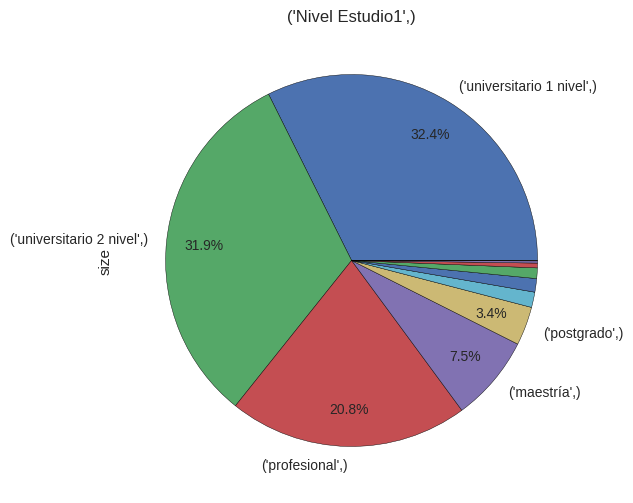

In [175]:
from IPython.display import display


def mypct(pct):
    return '%.1f%%' % pct if pct >= THRESHOLD else ''

def mylabels(count_df):
    return [(x if float(count_df.ix[[x]]['percentage'][0][:-1]) >= THRESHOLD else '') for x in count_df.index]

THRESHOLD = 3
N = 12
c = 1
for k in combinations_counter_dict:
    cn = combinations_counter_dict[k]
    print('GROUP #', c)
    print('GROUP BY:', k)
    print('NUMBER OF GROUPS:', len(cn))
    print('TOP', N, 'LARGEST GROUPS:')
    total = sum(cn.values())
    df = pd.DataFrame(
        [(a, b, total, '{:.2%}'.format(b / total)) for a, b in cn.most_common()],
        columns=(k, 'size', 'total', 'percentage'),
    )
    display(df.head(N))
    c += 1
    
    plt.figure()
    count_df = df.set_index(k)
    count_df['size'].plot(
        kind='pie', autopct=mypct, pctdistance=0.8, labels=mylabels(count_df), figsize=(6,6), title=k)

#### Área de estudios

In [176]:
combs = [
    ('Área de Estudio1',), # Área de estudio en estos barrios
    ('Tratamiento', 'Edad', 'Área de Estudio1'), # Área de estudio en estos barrios por edad y sexo
]

In [177]:
%%time

combinations_counter_dict = {}

for comb in combs:
    df = barrios_bogota_df[list(comb)]
    groups = [tuple(x) for i, x in df.iterrows()]
    counter = Counter(groups)
    combinations_counter_dict[comb] = counter
    print(comb, len(counter))

('Área de Estudio1',) 109
('Tratamiento', 'Edad', 'Área de Estudio1') 480
CPU times: user 874 ms, sys: 2.6 ms, total: 877 ms
Wall time: 870 ms


GROUP # 1
GROUP BY: ('Tratamiento', 'Edad', 'Área de Estudio1')
NUMBER OF GROUPS: 480
TOP 12 LARGEST GROUPS:


,"(Tratamiento, Edad, Área de Estudio1)",size,total,percentage
0,"(sra., 16-30, derecho)",100,3154,3.17%
1,"(sr., 16-30, derecho)",92,3154,2.92%
2,"(sra., 16-30, pedagogía)",92,3154,2.92%
3,"(sr., 16-30, ciencias sociales)",74,3154,2.35%
4,"(sra., 16-30, literatura)",72,3154,2.28%
5,"(sra., 16-30, ciencias sociales)",64,3154,2.03%
6,"(sra., 16-30, psicología)",63,3154,2.00%
7,"(sra., 16-30, idiomas)",62,3154,1.97%
8,"(sr., 16-30, literatura)",49,3154,1.55%
9,"(sr., 16-30, filosofía y letras)",46,3154,1.46%


GROUP # 2
GROUP BY: ('Área de Estudio1',)
NUMBER OF GROUPS: 109
TOP 12 LARGEST GROUPS:


,"(Área de Estudio1,)",size,total,percentage
0,"(derecho,)",320,3154,10.15%
1,"(ciencias sociales,)",196,3154,6.21%
2,"(pedagogía,)",194,3154,6.15%
3,"(literatura,)",185,3154,5.87%
4,"(psicología,)",137,3154,4.34%
5,"(idiomas,)",133,3154,4.22%
6,"(filosofía y letras,)",117,3154,3.71%
7,"(historia,)",108,3154,3.42%
8,"(sociología,)",87,3154,2.76%
9,"(economía,)",85,3154,2.69%


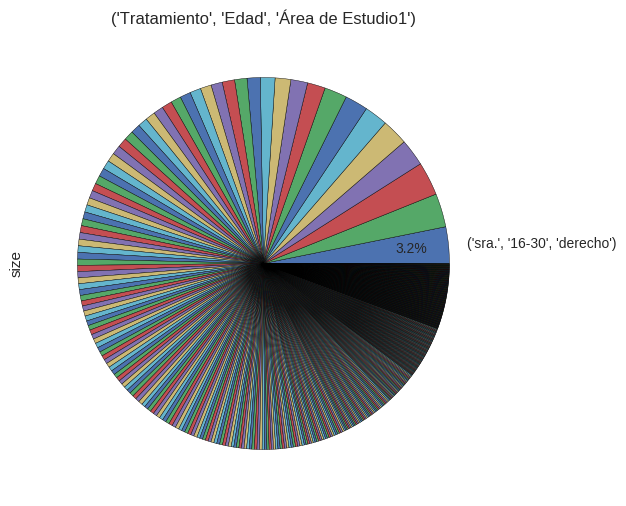

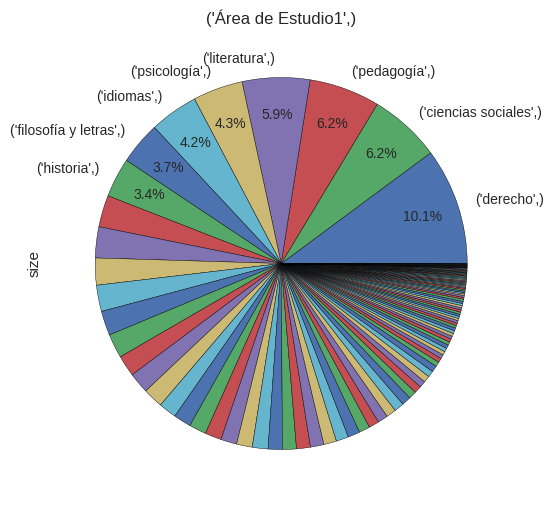

In [178]:
from IPython.display import display


def mypct(pct):
    return '%.1f%%' % pct if pct >= THRESHOLD else ''

def mylabels(count_df):
    return [(x if float(count_df.ix[[x]]['percentage'][0][:-1]) >= THRESHOLD else '') for x in count_df.index]

THRESHOLD = 3
N = 12
c = 1
for k in combinations_counter_dict:
    cn = combinations_counter_dict[k]
    print('GROUP #', c)
    print('GROUP BY:', k)
    print('NUMBER OF GROUPS:', len(cn))
    print('TOP', N, 'LARGEST GROUPS:')
    total = sum(cn.values())
    df = pd.DataFrame(
        [(a, b, total, '{:.2%}'.format(b / total)) for a, b in cn.most_common()],
        columns=(k, 'size', 'total', 'percentage'),
    )
    display(df.head(N))
    c += 1
    
    plt.figure()
    count_df = df.set_index(k)
    count_df['size'].plot(
        kind='pie', autopct=mypct, pctdistance=0.8, labels=mylabels(count_df), figsize=(6,6), title=k)